<a href="https://colab.research.google.com/github/jdiazram/clima-uta/blob/main/UTA_Weather_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

This code is the implementation of the project UTA-MAYOR N°6726-20 of the Universidad de Tarapaca

# Importing libraries and loading utility functions

In [ ]:
# solo para google colab
%pip install statsmodels
#%pip install --upgrade statsmodels
#%pip install -Iv statsmodels==0.8

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!npx degit ClimaUta/vizUTAMayor/scripts -f

npx: installed 1 in 2.575s
> destination directory is not empty. Using --force, continuing
> cloned ClimaUta/vizUTAMayor#HEAD


In [ ]:
# universal Use 
import os
import datetime
import matplotlib.pyplot as plt
import numpy as np
import pandas
import sqlalchemy
# import pymysql
import joblib
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings('ignore')

#Models
from statsmodels.tsa.arima.model import ARIMA
#
import tensorflow as tf
#
from sklearn.ensemble import RandomForestRegressor

# function to create time characteristics based on a type variable *datetime*
def createTimeFeatures (dfToExpand):
    dfToExpand['minute'] = pandas.to_datetime(dfToExpand['utc']).dt.minute
    dfToExpand['hour'] = pandas.to_datetime(dfToExpand['utc']).dt.hour
    dfToExpand['day'] = pandas.to_datetime(dfToExpand['utc']).dt.day
    dfToExpand['month'] = pandas.to_datetime(dfToExpand['utc']).dt.month
    dfToExpand['year'] = pandas.to_datetime(dfToExpand['utc']).dt.year
    return dfToExpand

In [ ]:
#GPU
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
Found GPU at: /device:GPU:0


# **ARIMA Model**

In [ ]:
#data
!wget https://raw.githubusercontent.com/ClimaUta/vizUTAMayor/master/scripts/dataPreprocessed.csv

--2022-11-17 12:32:20--  https://raw.githubusercontent.com/ClimaUta/vizUTAMayor/master/scripts/dataPreprocessed.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1527063 (1.5M) [text/plain]
Saving to: ‘dataPreprocessed.csv.1’

dataPreprocessed.cs 100%[===================>]   1.46M  --.-KB/s    in 0.008s  

2022-11-17 12:32:20 (187 MB/s) - ‘dataPreprocessed.csv.1’ saved [1527063/1527063]



In [ ]:
df = pandas.read_csv("dataPreprocessed.csv",parse_dates=['utc'],index_col=['utc'])
#
lendf = len(df)
valSlice=0.7
testDFSlice=0.9
lendf = len(df)
lendf = round(lendf*testDFSlice)
train_df = df[0:lendf]
test_df = df[lendf:len(df)]

train_df = train_df.interpolate(method="linear")
series = train_df[-72:]
series.index = series.index.to_period('H')
future = 72

In [ ]:
%%capture
stackPreds = pandas.DataFrame()
model = ARIMA(series['Ts_Valor'], order=(24,1,1))
model_fit = model.fit()
stackPreds['Ts_Valor'] = model_fit.forecast(future)
model = ARIMA(series['HR_Valor'], order=(24,1,1))
model_fit = model.fit()
stackPreds['HR_Valor'] = model_fit.forecast(future)
model = ARIMA(series['QFE_Valor'], order=(24,1,1))
model_fit = model.fit()
stackPreds['QFE_Valor'] = model_fit.forecast(future)
# last train_df date: 2022-06-06 01:00:00

## Evaluation

In [ ]:
#from pandas._libs.tslibs.timestamps import Timestamp
a=series.last_valid_index()
now=a.to_timestamp()
now

Timestamp('2022-03-14 22:00:00')

In [ ]:
test_df.head()

,Ts_Valor,HR_Valor,QFE_Valor
utc,,,
2022-03-14 23:00:00,20.4,70.0,1006.9
2022-03-15 00:00:00,19.6,74.0,1008.2
2022-03-15 01:00:00,20.0,68.0,1009.7
2022-03-15 02:00:00,19.4,70.0,1010.6
2022-03-15 03:00:00,19.8,68.0,1010.4


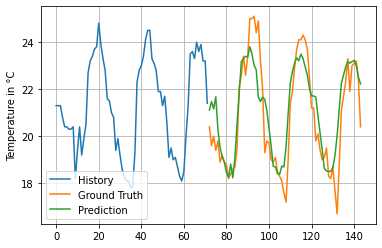

In [ ]:
var='Ts_Valor'
#plotdf = np.array(train_df[var][-72:].values)
plotdf = np.array(series[var][-72:].values)
plotdf = np.append(plotdf,test_df[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF
plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Temperature in °C")
plt.legend()
plt.grid()
plt.show()

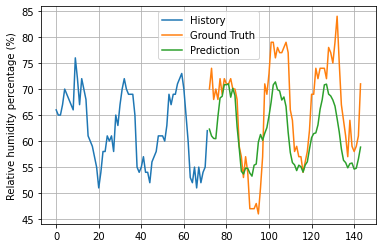

In [ ]:
var='HR_Valor'
#plotdf = np.array(train_df[var][-72:].values)
plotdf = np.array(series[var][-72:].values)
plotdf = np.append(plotdf,test_df[var][0:72].values)
#plotdf.shape
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF
plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Relative humidity percentage (%)")
plt.legend()
plt.grid()
plt.show()

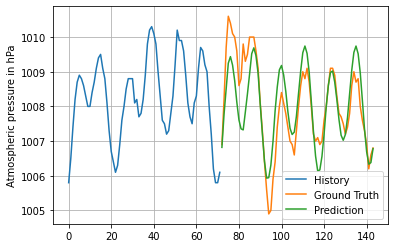

In [ ]:
var='QFE_Valor'
#plotdf = np.array(train_df[var][-72:].values)
plotdf = np.array(series[var][-72:].values)
plotdf = np.append(plotdf,test_df[var][0:72].values)
#plotdf.shape
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF
plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Atmospheric pressure in hPa")
plt.legend()
plt.grid()
plt.show()

In [ ]:
#a = mean_absolute_error(stackPreds,test_df[['Ts_Valor','HR_Valor','QFE_Valor']][0:72],multioutput='raw_values')
a = mean_squared_error(stackPreds,test_df[['Ts_Valor','HR_Valor','QFE_Valor']][0:72],multioutput='raw_values')
a

array([ 1.33630602, 56.72124396,  0.59501289])

# **DNN Model**

In [ ]:
df = pandas.read_csv("dataPreprocessed.csv")
df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]

#To zoom graphs
first = 0
last = first+72

lendf = len(df)
lendf = round(lendf*testDFSlice)
train_df = df[0:lendf]
test_df = df[lendf:len(df)]
features = train_df.shape[1]

varToPred = ['Ts_Valor','HR_Valor','QFE_Valor']
train_labels = df[varToPred][0:len(train_df)]
test_labels = df[varToPred][lendf:]

# normalizing
train_mean = train_df.mean()
train_std = train_df.std()
train_df = (train_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std
train_labels = (train_labels - train_mean[varToPred]) / train_std[varToPred]
test_labels = (test_labels - train_mean[varToPred]) / train_std[varToPred]

train_df = train_df[['hour','day','month']]
test_df = test_df[['hour','day','month']]
features = train_df.ndim + 1

In [ ]:
np_train_df = np.array(train_df)
#test_df = np.array(test_df)
np_train_labels = np.array(train_labels)
#test_labels = np.array(test_labels)

dnnModel = tf.keras.Sequential()
dnnModel.add(tf.keras.layers.Dense(672,input_shape=(features,))) 
dnnModel.add(tf.keras.layers.Dense(1024,activation='relu'))###
dnnModel.add(tf.keras.layers.Dense(2048,activation='relu'))###
dnnModel.add(tf.keras.layers.Dense(672,activation='relu'))###
dnnModel.add(tf.keras.layers.Dense(168,activation='relu'))
dnnModel.add(tf.keras.layers.Dense(72,activation='relu'))
dnnModel.add(tf.keras.layers.Dense(24,activation='relu'))
dnnModel.add(tf.keras.layers.Dense(3))

In [ ]:
with tf.device('/device:GPU:0'):
  dnnModel.compile(
      optimizer=tf.optimizers.Adam(),
      #learning_rate = 0.001,
      loss='mse', # 'mean_squared_error',
      metrics=[tf.keras.metrics.MeanSquaredError()] 
  )
  history = dnnModel.fit(
      np_train_df, np_train_labels,
      epochs=100,
      verbose=1,
      shuffle=True,
      validation_split=0.15
  )

Epoch 1/100
978/978 [==============================] - 9s 6ms/step - loss: 0.4128 - mean_squared_error: 0.4128 - val_loss: 1.1313 - val_mean_squared_error: 1.1313
Epoch 2/100
978/978 [==============================] - 6s 6ms/step - loss: 0.3622 - mean_squared_error: 0.3622 - val_loss: 1.1369 - val_mean_squared_error: 1.1369
Epoch 3/100
978/978 [==============================] - 6s 6ms/step - loss: 0.3542 - mean_squared_error: 0.3542 - val_loss: 1.1615 - val_mean_squared_error: 1.1615
Epoch 4/100
978/978 [==============================] - 7s 7ms/step - loss: 0.3489 - mean_squared_error: 0.3489 - val_loss: 1.1175 - val_mean_squared_error: 1.1175
Epoch 5/100
978/978 [==============================] - 6s 6ms/step - loss: 0.3441 - mean_squared_error: 0.3441 - val_loss: 1.1514 - val_mean_squared_error: 1.1514
Epoch 6/100
978/978 [==============================] - 6s 6ms/step - loss: 0.3401 - mean_squared_error: 0.3401 - val_loss: 1.1656 - val_mean_squared_error: 1.1656
Epoch 7/100
978/978 [=

In [ ]:
df=pandas.DataFrame(history.history)
df.head()

,loss,mean_squared_error,val_loss,val_mean_squared_error
0,0.412829,0.412829,1.131279,1.131279
1,0.362186,0.362186,1.136907,1.136907
2,0.354232,0.354232,1.161456,1.161456
3,0.348863,0.348863,1.117466,1.117466
4,0.344108,0.344108,1.151397,1.151397


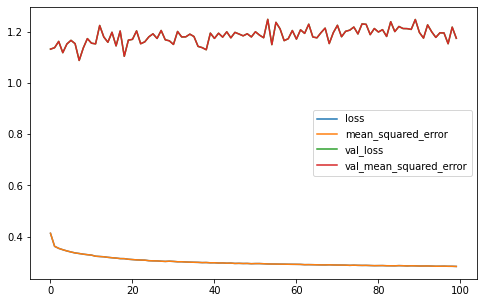

In [ ]:
df.plot(figsize=(8, 5))

## Evaluation

In [ ]:
x = dnnModel.predict(test_df[:72])

stackPreds = pandas.DataFrame(x)
stackPreds.columns = ['Ts_Valor','HR_Valor','QFE_Valor']
test_labels = pandas.DataFrame(test_labels)
test_labels.columns = ['Ts_Valor','HR_Valor','QFE_Valor']

3/3 [==============================] - 0s 8ms/step


In [ ]:
stackPreds = stackPreds * train_std + train_mean
test_labels = test_labels * train_std + train_mean
train_labels = train_labels * train_std + train_mean
stackPreds = stackPreds.reset_index(drop=True)
test_labels = test_labels.reset_index(drop=True)
train_labels = train_labels.reset_index(drop=True)

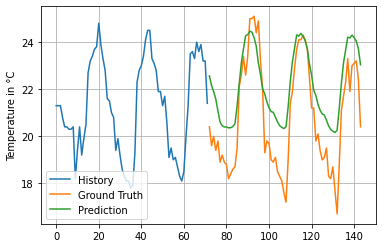

In [ ]:

var = 'Ts_Valor'

plotdf = np.array(train_labels[var][-72:].values)
plotdf = np.append(plotdf,test_labels[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF
plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Temperature in °C")
plt.legend()
plt.grid()
plt.show()

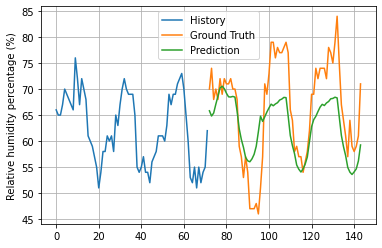

In [ ]:

var = 'HR_Valor'

plotdf = np.array(train_labels[var][-72:].values)
plotdf = np.append(plotdf,test_labels[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF
plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Relative humidity percentage (%)")
plt.legend()
plt.grid()
plt.show()

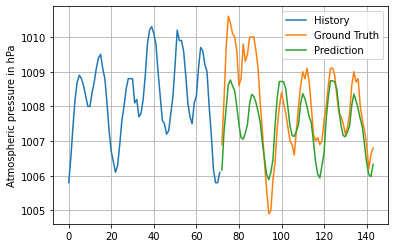

In [ ]:

var = 'QFE_Valor'

plotdf = np.array(train_labels[var][-72:].values)
plotdf = np.append(plotdf,test_labels[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF
plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Atmospheric pressure in hPa")
plt.legend()
plt.grid()
plt.show()

In [ ]:
#a = mean_absolute_error(stackPreds[['Ts_Valor','HR_Valor','QFE_Valor']],test_labels[['Ts_Valor','HR_Valor','QFE_Valor']][0:72],multioutput='raw_values')
a = mean_squared_error(stackPreds[['Ts_Valor','HR_Valor','QFE_Valor']],test_labels[['Ts_Valor','HR_Valor','QFE_Valor']][0:72],multioutput='raw_values')
a

array([ 2.78349931, 52.08986941,  0.97765593])

# **RF Model**

In [ ]:
# Selection and integration
df = pandas.read_csv("dataPreprocessed.csv")
df = createTimeFeatures(df)
df.pop('minute')
df.pop('year')
dates_df = df.pop('utc')
rfDFSlice=testDFSlice+0.00001

# Data preparation and labels
topred = df[['Ts_Valor','HR_Valor','QFE_Valor']]
topred = topred[1:]
df = df[:-1]

# dividing dataset
lendf = len(df)
lendf = round(lendf*rfDFSlice)
train_df = df[0:lendf]
train_labels = topred[0:lendf]
test_df = df[lendf:len(df)]
test_labels = topred[lendf:len(df)]
#test_df.head()

In [ ]:
rfModel = RandomForestRegressor()
rfModel.fit(train_df.values,train_labels.values)

predRF = rfModel.predict(test_df)
test_df = test_df.reset_index(drop=True)

## Evaluation
Through traditional testing:

In [ ]:
#a = mean_absolute_error(predRF[first:last],test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last],multioutput='raw_values')
a = mean_squared_error(predRF[first:last],test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last],multioutput='raw_values')
a

array([0.26934069, 6.8266875 , 0.11557693])

## Evaluation N°2

In [ ]:
#now = datetime.datetime.now()
stackPreds = pandas.DataFrame()
features = 6
x = rfModel.predict(train_df[len(train_df)-1:])

In [ ]:
%%capture
for i in range(0,72):
    # Each iteration adds 3600 seconds (1 hour) to the date defined by 'now'
    delta = now + datetime.timedelta(0,i*3600)
    # The predictions generated by the model and together with the new date are saved in a temporary variable 'delta'
    temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
    # The prediction generated for this iteration is added to the prediction stack.
    stackPreds = stackPreds.append(pandas.DataFrame(temp).transpose())
    # Formatting record to feed the model
    temp_RE = np.reshape(temp,(-1,features))
    x = rfModel.predict(temp_RE)

In [ ]:
stackPreds = stackPreds.reset_index(drop=True)
test_labels = test_labels.reset_index(drop=True)
stackPreds.columns = ['Ts_Valor','HR_Valor','QFE_Valor','h','d','m']
stackPreds = stackPreds[['Ts_Valor','HR_Valor','QFE_Valor']]

In [ ]:
#x = ((stackPreds - test_df[['Ts_Valor','HR_Valor','QFE_Valor']][0:72]))
#x.mean()
a = mean_squared_error(stackPreds,test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last],multioutput='raw_values')
a

array([ 2.27352746, 41.5982822 ,  1.11939475])

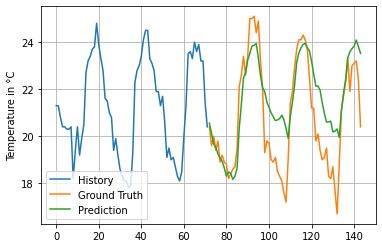

In [ ]:

var = 'Ts_Valor'
plotdf = np.array(train_labels[var][-72:].values)
plotdf = np.append(plotdf,test_df[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF

plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Temperature in °C")
plt.legend()
plt.grid()
plt.show()

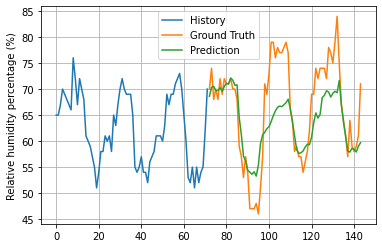

In [ ]:
var = 'HR_Valor'
plotdf = np.array(train_labels[var][-72:].values)
plotdf = np.append(plotdf,test_df[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF

plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Relative humidity percentage (%)")
plt.legend()
plt.grid()
plt.show()

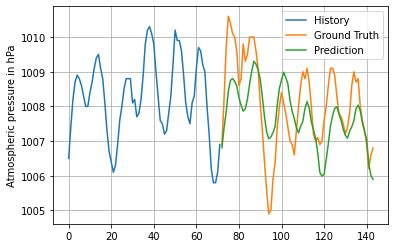

In [ ]:
var = 'QFE_Valor'
plotdf = np.array(train_labels[var][-72:].values)
plotdf = np.append(plotdf,test_df[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF

plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Atmospheric pressure in hPa")
plt.legend()
plt.grid()
plt.show()

# **LSTM Model**

In [ ]:
def norm(value,index):
    #value = (value - modelMean[index]) / modelStd[index]
    value = (value - train_mean[index]) / train_std[index]
    return value

In [ ]:
df = pandas.read_csv("dataPreprocessed.csv")
# Creating slices for datasets
lendf = len(df)
val_len = round(lendf*valSlice)
test_len = round(lendf*testDFSlice)

#saving non-normalized values
train_labels2 = df[0:val_len]
val_labels2 = df[val_len:test_len]
test_labels2 = df[test_len:]

df = createTimeFeatures(df)
dates_df = df.pop('utc')
dates_df = df.pop('minute')
dates_df = df.pop('year')
#df

In [ ]:
## normalized
train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std

In [ ]:
## Creation of training, validation and testing datasets
train_df = df[0:val_len]
train_labels = df[['Ts_Valor','HR_Valor','QFE_Valor']][0:val_len]
val_df = df[val_len:test_len]
val_labels = df[['Ts_Valor','HR_Valor','QFE_Valor']][val_len:test_len]
test_df = df[test_len:lendf]
test_labels = df[['Ts_Valor','HR_Valor','QFE_Valor']][test_len:lendf]

In [ ]:
np_train_df = train_df.to_numpy()
np_val_df = val_df.to_numpy()
np_train_labels = train_labels.to_numpy()
np_val_labels = val_labels.to_numpy()
np_test_df2 = test_df.to_numpy()
np_test_labels2 = test_labels.to_numpy()

In [ ]:
winSize = 24 # passing events as 24hr windows
numFeatures = 6
train_gen = tf.keras.preprocessing.sequence.TimeseriesGenerator(np_train_df,np_train_labels,length=winSize)
val_gen = tf.keras.preprocessing.sequence.TimeseriesGenerator(np_val_df,np_val_labels,length=winSize)
test_gen = tf.keras.preprocessing.sequence.TimeseriesGenerator(np_test_df2,np_test_labels2,length=winSize)

In [ ]:
# np.set_printoptions(suppress=True)
# X,y = train_gen[0]
# print(f'Given the Array: \n{X[0]}')
# print(f'Predict this y: \n {y[0]}')

In [ ]:
lstmModel = tf.keras.Sequential()
lstmModel.add(tf.keras.layers.LSTM(72,input_shape=(winSize,numFeatures,),return_sequences=True))
lstmModel.add(tf.keras.layers.Dense(144,activation="leaky_relu"))
lstmModel.add(tf.keras.layers.Dense(72))
lstmModel.add(tf.keras.layers.Flatten())
lstmModel.add(tf.keras.layers.Dense(3))

In [ ]:
with tf.device('/device:GPU:0'):
  lstmModel.compile(
      optimizer=tf.optimizers.Adam(),
      loss='mse', # o 'mean_squared_error'
      metrics=[tf.keras.metrics.MeanSquaredError()]
  )
  history = lstmModel.fit(
      train_gen,
      epochs=100,
      verbose=1,
      shuffle=True,
      validation_data=val_gen
  )

Epoch 1/100
224/224 [==============================] - 7s 10ms/step - loss: 0.1512 - mean_squared_error: 0.1512 - val_loss: 0.1959 - val_mean_squared_error: 0.1959
Epoch 2/100
224/224 [==============================] - 2s 7ms/step - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.1506 - val_mean_squared_error: 0.1506
Epoch 3/100
224/224 [==============================] - 2s 8ms/step - loss: 0.0607 - mean_squared_error: 0.0607 - val_loss: 0.1324 - val_mean_squared_error: 0.1324
Epoch 4/100
224/224 [==============================] - 2s 8ms/step - loss: 0.0551 - mean_squared_error: 0.0551 - val_loss: 0.1083 - val_mean_squared_error: 0.1083
Epoch 5/100
224/224 [==============================] - 2s 8ms/step - loss: 0.0484 - mean_squared_error: 0.0484 - val_loss: 0.1140 - val_mean_squared_error: 0.1140
Epoch 6/100
224/224 [==============================] - 2s 8ms/step - loss: 0.0565 - mean_squared_error: 0.0565 - val_loss: 0.1045 - val_mean_squared_error: 0.1045
Epoch 7/100
224/224 [

In [ ]:
df=pandas.DataFrame(history.history)
df.head()

,loss,mean_squared_error,val_loss,val_mean_squared_error
0,0.151219,0.151219,0.195908,0.195908
1,0.075937,0.075937,0.150565,0.150565
2,0.060723,0.060723,0.132435,0.132435
3,0.055082,0.055082,0.108330,0.108330
4,0.048396,0.048396,0.114041,0.114041


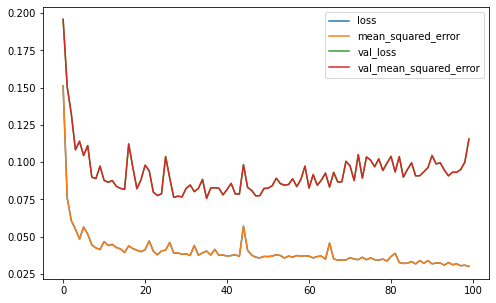

In [ ]:
df.plot(figsize=(8, 5))

## Evaluation

Started by traditional test application

In [ ]:
x = lstmModel.predict_generator(test_gen,verbose=1)
#x = lstmModel.predict(test_gen,verbose=1)
x.shape

32/32 [==============================] - 1s 4ms/step


(4066, 3)

In [ ]:
# de-normalize
X = pandas.DataFrame(x)
X.columns = ['Ts_Valor','HR_Valor','QFE_Valor']
varToPred = ['Ts_Valor','HR_Valor','QFE_Valor']
X = X*train_std[varToPred]+train_mean[varToPred]

In [ ]:
# de-normalize test_labels
test_labels = test_labels.reset_index(drop=True)
test_labels = test_labels*train_std[varToPred]+train_mean[varToPred]

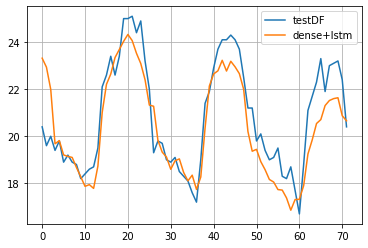

In [ ]:
plt.plot(test_labels[['Ts_Valor']][0:72],label='testDF')
plt.plot(X[['Ts_Valor']][0:72],label='dense+lstm')
plt.grid()
plt.legend()
plt.show()

In [ ]:
a = mean_squared_error(X[['Ts_Valor','HR_Valor','QFE_Valor']][0:72],test_labels[['Ts_Valor','HR_Valor','QFE_Valor']][0:72],multioutput='raw_values')
a

array([ 1.30571794, 50.83532653,  1.39359882])

## Evaluation N°2

In [ ]:
#now = datetime.datetime.now()
df3 = val_df[-24:]
stackPreds = pandas.DataFrame()
lastTrainBatch = val_df[-24:].to_numpy()
# now reshape this lastTrainBatch to meet what input_shape the model expects
lastTrainBatch = lastTrainBatch.reshape((1,winSize,numFeatures))
x = lstmModel.predict(lastTrainBatch)

1/1 [==============================] - 0s 407ms/step


In [ ]:
for i in range(0,72):
    delta = now + datetime.timedelta(0,i*3600)
    temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
    stackPreds = stackPreds.append(pandas.DataFrame(temp).transpose())
    cde = np.reshape(df3,(24,6))
    df3 = np.vstack((cde,temp))
    df3 = np.delete(df3, (0), axis=0)
    df3 = np.reshape(df3,(-1,24,6))
    x = lstmModel.predict(df3)

1/1 [==============================] - 0s 16ms/step


In [ ]:
stackPreds = stackPreds.reset_index(drop=True)
stackPreds.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
stackPreds = stackPreds*train_std+train_mean
# stackPreds

In [ ]:
a = mean_squared_error(stackPreds[['Ts_Valor','HR_Valor','QFE_Valor']],test_labels[['Ts_Valor','HR_Valor','QFE_Valor']][0:72],multioutput='raw_values')
a

array([ 1.66533684, 37.4336767 ,  2.67376656])

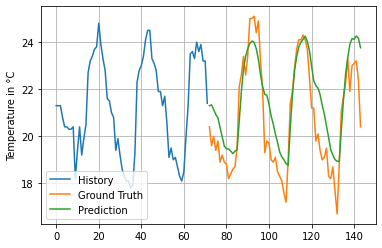

In [ ]:

var = 'Ts_Valor'
plotdf = np.array(val_labels2[var][-72:].values)
plotdf = np.append(plotdf,test_labels2[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF

plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Temperature in °C")
plt.legend()
plt.grid()
plt.show()

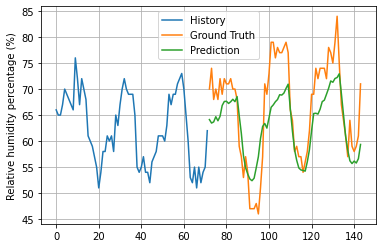

In [ ]:
var = 'HR_Valor'
plotdf = np.array(val_labels2[var][-72:].values)
plotdf = np.append(plotdf,test_labels2[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF

plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Relative humidity percentage (%)")
plt.legend()
plt.grid()
plt.show()


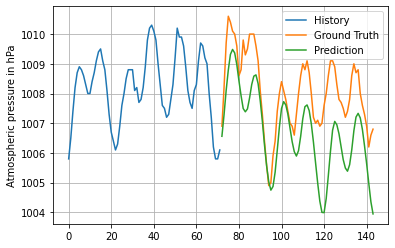

In [ ]:
var = 'QFE_Valor'
plotdf = np.array(val_labels2[var][-72:].values)
plotdf = np.append(plotdf,test_labels2[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF

plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Atmospheric pressure in hPa")
plt.legend()
plt.grid()
plt.show()

# **Transformer model**

In [ ]:
df = pandas.read_csv("dataPreprocessed.csv")
# Creating slices for datasets
lendf = len(df)
val_len = round(lendf*valSlice)
test_len = round(lendf*testDFSlice)

#saving non-normalized values
train_labels2 = df[0:val_len].copy()
val_labels2 = df[val_len:test_len].copy()
test_labels2 = df[test_len:].copy()

dates_df = pandas.to_datetime(df.pop('utc'), format='%Y-%m-%d %H:%M:%S')

#test_labels2.head()

In [ ]:
## normalized
train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std

# Transformation of date-time data into products of sin(X), in order to provide "positionality" to the records
# The positionalities that matter in climatic phenomena are: the time of day and the season of the year
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
day = 24*60*60
year = (365.2425)*day
timeEncode = pandas.DataFrame()

timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df['dsin']=timeEncode['Day sin']
df['ysin']=timeEncode['Year sin']

In [ ]:
## Dataset division
train_df = df[0:val_len]
val_df = df[val_len:test_len]
test_df = df[test_len:]

num_features = df.shape[1]
num_features

5

## window generator

In [ ]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])
  def split_window(self, features):
    inputs = features[:, self.input_slice, :]
    labels = features[:, self.labels_slice, :]
    if self.label_columns is not None:
      labels = tf.stack(
          [labels[:, :, self.column_indices[name]] for name in self.label_columns],
          axis=-1)

    # Slicing doesn't preserve static shape information, so set the shapes
    # manually. This way the `tf.data.Datasets` are easier to inspect.
    inputs.set_shape([None, self.input_width, None])
    labels.set_shape([None, self.label_width, None])

    return inputs, labels
  def make_dataset(self, data):
    data = np.array(data, dtype=np.float32)
    ds = tf.keras.preprocessing.timeseries_dataset_from_array(
        data=data,
        targets=None,
        sequence_length=self.total_window_size,
        sequence_stride=1,
        shuffle=True,
        batch_size=163,)

    ds = ds.map(self.split_window)

    return ds
  @property
  def train(self):
    return self.make_dataset(self.train_df)

  @property
  def val(self):
    return self.make_dataset(self.val_df)

  @property
  def test(self):
    return self.make_dataset(self.test_df)

  @property
  def example(self):
    """Get and cache an example batch of `inputs, labels` for plotting."""
    result = getattr(self, '_example', None)
    if result is None:
      # No example batch was found, so get one from the `.train` dataset
      result = next(iter(self.train))
      # And cache it for next time
      self._example = result
    return result

## window preparation

In [ ]:
winSize=24
winLabel = 24
wide_window = WindowGenerator(
    #input_width=winSize, label_width=24, shift=1, # autoregresivo
    input_width=winSize, label_width=winLabel, shift=24, # semi-autoregresivo
    label_columns=['Ts_Valor','HR_Valor','QFE_Valor','dsin','ysin'])
    #label_columns=['Ts_Valor','HR_Valor','QFE_Valor','ysin','ycos'])


wide_window

Total window size: 48
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47]
Label column name(s): ['Ts_Valor', 'HR_Valor', 'QFE_Valor', 'dsin', 'ysin']

In [ ]:
for example_inputs, example_labels in wide_window.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (163, 24, 5)
Labels shape (batch, time, features): (163, 24, 5)


## Transformer Method Implementation

Source: https://keras.io/examples/timeseries/timeseries_transformer_classification/

In [ ]:
## Window system dimensionality
wide_window.example[0].shape

TensorShape([163, 24, 5])

In [ ]:
from tensorflow.keras import layers
## Building model encoding layer
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    # Normalization and Attention
    x = layers.LayerNormalization(epsilon=1e-6)(inputs)
    x = layers.MultiHeadAttention(
        key_dim=head_size, num_heads=num_heads, dropout=dropout
    )(x, x)
    x = layers.Dropout(dropout)(x)
    res = x + inputs

    # Feed Forward Part
    x = layers.LayerNormalization(epsilon=1e-6)(res)
    # Modifying convolution layers to introduce more variance
    #x = layers.Conv1D(filters=ff_dim, kernel_size=1, activation="relu")(x)
    x = layers.Conv1D(filters=ff_dim, kernel_size=1, activation="leaky_relu")(x)
    x = layers.Dropout(dropout)(x)
    #x = layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    x = layers.Conv1D(filters=inputs.shape[-1], kernel_size=1, activation="leaky_relu")(x)
    return x + res

## Building rest of the model
def build_model(
    input_shape,
    head_size,
    num_heads,
    ff_dim,
    num_transformer_blocks,
    mlp_units,
    dropout=0,
    mlp_dropout=0,
):
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    #x = layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    x = layers.Flatten()(x)
    for dim in mlp_units:
        x = layers.Dense(dim, activation="relu")(x)
        x = layers.Dropout(mlp_dropout)(x)
    ##outputs = layers.Dense(n_classes, activation="softmax")(x)
    outputs = layers.Dense(winLabel*num_features,activation="leaky_relu")(x)
    return tf.keras.Model(inputs, outputs)

In [ ]:
input_shape = wide_window.example[0].shape[1:]
input_shape

TensorShape([24, 5])

In [ ]:
model = build_model(
    input_shape,
    head_size=96, #96
    num_heads=4,
    ff_dim=4,
    num_transformer_blocks=4,
    mlp_units=[128],
    mlp_dropout=0.4,
    dropout=0.25,
)

model.compile(
    loss="mse",
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    metrics=[tf.keras.metrics.MeanSquaredError()],
)

In [ ]:
MAX_EPOCHS=100
def compile_and_fit(model, window, patience=2):
  with tf.device('/device:GPU:0'):
    model.compile(loss=tf.losses.MeanSquaredError(), optimizer=tf.optimizers.Adam(), metrics=[tf.metrics.MeanSquaredError()])
    history = model.fit(window.train, epochs=MAX_EPOCHS, validation_data=window.val,shuffle=True)
  return history

In [ ]:
# Creation, compilation and training of the final model
transModel = tf.keras.models.Sequential()
transModel.add(model)
transModel.add(tf.keras.layers.Dense(winLabel*num_features,activation="linear"))
transModel.add(tf.keras.layers.Reshape([-1, num_features]))

with tf.device('/device:GPU:0'):
  winstory = compile_and_fit(transModel, wide_window)

Epoch 1/100
176/176 [==============================] - 13s 31ms/step - loss: 0.3980 - mean_squared_error: 0.3980 - val_loss: 0.4188 - val_mean_squared_error: 0.4188
Epoch 2/100
176/176 [==============================] - 5s 28ms/step - loss: 0.1963 - mean_squared_error: 0.1963 - val_loss: 0.3164 - val_mean_squared_error: 0.3164
Epoch 3/100
176/176 [==============================] - 5s 27ms/step - loss: 0.1568 - mean_squared_error: 0.1568 - val_loss: 0.2769 - val_mean_squared_error: 0.2769
Epoch 4/100
176/176 [==============================] - 5s 28ms/step - loss: 0.1434 - mean_squared_error: 0.1434 - val_loss: 0.2660 - val_mean_squared_error: 0.2660
Epoch 5/100
176/176 [==============================] - 6s 32ms/step - loss: 0.1356 - mean_squared_error: 0.1356 - val_loss: 0.2535 - val_mean_squared_error: 0.2535
Epoch 6/100
176/176 [==============================] - 6s 33ms/step - loss: 0.1283 - mean_squared_error: 0.1283 - val_loss: 0.2468 - val_mean_squared_error: 0.2468
Epoch 7/100
176

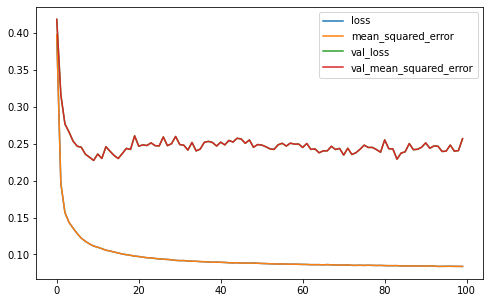

In [ ]:
df5=pandas.DataFrame(winstory.history)
df5.head()
df5.plot(figsize=(8, 5))

In [ ]:
# Dimensionality of inputs and outputs of the model, they must coincide with the previously indicated winSize and winLabels
print('Input shape:', wide_window.example[0].shape)
print('Output shape:', transModel(wide_window.example[0]).shape)

Input shape: (163, 24, 5)
Output shape: (163, 24, 5)


## Autoregressive test (in steps of 24 hours)

In [ ]:
df3 = val_df[-winSize:]
stackPreds = pandas.DataFrame()
df3 = df3.to_numpy()
df3 = df3.reshape((-1,winSize,num_features))
df3.shape

x = transModel.predict(df3)
#x

1/1 [==============================] - 0s 500ms/step


In [ ]:
# Semi-autoregressive prediction prototype (because it goes 24 in 24 steps instead of 1 in 1)
x = transModel.predict(df3)
a = transModel.predict(x)
b = transModel.predict(a)
x = np.hstack((x,a))
x = np.hstack((x,b))

1/1 [==============================] - 0s 25ms/step


In [ ]:
x.shape

(1, 72, 5)

In [ ]:
stackPreds = pandas.DataFrame(np.reshape(x,(72,num_features)))
stackPreds.columns=['Ts_Valor','HR_Valor','QFE_Valor','dsin','ysin']
#stackPreds.columns=['Ts_Valor','HR_Valor','QFE_Valor','ysin','ycos']

In [ ]:
#a = mean_absolute_error(stackPreds[['Ts_Valor','HR_Valor','QFE_Valor']],test_df[['Ts_Valor','HR_Valor','QFE_Valor']][:72],multioutput='raw_values')
a = mean_squared_error(stackPreds[['Ts_Valor','HR_Valor','QFE_Valor']],test_df[['Ts_Valor','HR_Valor','QFE_Valor']][:72],multioutput='raw_values')
a

array([0.20121126, 0.47992519, 0.10819735])

In [ ]:
stackPreds = stackPreds[['Ts_Valor','HR_Valor','QFE_Valor']]
varToPred = ['Ts_Valor','HR_Valor','QFE_Valor']
stackPreds = stackPreds*train_std[varToPred]+train_mean[varToPred]
#stackPreds

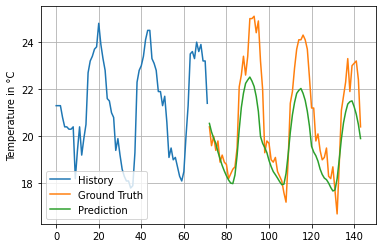

In [ ]:

var = 'Ts_Valor'
plotdf = np.array(val_labels2[var][-72:].values)
plotdf = np.append(plotdf,test_labels2[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF

plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Temperature in °C")
plt.legend()
plt.grid()
plt.show()

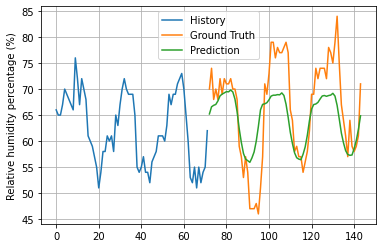

In [ ]:
var = 'HR_Valor'
plotdf = np.array(val_labels2[var][-72:].values)
plotdf = np.append(plotdf,test_labels2[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF

plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Relative humidity percentage (%)")
plt.legend()
plt.grid()
plt.show()

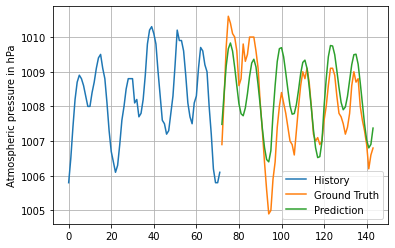

In [ ]:
var = 'QFE_Valor'
plotdf = np.array(val_labels2[var][-72:].values)
plotdf = np.append(plotdf,test_labels2[var][0:72].values)
plotdf.shape
#plotdf
junk=np.array([1]*72)
junk = np.append(junk,stackPreds[var].values)
plotDF = pandas.DataFrame(np.vstack((plotdf,junk)).transpose(),columns=['truth','pred'])
plotDF

plt.plot(plotDF['truth'][:72],label='History')
plt.plot(plotDF['truth'][72:],label='Ground Truth')
plt.plot(plotDF['pred'][72:],label='Prediction')
plt.ylabel("Atmospheric pressure in hPa")
plt.legend()
plt.grid()
plt.show()

# **Global evaluation of models**

In [ ]:
testDFSlice=0.8987

## Horizonte 20

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
ultimoIndex=4000
saltoEntreIndexs=200

In [ ]:
test_labels2.tail()
test_labels2.describe()

,Ts_Valor,HR_Valor,QFE_Valor
count,4090.000000,4090.000000,4090.000000
mean,20.987090,52.462247,1013.084562
std,3.357894,12.569129,3.160915
min,11.000000,35.410000,1004.150000
25%,19.230000,41.230000,1010.800000
50%,22.020000,49.520000,1013.200000
75%,22.960000,63.000000,1015.570000
max,28.070000,100.000000,1021.790000


### Grouping processes of predictions

In [ ]:
from tqdm import tqdm

In [ ]:
%%capture
with tf.device('/device:GPU:0'):
  for i in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    testIndex = i
    print(testIndex)
    df = pandas.read_csv("./dataPreprocessed.csv")
    dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
    timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
    timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
    timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
    df2=df.copy()
    #testDFSlice = 0.95
    test_df2 = df2[int(lendf*testDFSlice):]
    test_df2 = test_df2.reset_index(drop=True)

    df = createTimeFeatures(df)
    df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
    lendf = len(df)
    test_df = df[int(lendf*testDFSlice):]
    test_df = test_df.reset_index(drop=True)
    first = testIndex
    last=first+72
    nowTest = test_df2['utc'][testIndex]
    now = pandas.to_datetime(nowTest)
    now
    train_mean = df.mean()
    train_std = df.std()
    rfPreds = []
    x = rfModel.predict(test_df[first-1:first])
    #rfPreds.append(x)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)

    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    test_df = (test_df - train_mean) / train_std
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last])
    series = test_df[first-72:first]
    future = 72

    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    #lstmPreds.append([x,0,0,0])
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    df2.pop('utc')
    df2 = (df2 - train_mean[0:3]) / train_std[0:3]
    df2['dsin']=timeEncode['Day sin']
    df2['ysin']=timeEncode['Year sin']
    test_df2 = df2[int(lendf*testDFSlice):]
    test_df2 = test_df2.reset_index(drop=True)

    df3 = test_df2[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)


### Average errors for each model

In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,20.000,20.000,20.000,20.000,20.000
mean,0.652,1.480,1.404,1.749,1.291
std,0.285,0.644,0.598,0.670,0.514
min,0.197,0.357,0.387,0.637,0.485
25%,0.483,1.079,1.064,1.274,0.959
50%,0.646,1.557,1.465,1.701,1.277
75%,0.814,1.761,1.835,2.260,1.612
max,1.324,2.778,2.669,2.711,2.445


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,20.000,20.000,20.000,20.000,20.000
mean,0.837,3.199,3.064,4.985,2.607
std,0.638,2.009,1.977,3.337,1.762
min,0.098,0.257,0.219,0.544,0.335
25%,0.468,2.020,1.915,2.792,1.623
50%,0.629,3.255,3.082,4.371,2.387
75%,1.238,3.881,4.075,6.908,3.401
max,2.449,8.145,8.145,14.091,7.691


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,20.000,20.000,20.000,20.000,20.000
mean,2.244,2.044,1.611,3.079,1.425
std,2.947,1.116,0.637,2.557,0.875
min,0.096,0.978,0.870,1.197,0.776
25%,0.285,1.271,1.152,1.574,0.964
50%,1.366,1.392,1.329,2.383,1.163
75%,2.027,3.005,1.996,2.786,1.494
max,10.284,4.584,3.196,11.383,4.789


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,20.000,20.000,20.000,20.000,20.000
mean,-1.432,-91.893,-60.999,-142.408,-48.961
std,2.352,214.652,144.845,324.686,119.795
min,-10.678,-803.816,-567.551,-1200.669,-490.785
25%,-1.399,-28.489,-18.604,-37.597,-16.284
50%,-0.658,-4.365,-4.994,-16.458,-4.299
75%,-0.321,-1.690,-1.619,-2.614,-1.333
max,-0.049,0.198,0.340,-0.657,-0.384


In [ ]:
## average of averages
maes_mean = maeDF.mean()
Tabla = maeDF
Tabla = Tabla.append(maes_mean, ignore_index=True)
#new_tabla=Tabla.assign(Indice=["72","172","272","372","472","572","672","772","872","972","1072","Promedio"])

In [ ]:
mses_mean = mseDF.mean()
Tabla = mseDF
Tabla = Tabla.append(mses_mean, ignore_index=True)

In [ ]:
mapes_mean = mapeDF.mean()
Tabla = mapeDF
Tabla = Tabla.append(mapes_mean, ignore_index=True)

In [ ]:
r2s_mean = r2DF.mean()
Tabla = r2DF
Tabla = Tabla.append(r2s_mean, ignore_index=True)

In [ ]:
#maeDF['arima']

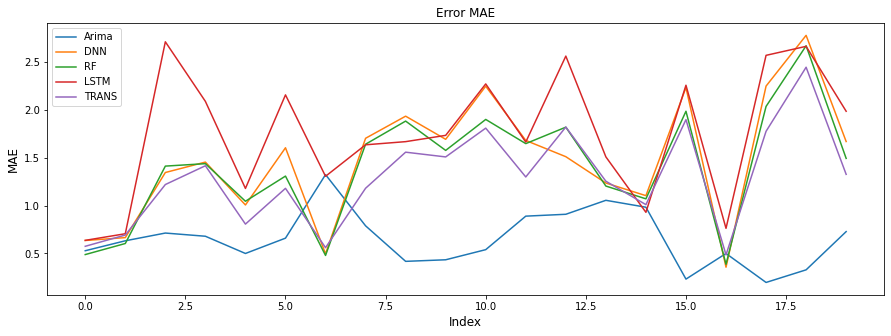

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

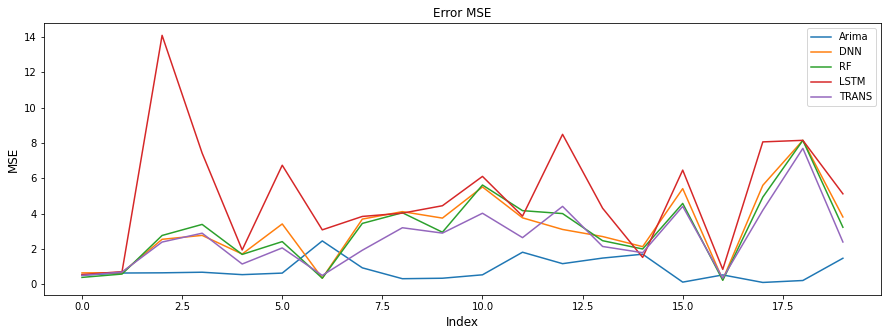

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

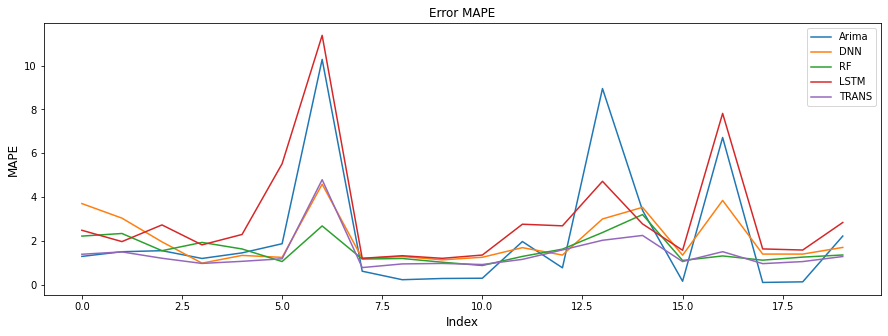

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

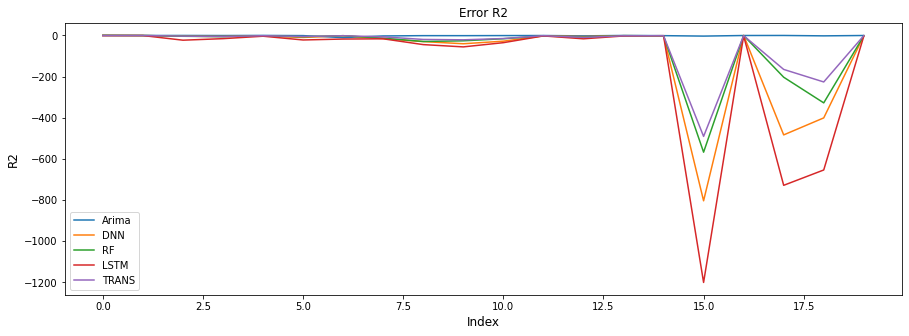

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 40

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
ultimoIndex=4000
saltoEntreIndexs=100

In [ ]:
%%capture
with tf.device('/device:GPU:0'):
  for i in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    testIndex = i
    print(testIndex)
    df = pandas.read_csv("./dataPreprocessed.csv")
    dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
    timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
    timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
    timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
    df2=df.copy()
    #testDFSlice = 0.95
    test_df2 = df2[int(lendf*testDFSlice):]
    test_df2 = test_df2.reset_index(drop=True)

    df = createTimeFeatures(df)
    df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
    lendf = len(df)
    test_df = df[int(lendf*testDFSlice):]
    test_df = test_df.reset_index(drop=True)
    first = testIndex
    last=first+72
    nowTest = test_df2['utc'][testIndex]
    now = pandas.to_datetime(nowTest)
    now
    train_mean = df.mean()
    train_std = df.std()
    rfPreds = []
    x = rfModel.predict(test_df[first-1:first])
    #rfPreds.append(x)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)

    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    test_df = (test_df - train_mean) / train_std
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last])
    series = test_df[first-72:first]
    future = 72

    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    #lstmPreds.append([x,0,0,0])
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    df2.pop('utc')
    df2 = (df2 - train_mean[0:3]) / train_std[0:3]
    df2['dsin']=timeEncode['Day sin']
    df2['ysin']=timeEncode['Year sin']
    test_df2 = df2[int(lendf*testDFSlice):]
    test_df2 = test_df2.reset_index(drop=True)

    df3 = test_df2[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,40.000,40.000,40.000,40.000,40.000
mean,0.688,1.413,1.355,1.666,1.238
std,0.313,0.624,0.597,0.711,0.495
min,0.197,0.357,0.368,0.434,0.465
25%,0.436,0.989,0.975,1.117,0.797
50%,0.649,1.456,1.446,1.707,1.237
75%,0.825,1.721,1.754,2.260,1.521
max,1.540,2.778,2.669,2.978,2.445


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,40.000,40.000,40.000,40.000,40.000
mean,0.938,2.951,2.894,4.595,2.411
std,0.886,1.931,1.919,3.150,1.590
min,0.098,0.257,0.216,0.338,0.311
25%,0.358,1.626,1.520,1.885,1.213
50%,0.637,2.898,2.840,4.256,2.236
75%,1.167,3.816,4.010,6.894,3.086
max,3.951,8.145,8.145,14.091,7.691


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,40.000,40.000,40.000,40.000,40.000
mean,2.089,1.972,1.700,3.171,1.478
std,2.468,1.088,0.948,2.740,0.941
min,0.096,0.978,0.670,1.078,0.776
25%,0.330,1.271,1.083,1.580,0.987
50%,1.496,1.397,1.270,2.182,1.086
75%,2.402,2.174,1.996,3.420,1.509
max,10.284,4.584,4.427,13.034,4.789


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,40.000,40.000,40.000,40.000,40.000
mean,-2.090,-63.686,-43.754,-92.662,-36.181
std,5.461,163.579,111.246,238.168,93.459
min,-34.069,-803.816,-567.551,-1200.669,-490.785
25%,-1.518,-26.074,-16.722,-41.277,-15.614
50%,-0.922,-4.759,-5.392,-16.073,-4.325
75%,-0.477,-1.007,-1.196,-1.113,-1.191
max,-0.049,0.198,0.340,0.056,0.026


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

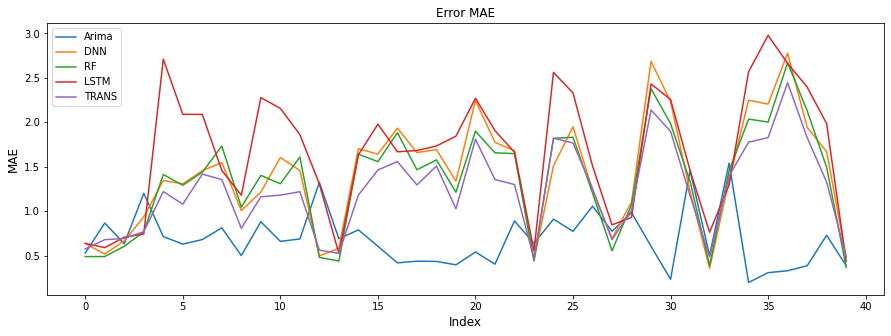

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

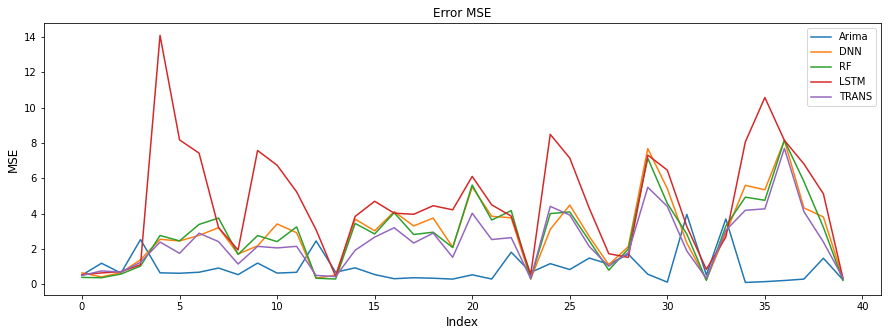

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

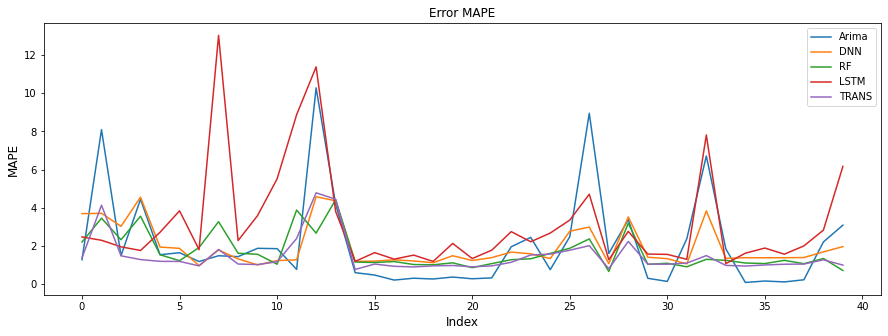

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

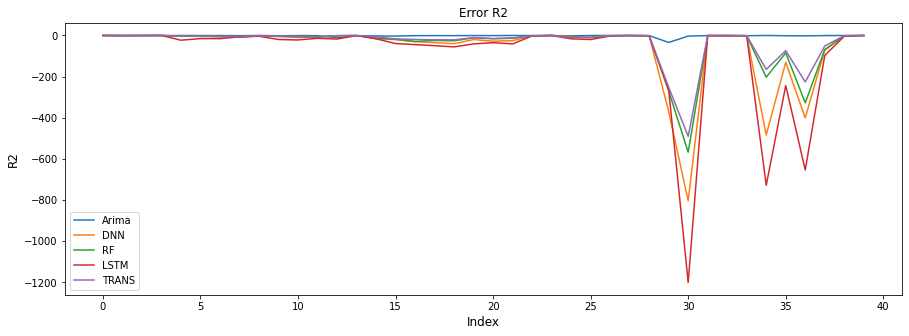

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 60

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
ultimoIndex=4000
saltoEntreIndexs=66

In [ ]:
%%capture
with tf.device('/device:GPU:0'):
  for i in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    testIndex = i
    print(testIndex)
    df = pandas.read_csv("./dataPreprocessed.csv")
    dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
    timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
    timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
    timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
    df2=df.copy()
    #testDFSlice = 0.95
    test_df2 = df2[int(lendf*testDFSlice):]
    test_df2 = test_df2.reset_index(drop=True)

    df = createTimeFeatures(df)
    df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
    lendf = len(df)
    test_df = df[int(lendf*testDFSlice):]
    test_df = test_df.reset_index(drop=True)
    first = testIndex
    last=first+72
    nowTest = test_df2['utc'][testIndex]
    now = pandas.to_datetime(nowTest)
    now
    train_mean = df.mean()
    train_std = df.std()
    rfPreds = []
    x = rfModel.predict(test_df[first-1:first])
    #rfPreds.append(x)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)

    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    test_df = (test_df - train_mean) / train_std
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last])
    series = test_df[first-72:first]
    future = 72

    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    #lstmPreds.append([x,0,0,0])
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    df2.pop('utc')
    df2 = (df2 - train_mean[0:3]) / train_std[0:3]
    df2['dsin']=timeEncode['Day sin']
    df2['ysin']=timeEncode['Year sin']
    test_df2 = df2[int(lendf*testDFSlice):]
    test_df2 = test_df2.reset_index(drop=True)

    df3 = test_df2[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,60.000,60.000,60.000,60.000,60.000
mean,0.762,1.427,1.347,1.625,1.236
std,0.462,0.630,0.588,0.708,0.486
min,0.139,0.314,0.342,0.414,0.453
25%,0.457,0.741,0.868,0.966,0.725
50%,0.587,1.512,1.449,1.659,1.291
75%,1.013,1.931,1.847,2.115,1.599
max,1.898,2.633,2.430,3.422,2.091


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,60.000,60.000,60.000,60.000,60.000
mean,1.204,2.980,2.813,4.247,2.404
std,1.292,1.905,1.851,3.029,1.501
min,0.032,0.158,0.160,0.258,0.353
25%,0.363,1.116,1.172,1.728,0.796
50%,0.614,2.888,2.838,3.902,2.475
75%,1.688,4.320,4.102,6.108,3.231
max,5.234,7.470,6.995,13.852,5.622


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,60.000,60.000,60.000,60.000,60.000
mean,2.684,2.075,1.914,2.971,1.695
std,3.696,1.595,1.437,2.559,1.150
min,0.099,0.441,0.437,0.894,0.630
25%,0.380,1.284,1.096,1.448,0.934
50%,1.059,1.410,1.207,1.831,1.161
75%,2.739,2.127,2.136,2.912,1.994
max,13.649,9.520,6.958,12.896,5.516


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,60.000,60.000,60.000,60.000,60.000
mean,-2.660,-78.140,-60.222,-92.077,-44.387
std,4.996,187.698,146.106,204.616,110.869
min,-23.102,-953.375,-819.883,-861.744,-710.522
25%,-2.088,-29.599,-21.566,-48.677,-19.402
50%,-1.095,-6.619,-4.952,-17.264,-5.686
75%,-0.529,-0.648,-0.660,-1.611,-1.256
max,0.201,0.359,0.340,0.139,0.210


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

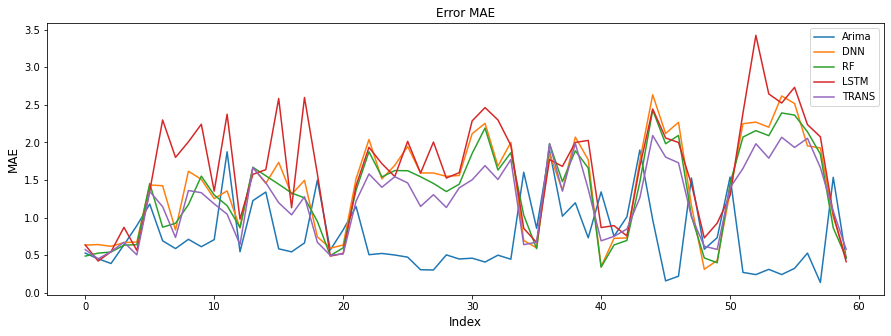

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

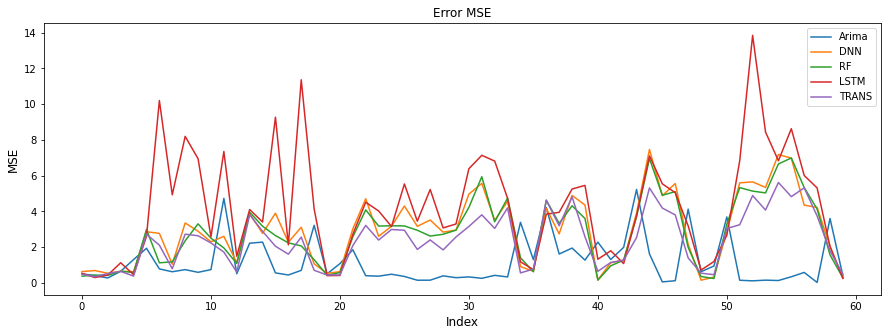

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

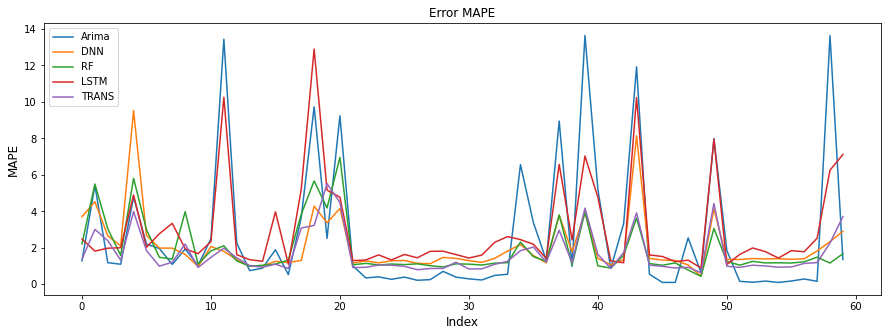

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

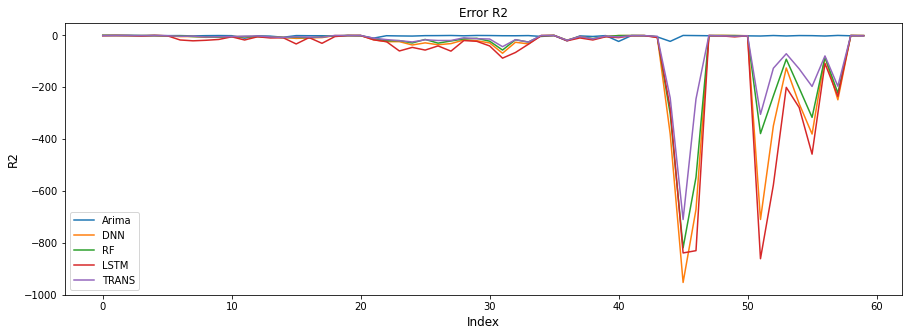

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 80

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
ultimoIndex=4072
saltoEntreIndexs=50

In [ ]:
testDFSlice=0.8987

In [ ]:
df = pandas.read_csv("./dataPreprocessed.csv")
dates_test = pandas.DataFrame(df['utc'].copy())
dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
df2=df.copy()
# non-normalized test dataset for rf model 
test_df2 = df2[int(lendf*testDFSlice):]
test_df2 = test_df2.reset_index(drop=True)

# normalized test dataset for other models
train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std
lendf = len(df)
test_df = df[int(lendf*testDFSlice):]
test_df = test_df.reset_index(drop=True)

dates_test = dates_test[int(lendf*testDFSlice):]
dates_test = dates_test.reset_index(drop=True)

In [ ]:
test_df2.tail()

,Ts_Valor,HR_Valor,QFE_Valor,hour,day,month
4139,22.80,40.63,1017.42,4,1,9
4140,22.68,40.41,1017.33,5,1,9
4141,22.53,40.21,1017.34,6,1,9
4142,22.49,40.01,1017.73,7,1,9
4143,23.89,37.10,1017.88,8,1,9


In [ ]:
with tf.device('/device:GPU:0'):
  for testIndex in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    print(testIndex)
    first = testIndex
    last=first+72
    nowTest = dates_test['utc'][testIndex-1]
    now = pandas.to_datetime(nowTest)
    now
    #
    rfPreds = []
    x = rfModel.predict(test_df2[first-1:first].values)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)
    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    #
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last]) ##buen indice 22->23
    #
    series = test_df[first-72:first]
    future = 72
    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    #
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    #
    df3 = test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first-24:first]
    df3['dsin']=timeEncode[['Day sin']][first-24:first]
    df3['ysin']=timeEncode[['Year sin']][first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

  0%|          | 0/80 [00:00<?, ?it/s]

72
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  1%|▏         | 1/80 [00:16<21:10, 16.08s/it]

122
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


  2%|▎         | 2/80 [00:31<20:31, 15.79s/it]

172
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  4%|▍         | 3/80 [00:48<21:03, 16.41s/it]

222
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  5%|▌         | 4/80 [01:03<20:10, 15.92s/it]

272
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  6%|▋         | 5/80 [01:20<20:11, 16.16s/it]

322
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  8%|▊         | 6/80 [01:35<19:37, 15.91s/it]

372
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  9%|▉         | 7/80 [01:51<19:22, 15.92s/it]

422
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 10%|█         | 8/80 [02:05<18:19, 15.27s/it]

472
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 9/80 [02:21<18:10, 15.36s/it]

522
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 12%|█▎        | 10/80 [02:36<17:50, 15.30s/it]

572
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 11/80 [02:52<17:51, 15.53s/it]

622
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 12/80 [03:08<17:39, 15.58s/it]

672
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 45ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 13/80 [03:24<17:41, 15.85s/it]

722
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 14/80 [03:41<17:37, 16.02s/it]

772
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 15/80 [03:58<17:56, 16.56s/it]

822
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 20%|██        | 16/80 [04:14<17:20, 16.26s/it]

872
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 17/80 [04:30<17:04, 16.27s/it]

922
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 22%|██▎       | 18/80 [04:47<16:54, 16.36s/it]

972
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 19/80 [05:02<16:17, 16.02s/it]

1022
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 20/80 [05:17<15:41, 15.68s/it]

1072
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 21/80 [05:34<15:53, 16.17s/it]

1122
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 22/80 [05:50<15:25, 15.95s/it]

1172
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 23/80 [06:07<15:37, 16.45s/it]

1222
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 30%|███       | 24/80 [06:23<15:12, 16.30s/it]

1272
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 25/80 [06:39<14:54, 16.26s/it]

1322
1/1 [==============================] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 32%|███▎      | 26/80 [06:55<14:18, 15.90s/it]

1372
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 27/80 [07:09<13:42, 15.51s/it]

1422
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 28/80 [07:25<13:31, 15.61s/it]

1472
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 29/80 [07:41<13:18, 15.65s/it]

1522
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 30/80 [07:58<13:24, 16.09s/it]

1572
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 31/80 [08:13<13:00, 15.93s/it]

1622
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 15ms/step


 40%|████      | 32/80 [08:29<12:36, 15.75s/it]

1672
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 33/80 [08:45<12:28, 15.92s/it]

1722
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 42%|████▎     | 34/80 [09:03<12:35, 16.43s/it]

1772
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 35/80 [09:19<12:11, 16.25s/it]

1822
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 36/80 [09:34<11:49, 16.12s/it]

1872
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 37/80 [09:51<11:41, 16.32s/it]

1922
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 38/80 [10:07<11:22, 16.24s/it]

1972
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 39/80 [10:23<11:04, 16.20s/it]

2022
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 50%|█████     | 40/80 [10:39<10:45, 16.14s/it]

2072
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 41/80 [10:55<10:24, 16.00s/it]

2122
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 52%|█████▎    | 42/80 [11:11<10:09, 16.04s/it]

2172
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 43/80 [11:26<09:45, 15.83s/it]

2222
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 44/80 [11:43<09:40, 16.12s/it]

2272
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 45/80 [12:00<09:26, 16.20s/it]

2322
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 57%|█████▊    | 46/80 [12:16<09:10, 16.19s/it]

2372
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 47/80 [12:32<08:51, 16.10s/it]

2422
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 60%|██████    | 48/80 [12:46<08:16, 15.52s/it]

2472
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 49/80 [13:02<08:03, 15.60s/it]

2522
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 62%|██████▎   | 50/80 [13:17<07:48, 15.61s/it]

2572
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 51/80 [13:33<07:36, 15.74s/it]

2622
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 52/80 [13:48<07:13, 15.49s/it]

2672
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 53/80 [14:04<07:01, 15.62s/it]

2722
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 54/80 [14:18<06:30, 15.02s/it]

2772
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 55/80 [14:34<06:24, 15.39s/it]

2822
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 70%|███████   | 56/80 [14:50<06:14, 15.62s/it]

2872
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 39ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 57/80 [15:05<05:57, 15.53s/it]

2922
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 72%|███████▎  | 58/80 [15:21<05:44, 15.68s/it]

2972
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 59/80 [15:38<05:32, 15.82s/it]

3022
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 60/80 [15:54<05:22, 16.12s/it]

3072
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 61/80 [16:11<05:10, 16.37s/it]

3122
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 62/80 [16:28<04:53, 16.32s/it]

3172
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 63/80 [16:45<04:41, 16.55s/it]

3222
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 80%|████████  | 64/80 [16:56<03:59, 14.95s/it]

3272
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 65/80 [17:14<03:56, 15.76s/it]

3322
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 82%|████████▎ | 66/80 [17:31<03:48, 16.30s/it]

3372
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 67/80 [17:46<03:27, 15.94s/it]

3422
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 68/80 [18:02<03:09, 15.79s/it]

3472
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 69/80 [18:20<03:02, 16.57s/it]

3522
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 70/80 [18:37<02:46, 16.69s/it]

3572
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 71/80 [18:54<02:30, 16.77s/it]

3622
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 72/80 [19:10<02:12, 16.54s/it]

3672
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 73/80 [19:27<01:57, 16.74s/it]

3722
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 92%|█████████▎| 74/80 [19:44<01:40, 16.81s/it]

3772
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 75/80 [20:01<01:23, 16.72s/it]

3822
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 76/80 [20:17<01:06, 16.69s/it]

3872
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 77/80 [20:34<00:50, 16.70s/it]

3922
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 78/80 [20:51<00:33, 16.75s/it]

3972
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 79/80 [21:07<00:16, 16.61s/it]

4022
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


100%|██████████| 80/80 [21:24<00:00, 16.06s/it]


In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,80.000,80.000,80.000,80.000,80.000
mean,1.376,1.405,1.682,1.253,0.752
std,0.593,0.642,0.697,0.461,0.424
min,0.337,0.357,0.483,0.464,0.197
25%,0.930,0.798,0.942,0.883,0.460
50%,1.461,1.456,1.727,1.215,0.635
75%,1.850,1.936,2.271,1.639,0.894
max,2.621,2.778,3.075,2.286,2.317


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,80.000,80.000,80.000,80.000,80.000
mean,1.139,2.915,2.918,4.531,2.455
std,1.286,1.931,1.875,3.008,1.484
min,0.091,0.236,0.203,0.400,0.338
25%,0.370,1.091,1.237,1.678,1.318
50%,0.629,2.888,2.940,4.154,2.254
75%,1.353,4.331,4.366,7.012,3.517
max,6.768,8.145,7.847,13.845,6.601


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,80.000,80.000,80.000,80.000,80.000
mean,2.758,2.174,1.862,3.604,1.701
std,4.041,1.675,1.277,3.700,1.332
min,0.096,0.680,0.448,0.800,0.774
25%,0.359,1.280,1.107,1.571,0.988
50%,1.347,1.406,1.307,1.992,1.211
75%,3.159,2.182,1.987,3.932,1.834
max,19.872,9.135,7.369,19.839,9.688


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,80.000,80.000,80.000,80.000,80.000
mean,-3.485,-76.115,-59.773,-102.809,-57.276
std,8.288,182.979,150.055,230.046,169.247
min,-60.861,-1070.113,-1027.375,-1207.857,-1309.308
25%,-2.472,-30.079,-22.960,-52.637,-19.247
50%,-1.094,-5.347,-6.781,-17.306,-4.133
75%,-0.551,-0.808,-0.996,-1.773,-1.741
max,0.290,0.255,0.339,-0.002,0.009


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

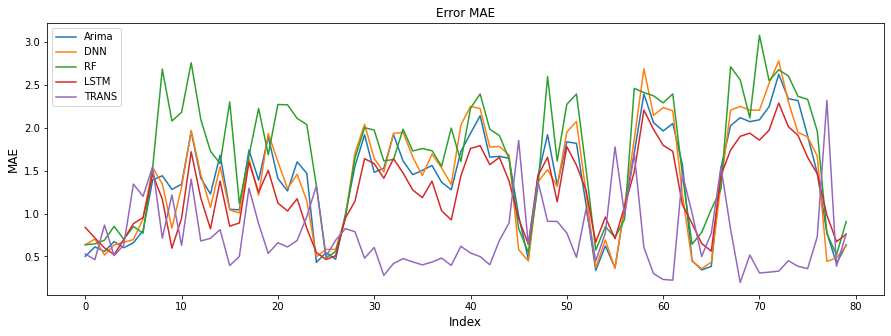

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

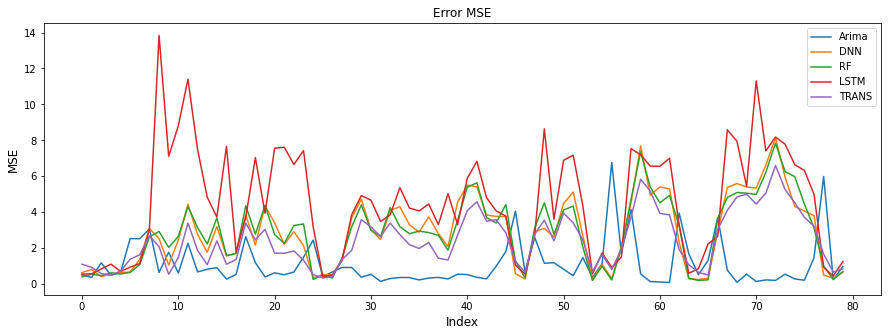

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

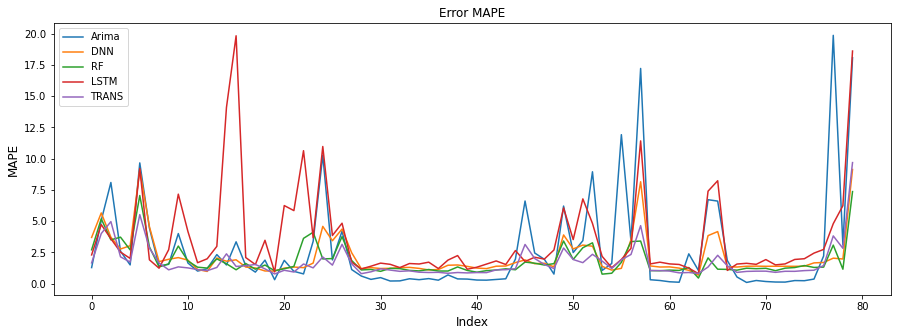

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

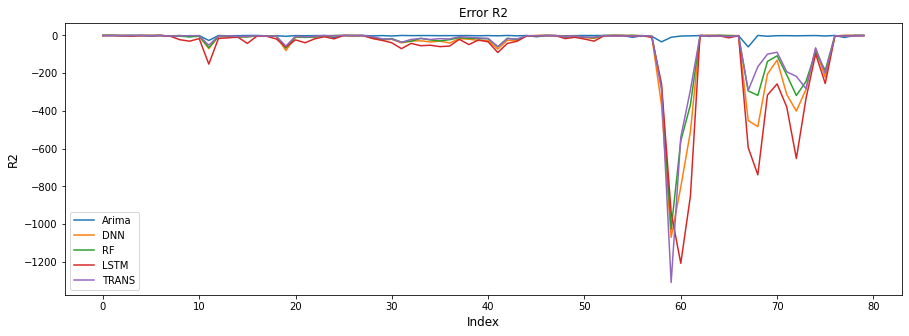

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 100

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
ultimoIndex=4072
saltoEntreIndexs=40

In [ ]:
df = pandas.read_csv("./dataPreprocessed.csv")
dates_test = pandas.DataFrame(df['utc'].copy())
dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
df2=df.copy()
# 
test_df2 = df2[int(lendf*testDFSlice):]
test_df2 = test_df2.reset_index(drop=True)

# 
train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std
lendf = len(df)
test_df = df[int(lendf*testDFSlice):]
test_df = test_df.reset_index(drop=True)

dates_test = dates_test[int(lendf*testDFSlice):]
dates_test = dates_test.reset_index(drop=True)
with tf.device('/device:GPU:0'):
  for testIndex in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    print(testIndex)
    first = testIndex
    last=first+72
    nowTest = dates_test['utc'][testIndex-1]
    now = pandas.to_datetime(nowTest)
    now
    #
    rfPreds = []
    x = rfModel.predict(test_df2[first-1:first].values)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)
    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    #
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last]) ##buen indice 22->23
    #
    series = test_df[first-72:first]
    future = 72
    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    #
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    #
    df3 = test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first-24:first]
    df3['dsin']=timeEncode[['Day sin']][first-24:first]
    df3['ysin']=timeEncode[['Year sin']][first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

  0%|          | 0/100 [00:00<?, ?it/s]

72
1/1 [==============================] - 0s 28ms/step


  1%|          | 1/100 [00:39<1:04:22, 39.02s/it]

112
1/1 [==============================] - 0s 24ms/step


  2%|▏         | 2/100 [01:07<53:18, 32.64s/it]  

152
1/1 [==============================] - 0s 26ms/step


  3%|▎         | 3/100 [01:33<48:17, 29.87s/it]

192
1/1 [==============================] - 0s 30ms/step


  4%|▍         | 4/100 [02:01<46:19, 28.96s/it]

232
1/1 [==============================] - 0s 32ms/step


  5%|▌         | 5/100 [02:29<45:23, 28.67s/it]

272
1/1 [==============================] - 0s 26ms/step


  6%|▌         | 6/100 [02:59<45:50, 29.26s/it]

312
1/1 [==============================] - 0s 17ms/step


  7%|▋         | 7/100 [03:25<43:31, 28.08s/it]

352
1/1 [==============================] - 0s 18ms/step


  8%|▊         | 8/100 [03:40<36:47, 24.00s/it]

392
1/1 [==============================] - 0s 17ms/step


  9%|▉         | 9/100 [03:57<32:48, 21.64s/it]

432
1/1 [==============================] - 0s 17ms/step


 10%|█         | 10/100 [04:12<29:34, 19.72s/it]

472
1/1 [==============================] - 0s 17ms/step


 11%|█         | 11/100 [04:28<27:23, 18.47s/it]

512
1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 12/100 [04:43<25:38, 17.49s/it]

552
1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 13/100 [04:58<24:26, 16.86s/it]

592
1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 14/100 [05:15<23:57, 16.71s/it]

632
1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 15/100 [05:30<23:13, 16.39s/it]

672
1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 16/100 [05:47<23:08, 16.53s/it]

712
1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 17/100 [06:03<22:30, 16.27s/it]

752
1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 18/100 [06:19<22:10, 16.22s/it]

792
1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 19/100 [06:35<21:51, 16.19s/it]

832
1/1 [==============================] - 0s 18ms/step


 20%|██        | 20/100 [06:51<21:20, 16.01s/it]

872
1/1 [==============================] - 0s 16ms/step


 21%|██        | 21/100 [07:06<20:55, 15.89s/it]

912
1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 22/100 [07:23<20:55, 16.09s/it]

952
1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 23/100 [07:39<20:26, 15.93s/it]

992
1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 24/100 [07:54<20:02, 15.83s/it]

1032
1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 25/100 [08:11<20:07, 16.10s/it]

1072
1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 26/100 [08:28<20:06, 16.30s/it]

1112
1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 27/100 [08:43<19:39, 16.16s/it]

1152
1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 28/100 [09:00<19:24, 16.17s/it]

1192
1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 29/100 [09:16<19:05, 16.13s/it]

1232
1/1 [==============================] - 0s 19ms/step


 30%|███       | 30/100 [09:32<18:45, 16.08s/it]

1272
1/1 [==============================] - 0s 16ms/step


 31%|███       | 31/100 [09:48<18:28, 16.06s/it]

1312
1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 32/100 [10:01<17:17, 15.26s/it]

1352
1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 33/100 [10:17<17:09, 15.37s/it]

1392
1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 34/100 [10:33<17:08, 15.59s/it]

1432
1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 35/100 [10:48<16:48, 15.51s/it]

1472
1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 36/100 [11:03<16:25, 15.39s/it]

1512
1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 37/100 [11:19<16:23, 15.62s/it]

1552
1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 38/100 [11:35<16:12, 15.69s/it]

1592
1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 39/100 [11:51<16:01, 15.76s/it]

1632
1/1 [==============================] - 0s 18ms/step


 40%|████      | 40/100 [12:06<15:37, 15.62s/it]

1672
1/1 [==============================] - 0s 17ms/step


 41%|████      | 41/100 [12:22<15:27, 15.72s/it]

1712
1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 42/100 [12:39<15:28, 16.01s/it]

1752
1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 43/100 [12:56<15:21, 16.17s/it]

1792
1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 44/100 [13:12<15:13, 16.31s/it]

1832
1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 45/100 [13:28<14:51, 16.22s/it]

1872
1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 46/100 [13:47<15:18, 17.01s/it]

1912
1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 47/100 [14:04<14:50, 16.81s/it]

1952
1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 48/100 [14:20<14:30, 16.74s/it]

1992
1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 49/100 [14:36<14:08, 16.64s/it]

2032
1/1 [==============================] - 0s 19ms/step


 50%|█████     | 50/100 [15:03<16:17, 19.55s/it]

2072
1/1 [==============================] - 0s 17ms/step


 51%|█████     | 51/100 [15:19<15:09, 18.57s/it]

2112
1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 52/100 [15:36<14:24, 18.02s/it]

2152
1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 53/100 [15:52<13:42, 17.50s/it]

2192
1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 54/100 [16:09<13:13, 17.24s/it]

2232
1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 55/100 [16:25<12:46, 17.04s/it]

2272
1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 56/100 [16:42<12:27, 16.99s/it]

2312
1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 57/100 [16:59<12:05, 16.88s/it]

2352
1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 58/100 [17:15<11:36, 16.59s/it]

2392
1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 59/100 [17:31<11:11, 16.38s/it]

2432
1/1 [==============================] - 0s 17ms/step


 60%|██████    | 60/100 [17:45<10:31, 15.79s/it]

2472
1/1 [==============================] - 0s 19ms/step


 61%|██████    | 61/100 [18:01<10:19, 15.90s/it]

2512
1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 62/100 [18:18<10:16, 16.24s/it]

2552
1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 63/100 [18:35<10:02, 16.29s/it]

2592
1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 64/100 [18:50<09:35, 15.97s/it]

2632
1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 65/100 [19:06<09:16, 15.90s/it]

2672
1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 66/100 [19:22<09:01, 15.94s/it]

2712
1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 67/100 [19:41<09:19, 16.96s/it]

2752
1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 68/100 [19:55<08:38, 16.20s/it]

2792
1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 69/100 [20:11<08:13, 15.92s/it]

2832
1/1 [==============================] - 0s 17ms/step


 70%|███████   | 70/100 [20:26<07:51, 15.71s/it]

2872
1/1 [==============================] - 0s 18ms/step


 71%|███████   | 71/100 [20:41<07:34, 15.66s/it]

2912
1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 72/100 [20:57<07:21, 15.75s/it]

2952
1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 73/100 [21:15<07:18, 16.24s/it]

2992
1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 74/100 [21:32<07:07, 16.43s/it]

3032
1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 75/100 [21:50<07:01, 16.87s/it]

3072
1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 76/100 [22:07<06:51, 17.13s/it]

3112
1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 77/100 [22:24<06:33, 17.10s/it]

3152
1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 78/100 [22:41<06:16, 17.10s/it]

3192
1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 79/100 [22:59<06:02, 17.25s/it]

3232
1/1 [==============================] - 0s 17ms/step


 80%|████████  | 80/100 [23:12<05:16, 15.84s/it]

3272
1/1 [==============================] - 0s 18ms/step


 81%|████████  | 81/100 [23:30<05:13, 16.52s/it]

3312
1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 82/100 [23:47<05:02, 16.79s/it]

3352
1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 83/100 [24:04<04:44, 16.73s/it]

3392
1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 84/100 [24:20<04:27, 16.73s/it]

3432
1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 85/100 [24:33<03:51, 15.45s/it]

3472
1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 86/100 [24:52<03:50, 16.46s/it]

3512
1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 87/100 [25:10<03:42, 17.13s/it]

3552
1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 88/100 [25:29<03:31, 17.63s/it]

3592
1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 89/100 [25:46<03:11, 17.39s/it]

3632
1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 90/100 [26:03<02:52, 17.21s/it]

3672
1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 91/100 [26:20<02:34, 17.19s/it]

3712
1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 92/100 [26:37<02:18, 17.27s/it]

3752
1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 93/100 [26:54<02:00, 17.16s/it]

3792
1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 94/100 [27:11<01:42, 17.04s/it]

3832
1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 95/100 [27:28<01:25, 17.08s/it]

3872
1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 96/100 [27:46<01:09, 17.33s/it]

3912
1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 97/100 [28:03<00:51, 17.25s/it]

3952
1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 98/100 [28:18<00:33, 16.50s/it]

3992
1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 99/100 [28:36<00:16, 16.85s/it]

4032
1/1 [==============================] - 0s 18ms/step


100%|██████████| 100/100 [28:53<00:00, 17.33s/it]


In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,100.000,100.000,100.000,100.000,100.000
mean,1.364,1.421,1.680,1.252,0.772
std,0.590,0.631,0.706,0.480,0.475
min,0.343,0.348,0.356,0.474,0.197
25%,0.872,0.806,1.018,0.896,0.458
50%,1.470,1.507,1.795,1.247,0.628
75%,1.861,1.923,2.163,1.629,0.980
max,2.621,2.778,3.369,2.286,2.278


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,100.000,100.000,100.000,100.000,100.000
mean,1.233,2.966,2.893,4.531,2.460
std,1.456,1.911,1.855,3.043,1.570
min,0.085,0.178,0.203,0.179,0.348
25%,0.349,1.318,1.353,1.751,1.243
50%,0.636,3.034,2.921,4.361,2.200
75%,1.556,4.299,4.434,6.584,3.378
max,7.571,8.145,7.847,13.845,6.728


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,100.000,100.000,100.000,100.000,100.000
mean,2.633,2.158,1.821,3.442,1.715
std,3.370,1.635,1.250,3.499,1.339
min,0.092,0.544,0.493,0.866,0.739
25%,0.364,1.283,1.122,1.616,0.983
50%,1.284,1.407,1.258,2.011,1.160
75%,3.428,2.327,1.998,3.790,1.991
max,15.464,9.299,7.170,21.753,9.700


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,100.000,100.000,100.000,100.000,100.000
mean,-6.887,-71.398,-52.844,-103.448,-52.791
std,45.679,174.453,134.547,249.771,148.003
min,-456.989,-978.698,-930.399,-1291.499,-1109.508
25%,-2.481,-32.422,-22.618,-54.908,-19.436
50%,-1.042,-5.784,-6.172,-15.841,-4.371
75%,-0.494,-0.872,-0.791,-1.454,-1.634
max,0.207,0.203,0.339,0.029,0.238


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

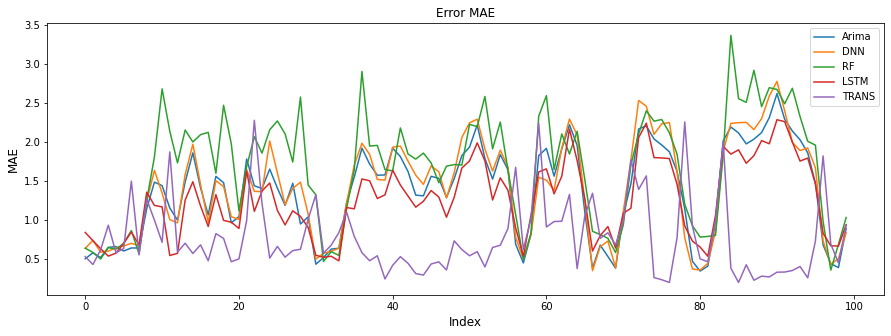

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

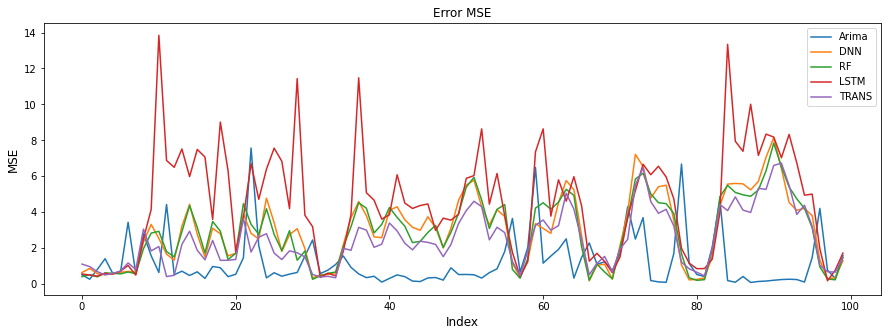

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

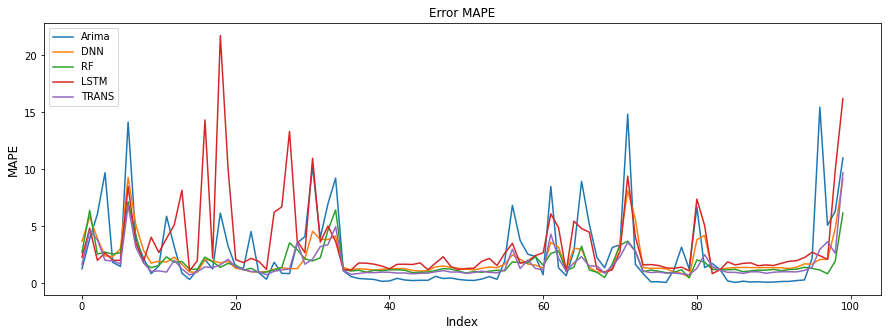

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

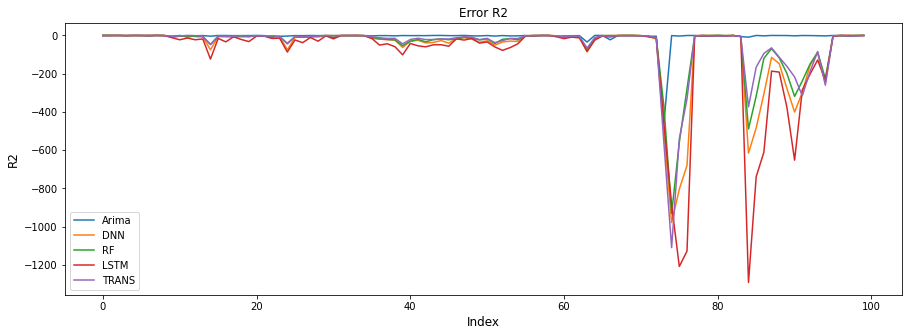

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 120

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
ultimoIndex=4000 
saltoEntreIndexs=33

In [ ]:
df = pandas.read_csv("./dataPreprocessed.csv")
dates_test = pandas.DataFrame(df['utc'].copy())
dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
df2=df.copy()
# 
test_df2 = df2[int(lendf*testDFSlice):]
test_df2 = test_df2.reset_index(drop=True)

# 
train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std
lendf = len(df)
test_df = df[int(lendf*testDFSlice):]
test_df = test_df.reset_index(drop=True)

dates_test = dates_test[int(lendf*testDFSlice):]
dates_test = dates_test.reset_index(drop=True)
with tf.device('/device:GPU:0'):
  for testIndex in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    print(testIndex)
    first = testIndex
    last=first+72
    nowTest = dates_test['utc'][testIndex-1]
    now = pandas.to_datetime(nowTest)
    now
    #
    rfPreds = []
    x = rfModel.predict(test_df2[first-1:first].values)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)
    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    #
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last]) ##
    #
    series = test_df[first-72:first]
    future = 72
    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    #
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    #
    df3 = test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first-24:first]
    df3['dsin']=timeEncode[['Day sin']][first-24:first]
    df3['ysin']=timeEncode[['Year sin']][first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

  0%|          | 0/120 [00:00<?, ?it/s]

72
1/1 [==============================] - 0s 20ms/step


  1%|          | 1/120 [00:16<33:28, 16.88s/it]

105
1/1 [==============================] - 0s 18ms/step


  2%|▏         | 2/120 [00:32<32:06, 16.33s/it]

138
1/1 [==============================] - 0s 18ms/step


  2%|▎         | 3/120 [00:49<32:14, 16.54s/it]

171
1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/120 [01:07<32:44, 16.93s/it]

204
1/1 [==============================] - 0s 20ms/step


  4%|▍         | 5/120 [01:23<31:52, 16.63s/it]

237
1/1 [==============================] - 0s 19ms/step


  5%|▌         | 6/120 [01:39<31:10, 16.41s/it]

270
1/1 [==============================] - 0s 18ms/step


  6%|▌         | 7/120 [01:58<32:46, 17.41s/it]

303
1/1 [==============================] - 0s 18ms/step


  7%|▋         | 8/120 [02:14<31:35, 16.93s/it]

336
1/1 [==============================] - 0s 18ms/step


  8%|▊         | 9/120 [02:31<31:18, 16.93s/it]

369
1/1 [==============================] - 0s 27ms/step


  8%|▊         | 10/120 [02:48<30:51, 16.83s/it]

402
1/1 [==============================] - 0s 18ms/step


  9%|▉         | 11/120 [03:04<30:11, 16.62s/it]

435
1/1 [==============================] - 0s 20ms/step


 10%|█         | 12/120 [03:20<29:35, 16.44s/it]

468
1/1 [==============================] - 0s 18ms/step


 11%|█         | 13/120 [03:35<28:38, 16.06s/it]

501
1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 14/120 [03:49<27:28, 15.56s/it]

534
1/1 [==============================] - 0s 21ms/step


 12%|█▎        | 15/120 [04:04<26:58, 15.42s/it]

567
1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 16/120 [04:20<26:41, 15.40s/it]

600
1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 17/120 [04:36<26:55, 15.68s/it]

633
1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 18/120 [04:53<27:00, 15.89s/it]

666
1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 19/120 [05:09<26:59, 16.04s/it]

699
1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 20/120 [05:25<26:47, 16.08s/it]

732
1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 21/120 [05:43<27:34, 16.71s/it]

765
1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 22/120 [06:00<27:10, 16.64s/it]

798
1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 23/120 [06:17<27:12, 16.83s/it]

831
1/1 [==============================] - 0s 24ms/step


 20%|██        | 24/120 [06:34<26:48, 16.75s/it]

864
1/1 [==============================] - 0s 22ms/step


 21%|██        | 25/120 [06:50<26:34, 16.79s/it]

897
1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 26/120 [07:07<26:06, 16.66s/it]

930
1/1 [==============================] - 0s 17ms/step


 22%|██▎       | 27/120 [07:25<26:42, 17.23s/it]

963
1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 28/120 [07:45<27:43, 18.08s/it]

996
1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 29/120 [08:02<26:40, 17.59s/it]

1029
1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 30/120 [08:17<25:29, 16.99s/it]

1062
1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 31/120 [08:34<24:58, 16.84s/it]

1095
1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 32/120 [08:51<24:48, 16.91s/it]

1128
1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 33/120 [09:07<24:15, 16.73s/it]

1161
1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 34/120 [09:25<24:11, 16.87s/it]

1194
1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 35/120 [09:41<23:53, 16.87s/it]

1227
1/1 [==============================] - 0s 17ms/step


 30%|███       | 36/120 [09:58<23:28, 16.77s/it]

1260
1/1 [==============================] - 0s 17ms/step


 31%|███       | 37/120 [10:15<23:11, 16.76s/it]

1293
1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 38/120 [10:30<22:24, 16.39s/it]

1326
1/1 [==============================] - 0s 19ms/step


 32%|███▎      | 39/120 [10:46<21:53, 16.21s/it]

1359
1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 40/120 [11:03<22:04, 16.55s/it]

1392
1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 41/120 [11:20<21:55, 16.66s/it]

1425
1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 42/120 [11:36<21:28, 16.52s/it]

1458
1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 43/120 [11:53<21:11, 16.51s/it]

1491
1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 44/120 [12:08<20:14, 15.99s/it]

1524
1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 45/120 [12:25<20:21, 16.28s/it]

1557
1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 46/120 [12:42<20:34, 16.68s/it]

1590
1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 47/120 [13:01<20:53, 17.17s/it]

1623
1/1 [==============================] - 0s 19ms/step


 40%|████      | 48/120 [13:17<20:10, 16.81s/it]

1656
1/1 [==============================] - 0s 18ms/step


 41%|████      | 49/120 [13:34<20:01, 16.92s/it]

1689
1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 50/120 [13:51<19:43, 16.90s/it]

1722
1/1 [==============================] - 0s 17ms/step


 42%|████▎     | 51/120 [14:07<19:21, 16.83s/it]

1755
1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 52/120 [14:23<18:41, 16.49s/it]

1788
1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 53/120 [14:40<18:26, 16.51s/it]

1821
1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 54/120 [14:56<18:08, 16.49s/it]

1854
1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 55/120 [15:13<18:03, 16.67s/it]

1887
1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 56/120 [15:30<17:56, 16.82s/it]

1920
1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 57/120 [15:47<17:35, 16.76s/it]

1953
1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 58/120 [16:04<17:26, 16.88s/it]

1986
1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 59/120 [16:21<17:04, 16.80s/it]

2019
1/1 [==============================] - 0s 21ms/step


 50%|█████     | 60/120 [16:37<16:46, 16.78s/it]

2052
1/1 [==============================] - 0s 17ms/step


 51%|█████     | 61/120 [16:55<16:37, 16.91s/it]

2085
1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 62/120 [17:11<16:16, 16.84s/it]

2118
1/1 [==============================] - 0s 19ms/step


 52%|█████▎    | 63/120 [17:28<15:53, 16.73s/it]

2151
1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 64/120 [17:45<15:39, 16.77s/it]

2184
1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 65/120 [18:00<15:02, 16.40s/it]

2217
1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 66/120 [18:18<15:06, 16.78s/it]

2250
1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 67/120 [18:36<15:03, 17.06s/it]

2283
1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 68/120 [18:53<14:58, 17.28s/it]

2316
1/1 [==============================] - 0s 20ms/step


 57%|█████▊    | 69/120 [19:10<14:32, 17.10s/it]

2349
1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 70/120 [19:27<14:07, 16.95s/it]

2382
1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 71/120 [19:43<13:49, 16.93s/it]

2415
1/1 [==============================] - 0s 18ms/step


 60%|██████    | 72/120 [19:59<13:19, 16.65s/it]

2448
1/1 [==============================] - 0s 17ms/step


 61%|██████    | 73/120 [20:16<13:01, 16.62s/it]

2481
1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 74/120 [20:32<12:31, 16.35s/it]

2514
1/1 [==============================] - 0s 18ms/step


 62%|██████▎   | 75/120 [20:48<12:15, 16.35s/it]

2547
1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 76/120 [21:04<11:56, 16.28s/it]

2580
1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 77/120 [21:20<11:39, 16.27s/it]

2613
1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 78/120 [21:33<10:33, 15.08s/it]

2646
1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 79/120 [21:50<10:39, 15.59s/it]

2679
1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 80/120 [22:05<10:25, 15.63s/it]

2712
1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 81/120 [22:22<10:20, 15.92s/it]

2745
1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 82/120 [22:35<09:32, 15.08s/it]

2778
1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 83/120 [22:51<09:27, 15.33s/it]

2811
1/1 [==============================] - 0s 17ms/step


 70%|███████   | 84/120 [23:07<09:18, 15.51s/it]

2844
1/1 [==============================] - 0s 17ms/step


 71%|███████   | 85/120 [23:22<09:04, 15.56s/it]

2877
1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 86/120 [23:38<08:52, 15.65s/it]

2910
1/1 [==============================] - 0s 17ms/step


 72%|███████▎  | 87/120 [23:54<08:40, 15.77s/it]

2943
1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 88/120 [24:10<08:27, 15.85s/it]

2976
1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 89/120 [24:27<08:21, 16.18s/it]

3009
1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 90/120 [24:44<08:07, 16.24s/it]

3042
1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 91/120 [25:01<08:01, 16.60s/it]

3075
1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 92/120 [25:17<07:42, 16.51s/it]

3108
1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 93/120 [25:35<07:31, 16.72s/it]

3141
1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 94/120 [25:51<07:13, 16.67s/it]

3174
1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 95/120 [26:08<06:54, 16.56s/it]

3207
1/1 [==============================] - 0s 20ms/step


 80%|████████  | 96/120 [26:21<06:16, 15.70s/it]

3240
1/1 [==============================] - 0s 19ms/step


 81%|████████  | 97/120 [26:36<05:52, 15.34s/it]

3273
1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 98/120 [26:53<05:49, 15.89s/it]

3306
1/1 [==============================] - 0s 17ms/step


 82%|████████▎ | 99/120 [27:09<05:37, 16.09s/it]

3339
1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 100/120 [27:26<05:22, 16.11s/it]

3372
1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 101/120 [27:41<05:00, 15.80s/it]

3405
1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 102/120 [27:57<04:46, 15.91s/it]

3438
1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 103/120 [28:09<04:12, 14.84s/it]

3471
1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 104/120 [28:26<04:08, 15.55s/it]

3504
1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 105/120 [28:44<04:02, 16.18s/it]

3537
1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 106/120 [29:00<03:46, 16.19s/it]

3570
1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 107/120 [29:17<03:31, 16.26s/it]

3603
1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 108/120 [29:33<03:16, 16.35s/it]

3636
1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 109/120 [29:50<03:00, 16.41s/it]

3669
1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 110/120 [30:06<02:44, 16.42s/it]

3702
1/1 [==============================] - 0s 16ms/step


 92%|█████████▎| 111/120 [30:24<02:32, 16.92s/it]

3735
1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 112/120 [30:41<02:15, 16.98s/it]

3768
1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 113/120 [30:58<01:58, 16.88s/it]

3801
1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 114/120 [31:14<01:39, 16.66s/it]

3834
1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 115/120 [31:31<01:23, 16.74s/it]

3867
1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 116/120 [31:55<01:15, 18.88s/it]

3900
1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 117/120 [32:12<00:55, 18.41s/it]

3933
1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 118/120 [32:28<00:35, 17.70s/it]

3966
1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 119/120 [32:43<00:16, 16.68s/it]

3999
1/1 [==============================] - 0s 17ms/step


100%|██████████| 120/120 [33:00<00:00, 16.50s/it]


In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,120.000,120.000,120.000,120.000,120.000
mean,1.367,1.427,1.625,1.250,0.732
std,0.580,0.630,0.703,0.472,0.406
min,0.379,0.314,0.375,0.440,0.139
25%,0.866,0.820,0.957,0.875,0.451
50%,1.488,1.485,1.699,1.229,0.603
75%,1.791,1.948,2.105,1.618,0.962
max,2.500,2.768,3.492,2.326,1.898


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,120.000,120.000,120.000,120.000,120.000
mean,1.086,2.979,2.928,4.214,2.469
std,1.088,1.902,1.877,2.882,1.575
min,0.032,0.158,0.216,0.213,0.305
25%,0.347,1.136,1.249,1.471,1.267
50%,0.681,2.888,2.923,3.993,2.201
75%,1.407,4.361,4.217,6.242,3.581
max,5.234,8.104,7.770,14.620,7.105


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,120.000,120.000,120.000,120.000,120.000
mean,2.566,2.127,1.948,2.965,1.646
std,3.268,1.586,1.718,2.401,1.091
min,0.098,0.441,0.470,0.782,0.747
25%,0.379,1.284,1.072,1.585,0.981
50%,1.234,1.414,1.221,2.068,1.138
75%,3.297,2.158,2.333,3.702,1.926
max,13.649,9.520,15.412,15.876,6.188


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,120.000,120.000,120.000,120.000,120.000
mean,-2.862,-72.209,-52.784,-91.078,-54.033
std,7.843,171.619,128.915,208.128,142.937
min,-76.237,-953.375,-792.745,-1211.739,-1039.978
25%,-2.196,-29.599,-23.303,-55.328,-18.355
50%,-1.089,-6.718,-6.970,-13.201,-4.504
75%,-0.477,-0.822,-0.925,-1.678,-1.699
max,0.485,0.359,0.311,-0.018,0.238


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

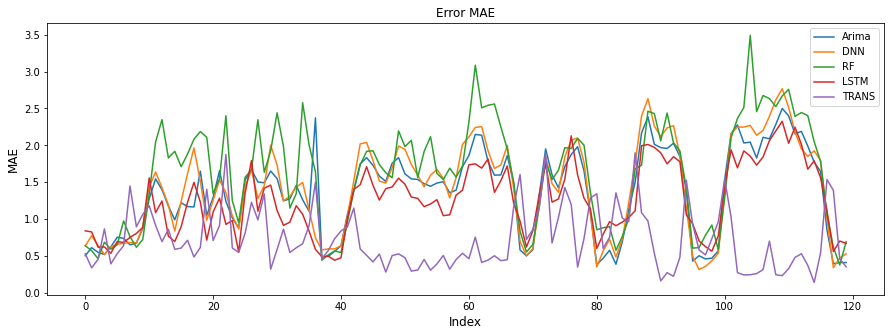

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

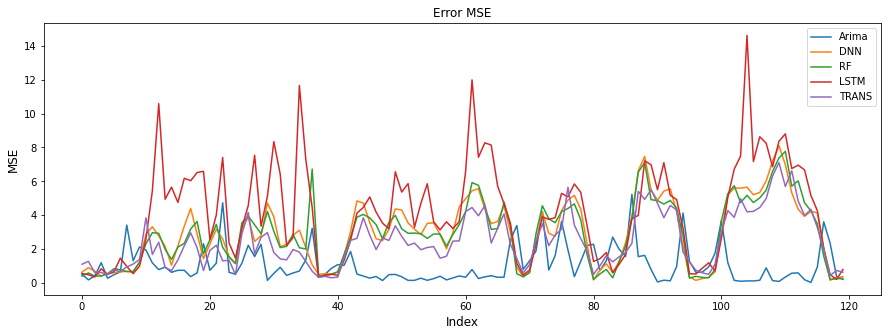

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

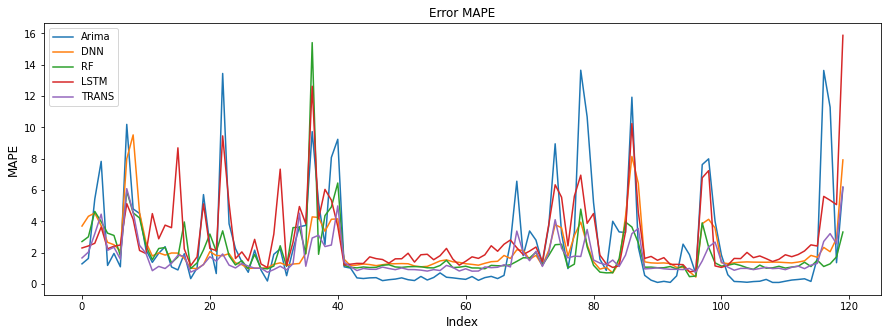

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

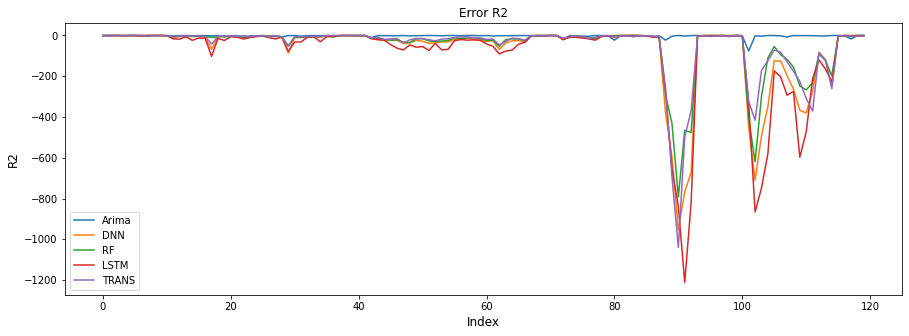

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 140

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
ultimoIndex=3992
saltoEntreIndexs=28

In [ ]:
df = pandas.read_csv("./dataPreprocessed.csv")
dates_test = pandas.DataFrame(df['utc'].copy())
dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
df2=df.copy()
# 
test_df2 = df2[int(lendf*testDFSlice):]
test_df2 = test_df2.reset_index(drop=True)


train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std
lendf = len(df)
test_df = df[int(lendf*testDFSlice):]
test_df = test_df.reset_index(drop=True)

dates_test = dates_test[int(lendf*testDFSlice):]
dates_test = dates_test.reset_index(drop=True)
with tf.device('/device:GPU:0'):
  for testIndex in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    print(testIndex)
    first = testIndex
    last=first+72
    nowTest = dates_test['utc'][testIndex-1]
    now = pandas.to_datetime(nowTest)
    now
    #
    rfPreds = []
    x = rfModel.predict(test_df2[first-1:first].values)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)
    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    #
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last]) ##
    #
    series = test_df[first-72:first]
    future = 72
    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    #
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    #
    df3 = test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first-24:first]
    df3['dsin']=timeEncode[['Day sin']][first-24:first]
    df3['ysin']=timeEncode[['Year sin']][first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

  0%|          | 0/140 [00:00<?, ?it/s]

72
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


  1%|          | 1/140 [00:31<1:14:04, 31.97s/it]

100
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/140 [00:48<53:00, 23.04s/it]  

128
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


  2%|▏         | 3/140 [01:16<57:16, 25.08s/it]

156
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/140 [01:34<50:22, 22.22s/it]

184
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  4%|▎         | 5/140 [01:51<45:46, 20.35s/it]

212
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/140 [02:07<42:06, 18.86s/it]

240
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  5%|▌         | 7/140 [02:22<39:28, 17.80s/it]

268
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


  6%|▌         | 8/140 [02:40<38:55, 17.70s/it]

296
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  6%|▋         | 9/140 [02:56<37:24, 17.14s/it]

324
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


  7%|▋         | 10/140 [03:12<36:26, 16.82s/it]

352
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  8%|▊         | 11/140 [03:29<36:33, 17.00s/it]

380
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


  9%|▊         | 12/140 [03:46<36:22, 17.05s/it]

408
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  9%|▉         | 13/140 [04:02<35:05, 16.58s/it]

436
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 10%|█         | 14/140 [04:18<34:17, 16.33s/it]

464
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 11%|█         | 15/140 [04:34<34:10, 16.41s/it]

492
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 16/140 [04:51<33:59, 16.45s/it]

520
1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 17/140 [05:05<32:22, 15.79s/it]

548
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 18/140 [05:22<33:04, 16.27s/it]

576
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 19/140 [05:40<33:22, 16.55s/it]

604
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 20/140 [05:56<32:59, 16.49s/it]

632
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 21/140 [06:12<32:26, 16.36s/it]

660
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 22/140 [06:28<32:02, 16.29s/it]

688
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 23/140 [06:45<31:55, 16.37s/it]

716
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 24/140 [07:02<32:18, 16.71s/it]

744
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 25/140 [07:19<32:07, 16.76s/it]

772
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 26/140 [07:36<31:43, 16.70s/it]

800
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 27/140 [07:52<31:02, 16.48s/it]

828
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 20%|██        | 28/140 [08:09<31:20, 16.79s/it]

856
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 21%|██        | 29/140 [08:26<31:14, 16.89s/it]

884
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 30/140 [08:41<30:06, 16.42s/it]

912
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 31/140 [08:59<30:15, 16.65s/it]

940
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 32/140 [09:16<30:04, 16.71s/it]

968
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 33/140 [09:31<29:08, 16.34s/it]

996
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 34/140 [09:47<28:36, 16.19s/it]

1024
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 35/140 [10:03<28:11, 16.11s/it]

1052
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 36/140 [10:20<28:32, 16.47s/it]

1080
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 37/140 [10:37<28:30, 16.61s/it]

1108
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 38/140 [10:54<28:14, 16.62s/it]

1136
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 39/140 [11:10<27:48, 16.52s/it]

1164
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 40/140 [11:28<28:22, 17.02s/it]

1192
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 41/140 [11:45<27:48, 16.85s/it]

1220
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 30%|███       | 42/140 [12:01<27:19, 16.72s/it]

1248
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 31%|███       | 43/140 [12:17<26:46, 16.56s/it]

1276
1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 44/140 [12:32<25:47, 16.12s/it]

1304
1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 45/140 [12:47<24:43, 15.62s/it]

1332
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 46/140 [13:04<25:20, 16.17s/it]

1360
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 47/140 [13:21<25:23, 16.38s/it]

1388
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 48/140 [13:38<25:11, 16.43s/it]

1416
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 49/140 [13:54<24:52, 16.40s/it]

1444
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 50/140 [14:11<24:47, 16.53s/it]

1472
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 51/140 [14:26<24:08, 16.27s/it]

1500
1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 52/140 [14:41<23:02, 15.71s/it]

1528
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 53/140 [15:00<24:19, 16.78s/it]

1556
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 54/140 [15:17<24:12, 16.89s/it]

1584
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 55/140 [15:34<23:44, 16.76s/it]

1612
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 40%|████      | 56/140 [15:51<23:30, 16.79s/it]

1640
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 41%|████      | 57/140 [16:08<23:40, 17.12s/it]

1668
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 58/140 [16:25<22:59, 16.83s/it]

1696
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 59/140 [16:42<22:55, 16.98s/it]

1724
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 60/140 [16:59<22:32, 16.91s/it]

1752
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 61/140 [17:17<22:47, 17.31s/it]

1780
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 62/140 [17:33<22:08, 17.03s/it]

1808
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 63/140 [17:51<22:07, 17.25s/it]

1836
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 64/140 [18:08<21:32, 17.01s/it]

1864
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 65/140 [18:26<21:44, 17.40s/it]

1892
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 66/140 [18:42<21:07, 17.13s/it]

1920
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 67/140 [18:58<20:24, 16.77s/it]

1948
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 68/140 [19:15<20:01, 16.68s/it]

1976
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 69/140 [19:32<19:56, 16.86s/it]

2004
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 50%|█████     | 70/140 [19:48<19:16, 16.52s/it]

2032
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 51%|█████     | 71/140 [20:04<19:02, 16.56s/it]

2060
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 72/140 [20:21<18:46, 16.56s/it]

2088
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 73/140 [20:39<18:58, 17.00s/it]

2116
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 74/140 [20:55<18:28, 16.80s/it]

2144
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 75/140 [21:11<17:57, 16.58s/it]

2172
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 76/140 [21:28<17:33, 16.47s/it]

2200
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 77/140 [21:46<17:59, 17.14s/it]

2228
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 78/140 [22:02<17:13, 16.68s/it]

2256
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 79/140 [22:18<16:54, 16.64s/it]

2284
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 80/140 [22:36<16:53, 16.89s/it]

2312
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 81/140 [22:54<16:48, 17.10s/it]

2340
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 82/140 [23:10<16:20, 16.91s/it]

2368
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 83/140 [23:26<15:47, 16.62s/it]

2396
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 60%|██████    | 84/140 [23:42<15:26, 16.55s/it]

2424
1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 61%|██████    | 85/140 [23:58<14:48, 16.16s/it]

2452
1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 86/140 [24:13<14:22, 15.97s/it]

2480
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 87/140 [24:28<13:52, 15.71s/it]

2508
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 88/140 [24:45<13:52, 16.00s/it]

2536
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 89/140 [25:02<13:55, 16.38s/it]

2564
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 90/140 [25:17<13:13, 15.87s/it]

2592
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 91/140 [25:32<12:53, 15.78s/it]

2620
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 92/140 [25:48<12:40, 15.84s/it]

2648
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 93/140 [26:06<12:50, 16.40s/it]

2676
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 94/140 [26:23<12:40, 16.52s/it]

2704
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 95/140 [26:40<12:26, 16.59s/it]

2732
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 96/140 [26:54<11:43, 15.99s/it]

2760
1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 97/140 [27:10<11:24, 15.93s/it]

2788
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 70%|███████   | 98/140 [27:28<11:31, 16.46s/it]

2816
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 71%|███████   | 99/140 [27:44<11:12, 16.41s/it]

2844
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 100/140 [28:00<10:46, 16.17s/it]

2872
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 101/140 [28:15<10:22, 15.97s/it]

2900
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 102/140 [28:32<10:21, 16.34s/it]

2928
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 103/140 [28:49<10:06, 16.39s/it]

2956
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 104/140 [29:06<09:57, 16.59s/it]

2984
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 105/140 [29:22<09:39, 16.57s/it]

3012
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 106/140 [29:40<09:34, 16.90s/it]

3040
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 107/140 [29:58<09:32, 17.36s/it]

3068
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 108/140 [30:15<09:08, 17.15s/it]

3096
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 109/140 [30:32<08:49, 17.09s/it]

3124
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 110/140 [30:50<08:44, 17.47s/it]

3152
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 111/140 [31:07<08:21, 17.31s/it]

3180
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 80%|████████  | 112/140 [31:24<07:59, 17.11s/it]

3208
1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 81%|████████  | 113/140 [31:38<07:13, 16.04s/it]

3236
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 114/140 [31:52<06:47, 15.66s/it]

3264
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 115/140 [32:10<06:42, 16.11s/it]

3292
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 116/140 [32:26<06:31, 16.32s/it]

3320
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 117/140 [32:44<06:21, 16.59s/it]

3348
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 118/140 [33:01<06:12, 16.91s/it]

3376
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 119/140 [33:18<05:56, 16.99s/it]

3404
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 120/140 [33:35<05:35, 16.79s/it]

3432
1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 121/140 [33:48<04:56, 15.60s/it]

3460
1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 122/140 [34:05<04:50, 16.16s/it]

3488
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 40ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 123/140 [34:23<04:43, 16.67s/it]

3516
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 124/140 [34:40<04:29, 16.84s/it]

3544
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 44ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 125/140 [34:57<04:13, 16.87s/it]

3572
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 126/140 [35:15<04:02, 17.30s/it]

3600
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 127/140 [35:32<03:41, 17.07s/it]

3628
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 128/140 [35:49<03:24, 17.05s/it]

3656
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 129/140 [36:06<03:06, 16.96s/it]

3684
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 130/140 [36:23<02:50, 17.07s/it]

3712
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 131/140 [36:40<02:33, 17.11s/it]

3740
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 132/140 [36:57<02:15, 16.98s/it]

3768
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 133/140 [37:14<01:58, 16.98s/it]

3796
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 134/140 [37:31<01:43, 17.19s/it]

3824
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 135/140 [37:49<01:27, 17.43s/it]

3852
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 136/140 [38:06<01:09, 17.30s/it]

3880
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 137/140 [38:23<00:51, 17.16s/it]

3908
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 138/140 [38:41<00:34, 17.47s/it]

3936
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 139/140 [38:58<00:17, 17.08s/it]

3964
1/1 [==============================] - 0s 18ms/step


100%|██████████| 140/140 [39:10<00:00, 16.79s/it]


In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,140.000,140.000,140.000,140.000,140.000
mean,1.383,1.437,1.666,1.208,0.764
std,0.569,0.626,0.663,0.435,0.423
min,0.282,0.297,0.398,0.459,0.171
25%,0.901,0.910,1.107,0.841,0.483
50%,1.507,1.494,1.841,1.197,0.632
75%,1.795,1.958,2.114,1.550,0.985
max,2.506,2.727,3.579,2.243,2.249


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,140.000,140.000,140.000,140.000,140.000
mean,1.151,3.028,2.936,4.762,2.213
std,1.193,1.892,1.848,3.108,1.313
min,0.049,0.166,0.136,0.272,0.342
25%,0.404,1.332,1.310,1.932,1.196
50%,0.670,3.026,2.990,5.222,2.000
75%,1.578,4.373,4.246,6.518,3.068
max,6.850,7.927,8.100,17.096,5.839


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,140.000,140.000,140.000,140.000,140.000
mean,2.458,2.125,1.805,3.246,1.557
std,3.164,1.578,1.279,3.799,1.047
min,0.090,0.440,0.469,0.709,0.703
25%,0.365,1.271,1.073,1.425,0.943
50%,1.291,1.424,1.193,1.927,1.131
75%,3.341,2.107,2.202,3.122,1.712
max,17.594,8.861,8.889,26.679,6.881


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,140.000,140.000,140.000,140.000,140.000
mean,-4.268,-79.101,-55.803,-94.738,-47.751
std,14.086,183.704,128.051,201.220,119.542
min,-127.806,-986.589,-782.818,-1282.875,-824.911
25%,-2.776,-35.095,-25.011,-69.191,-16.733
50%,-1.283,-6.730,-6.793,-14.777,-4.255
75%,-0.571,-1.027,-0.994,-2.437,-1.475
max,0.396,0.338,0.321,0.357,0.227


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

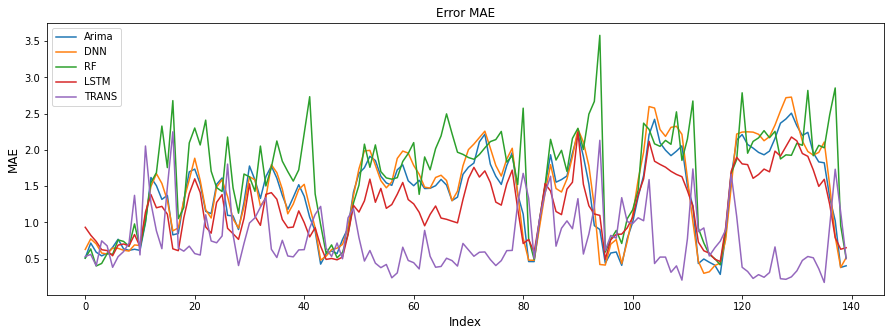

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

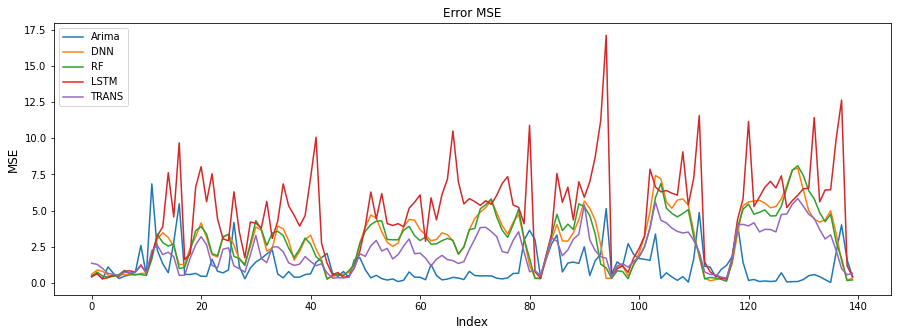

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

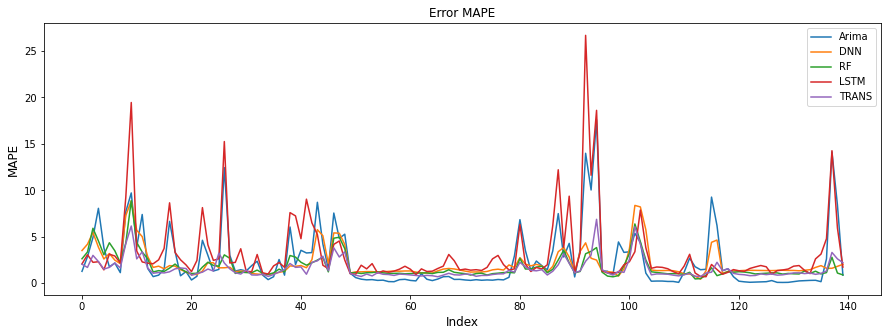

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

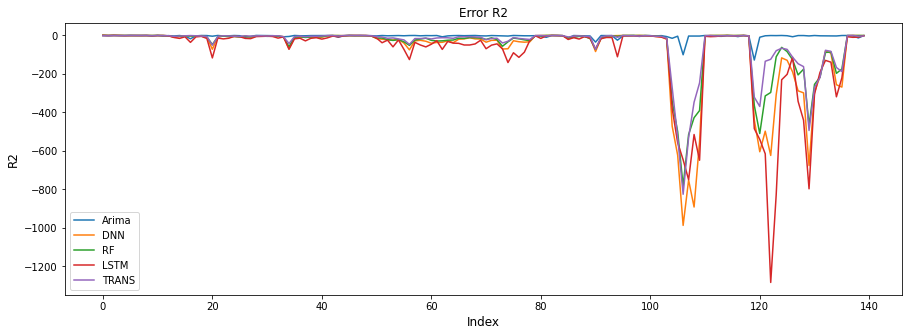

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 160

In [ ]:
mae = []
mse = []
mape = []
r2 = [] 
testIndex=72
saltoEntreIndexs=25
ultimoIndex=testIndex + saltoEntreIndexs*160

In [ ]:
df = pandas.read_csv("./dataPreprocessed.csv")
dates_test = pandas.DataFrame(df['utc'].copy())
dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
df2=df.copy()
# 
test_df2 = df2[int(lendf*testDFSlice):]
test_df2 = test_df2.reset_index(drop=True)


train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std
lendf = len(df)
test_df = df[int(lendf*testDFSlice):]
test_df = test_df.reset_index(drop=True)

dates_test = dates_test[int(lendf*testDFSlice):]
dates_test = dates_test.reset_index(drop=True)
with tf.device('/device:GPU:0'):
  for testIndex in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    print(testIndex)
    first = testIndex
    last=first+72
    nowTest = dates_test['utc'][testIndex-1]
    now = pandas.to_datetime(nowTest)
    now
    #
    rfPreds = []
    x = rfModel.predict(test_df2[first-1:first].values)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)
    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    #
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last]) ##buen indice 22->23
    #
    series = test_df[first-72:first]
    future = 72
    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    #
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    #
    df3 = test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first-24:first]
    df3['dsin']=timeEncode[['Day sin']][first-24:first]
    df3['ysin']=timeEncode[['Year sin']][first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

  0%|          | 0/160 [00:00<?, ?it/s]

72
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


  1%|          | 1/160 [00:29<1:19:24, 29.96s/it]

97
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


  1%|▏         | 2/160 [00:57<1:15:36, 28.71s/it]

122
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 79ms/step


  2%|▏         | 3/160 [01:26<1:15:04, 28.69s/it]

147
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


  2%|▎         | 4/160 [01:54<1:14:04, 28.49s/it]

172
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


  3%|▎         | 5/160 [02:25<1:15:34, 29.26s/it]

197
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/160 [02:46<1:08:17, 26.60s/it]

222
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


  4%|▍         | 7/160 [03:10<1:05:19, 25.62s/it]

247
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  5%|▌         | 8/160 [03:38<1:06:59, 26.44s/it]

272
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  6%|▌         | 9/160 [03:57<1:00:30, 24.04s/it]

297
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  6%|▋         | 10/160 [04:13<53:45, 21.50s/it] 

322
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  7%|▋         | 11/160 [04:30<50:26, 20.31s/it]

347
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


  8%|▊         | 12/160 [04:45<46:08, 18.71s/it]

372
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  8%|▊         | 13/160 [05:03<45:05, 18.40s/it]

397
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/160 [05:19<43:03, 17.69s/it]

422
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  9%|▉         | 15/160 [05:33<40:16, 16.66s/it]

447
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/160 [05:48<38:35, 16.08s/it]

472
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 11%|█         | 17/160 [06:04<38:09, 16.01s/it]

497
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 18/160 [06:22<39:13, 16.57s/it]

522
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 19/160 [06:38<38:26, 16.36s/it]

547
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 12%|█▎        | 20/160 [06:55<38:37, 16.55s/it]

572
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 21/160 [07:11<38:28, 16.61s/it]

597
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 22/160 [07:30<39:22, 17.12s/it]

622
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 23/160 [07:45<38:07, 16.70s/it]

647
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 24/160 [08:01<37:24, 16.50s/it]

672
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 25/160 [08:18<37:25, 16.63s/it]

697
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 26/160 [08:37<38:12, 17.11s/it]

722
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 27/160 [08:54<37:52, 17.09s/it]

747
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 28/160 [09:10<36:51, 16.76s/it]

772
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 29/160 [09:26<36:28, 16.71s/it]

797
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 30/160 [09:43<36:21, 16.78s/it]

822
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 31/160 [09:59<35:36, 16.56s/it]

847
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 20%|██        | 32/160 [10:15<34:40, 16.26s/it]

872
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 21%|██        | 33/160 [10:31<34:21, 16.23s/it]

897
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 34/160 [10:47<34:07, 16.25s/it]

922
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 35/160 [11:06<35:26, 17.01s/it]

947
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 22%|██▎       | 36/160 [11:22<34:24, 16.65s/it]

972
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 37/160 [11:37<33:30, 16.34s/it]

997
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 38/160 [11:53<32:59, 16.22s/it]

1022
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 39/160 [12:10<33:10, 16.45s/it]

1047
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 40/160 [12:26<32:35, 16.30s/it]

1072
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 41/160 [12:44<33:04, 16.68s/it]

1097
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 42/160 [13:00<32:46, 16.67s/it]

1122
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 43/160 [13:18<32:57, 16.91s/it]

1147
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 44/160 [13:35<32:29, 16.80s/it]

1172
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 45/160 [13:52<32:50, 17.14s/it]

1197
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 46/160 [14:09<32:08, 16.92s/it]

1222
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 47/160 [14:27<32:28, 17.24s/it]

1247
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 30%|███       | 48/160 [14:43<31:37, 16.94s/it]

1272
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 31%|███       | 49/160 [15:00<31:15, 16.90s/it]

1297
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 50/160 [15:15<30:13, 16.49s/it]

1322
1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 51/160 [15:32<29:46, 16.39s/it]

1347
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 32%|███▎      | 52/160 [15:48<29:33, 16.42s/it]

1372
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 53/160 [16:03<28:33, 16.02s/it]

1397
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 54/160 [16:20<28:33, 16.16s/it]

1422
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 55/160 [16:36<28:21, 16.20s/it]

1447
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 56/160 [16:52<28:06, 16.21s/it]

1472
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 57/160 [17:08<27:47, 16.19s/it]

1497
1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 58/160 [17:23<26:41, 15.70s/it]

1522
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 59/160 [17:41<27:34, 16.38s/it]

1547
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 60/160 [17:59<28:14, 16.95s/it]

1572
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 61/160 [18:15<27:27, 16.64s/it]

1597
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 62/160 [18:32<27:15, 16.69s/it]

1622
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 63/160 [18:48<26:45, 16.55s/it]

1647
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 40%|████      | 64/160 [19:06<27:01, 16.89s/it]

1672
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 41%|████      | 65/160 [19:22<26:35, 16.80s/it]

1697
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 66/160 [19:40<26:32, 16.95s/it]

1722
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 67/160 [19:56<26:05, 16.83s/it]

1747
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 42%|████▎     | 68/160 [20:14<26:07, 17.03s/it]

1772
3/3 [==============================] - 0s 11ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 69/160 [20:30<25:30, 16.82s/it]

1797
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 70/160 [20:47<25:14, 16.83s/it]

1822
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 71/160 [21:03<24:41, 16.65s/it]

1847
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 72/160 [21:19<24:05, 16.43s/it]

1872
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 73/160 [21:38<24:48, 17.10s/it]

1897
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 74/160 [21:55<24:27, 17.06s/it]

1922
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 75/160 [22:11<23:55, 16.88s/it]

1947
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 76/160 [22:28<23:48, 17.00s/it]

1972
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 77/160 [22:46<23:55, 17.30s/it]

1997
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 78/160 [23:04<23:45, 17.38s/it]

2022
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 79/160 [23:21<23:07, 17.14s/it]

2047
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 50%|█████     | 80/160 [23:37<22:35, 16.94s/it]

2072
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 51%|█████     | 81/160 [23:54<22:10, 16.84s/it]

2097
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 82/160 [24:12<22:19, 17.17s/it]

2122
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 83/160 [24:28<21:45, 16.96s/it]

2147
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 52%|█████▎    | 84/160 [24:45<21:19, 16.84s/it]

2172
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 85/160 [25:01<20:42, 16.57s/it]

2197
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 86/160 [25:18<20:54, 16.96s/it]

2222
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 87/160 [25:35<20:41, 17.00s/it]

2247
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 88/160 [25:52<20:20, 16.95s/it]

2272
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 89/160 [26:09<20:06, 16.99s/it]

2297
3/3 [==============================] - 0s 11ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 90/160 [26:27<20:07, 17.26s/it]

2322
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 91/160 [26:44<19:37, 17.06s/it]

2347
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 57%|█████▊    | 92/160 [27:00<18:58, 16.75s/it]

2372
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 93/160 [27:16<18:36, 16.66s/it]

2397
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 94/160 [27:33<18:19, 16.66s/it]

2422
1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 95/160 [27:48<17:33, 16.20s/it]

2447
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 60%|██████    | 96/160 [28:03<16:59, 15.93s/it]

2472
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 61%|██████    | 97/160 [28:21<17:21, 16.53s/it]

2497
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 98/160 [28:38<16:59, 16.44s/it]

2522
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 99/160 [28:55<17:00, 16.73s/it]

2547
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 62%|██████▎   | 100/160 [29:12<16:45, 16.76s/it]

2572
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 101/160 [29:28<16:24, 16.68s/it]

2597
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 102/160 [29:44<15:51, 16.40s/it]

2622
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 103/160 [30:00<15:31, 16.34s/it]

2647
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 104/160 [30:17<15:24, 16.50s/it]

2672
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 105/160 [30:33<15:04, 16.45s/it]

2697
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 106/160 [30:50<14:54, 16.56s/it]

2722
1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 107/160 [31:03<13:31, 15.31s/it]

2747
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 108/160 [31:18<13:23, 15.45s/it]

2772
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 109/160 [31:35<13:30, 15.89s/it]

2797
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 110/160 [31:52<13:18, 15.98s/it]

2822
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 111/160 [32:08<13:12, 16.18s/it]

2847
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 70%|███████   | 112/160 [32:25<13:09, 16.44s/it]

2872
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 71%|███████   | 113/160 [32:41<12:48, 16.35s/it]

2897
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 114/160 [32:58<12:33, 16.39s/it]

2922
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 115/160 [33:16<12:44, 16.99s/it]

2947
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 72%|███████▎  | 116/160 [33:34<12:43, 17.34s/it]

2972
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 117/160 [33:51<12:17, 17.15s/it]

2997
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 118/160 [34:08<12:01, 17.18s/it]

3022
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 119/160 [34:26<11:49, 17.32s/it]

3047
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 120/160 [34:45<11:54, 17.85s/it]

3072
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 121/160 [35:03<11:31, 17.73s/it]

3097
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 122/160 [35:20<11:13, 17.73s/it]

3122
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 123/160 [35:37<10:45, 17.46s/it]

3147
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 124/160 [35:55<10:37, 17.72s/it]

3172
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 125/160 [36:13<10:19, 17.69s/it]

3197
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 126/160 [36:30<09:56, 17.53s/it]

3222
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 127/160 [36:42<08:40, 15.77s/it]

3247
1/1 [==============================] - 0s 17ms/step


 80%|████████  | 128/160 [36:55<08:01, 15.04s/it]

3272
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 81%|████████  | 129/160 [37:15<08:26, 16.35s/it]

3297
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 130/160 [37:32<08:20, 16.69s/it]

3322
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 131/160 [37:50<08:13, 17.02s/it]

3347
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


 82%|████████▎ | 132/160 [38:08<08:03, 17.26s/it]

3372
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 133/160 [38:24<07:38, 16.98s/it]

3397
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 134/160 [38:42<07:25, 17.14s/it]

3422
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 135/160 [38:57<06:58, 16.74s/it]

3447
1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 136/160 [39:09<06:05, 15.22s/it]

3472
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 137/160 [39:30<06:26, 16.82s/it]

3497
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 138/160 [39:48<06:17, 17.16s/it]

3522
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 139/160 [40:05<06:03, 17.31s/it]

3547
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 140/160 [40:22<05:44, 17.24s/it]

3572
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 141/160 [40:41<05:37, 17.74s/it]

3597
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 142/160 [40:58<05:16, 17.60s/it]

3622
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 143/160 [41:15<04:54, 17.33s/it]

3647
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 144/160 [41:33<04:40, 17.50s/it]

3672
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 145/160 [41:51<04:26, 17.78s/it]

3697
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 146/160 [42:08<04:04, 17.47s/it]

3722
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 147/160 [42:26<03:46, 17.41s/it]

3747
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 92%|█████████▎| 148/160 [42:42<03:25, 17.14s/it]

3772
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 149/160 [43:02<03:17, 18.00s/it]

3797
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 150/160 [43:19<02:56, 17.67s/it]

3822
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 151/160 [43:36<02:37, 17.49s/it]

3847
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 152/160 [43:53<02:18, 17.32s/it]

3872
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 153/160 [44:12<02:04, 17.76s/it]

3897
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 154/160 [44:29<01:45, 17.59s/it]

3922
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 155/160 [44:46<01:27, 17.59s/it]

3947
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 156/160 [45:01<01:06, 16.63s/it]

3972
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 157/160 [45:19<00:51, 17.03s/it]

3997
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 158/160 [45:37<00:34, 17.24s/it]

4022
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 159/160 [45:54<00:17, 17.33s/it]

4047
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


100%|██████████| 160/160 [46:11<00:00, 17.32s/it]


In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,160.000,160.000,160.000,160.000,160.000
mean,1.370,1.422,1.672,1.218,0.785
std,0.575,0.628,0.682,0.440,0.481
min,0.353,0.278,0.396,0.454,0.148
25%,0.870,0.836,1.191,0.879,0.458
50%,1.489,1.488,1.874,1.192,0.640
75%,1.813,1.925,2.143,1.539,0.935
max,2.536,2.772,3.249,2.359,2.400


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,160.000,160.000,160.000,160.000,160.000
mean,1.298,2.985,2.886,4.804,2.243
std,1.592,1.899,1.820,3.197,1.326
min,0.038,0.136,0.194,0.253,0.305
25%,0.360,1.274,1.455,2.307,1.270
50%,0.670,2.984,2.939,5.117,2.151
75%,1.521,4.364,4.234,6.466,3.182
max,10.758,8.122,7.688,15.967,6.596


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,160.000,160.000,160.000,160.000,160.000
mean,2.737,2.224,1.885,3.397,1.708
std,3.727,1.693,1.459,4.053,1.267
min,0.096,0.466,0.445,0.695,0.736
25%,0.366,1.270,1.080,1.494,0.965
50%,1.302,1.449,1.257,2.017,1.134
75%,3.401,2.486,2.054,3.267,1.937
max,19.872,8.876,9.252,29.314,8.787


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,160.000,160.000,160.000,160.000,160.000
mean,-3.096,-75.439,-52.671,-99.993,-47.268
std,6.832,188.568,141.861,227.761,134.226
min,-60.861,-1147.467,-1077.708,-1364.204,-1086.152
25%,-2.472,-30.365,-21.479,-50.286,-15.792
50%,-1.085,-5.989,-6.489,-14.921,-4.065
75%,-0.512,-0.771,-0.828,-2.076,-1.469
max,0.290,0.501,0.321,0.274,0.077


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

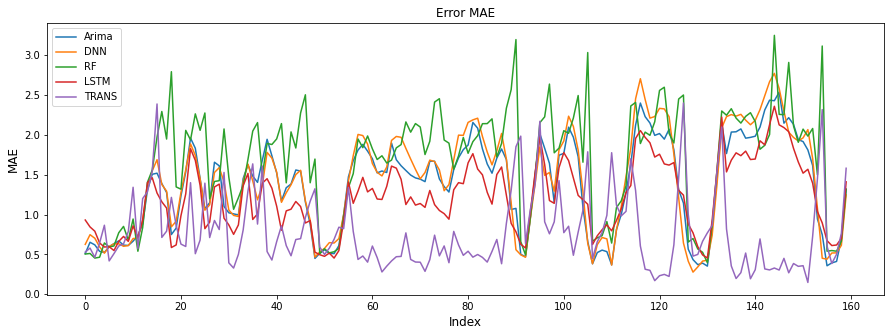

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

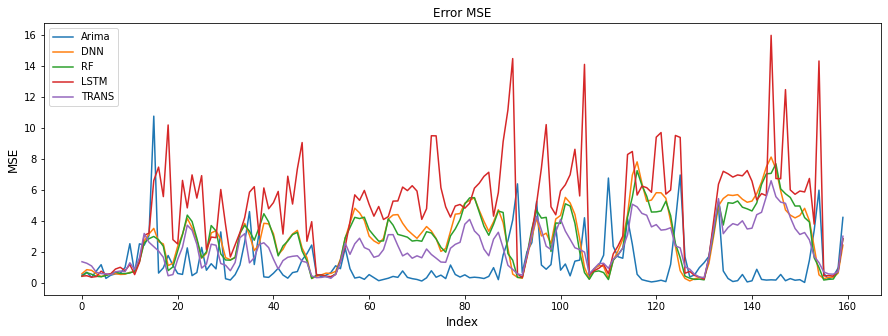

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

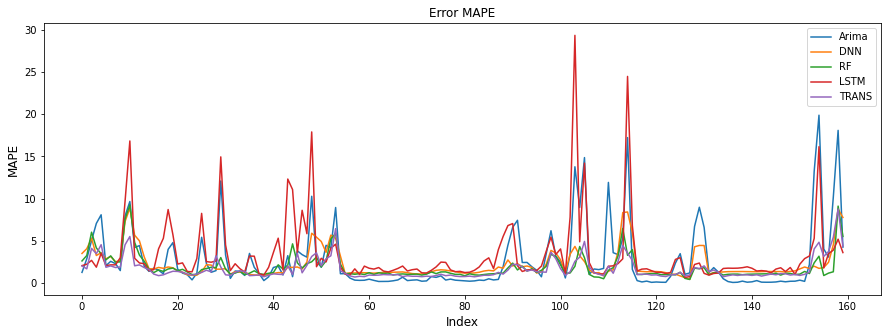

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

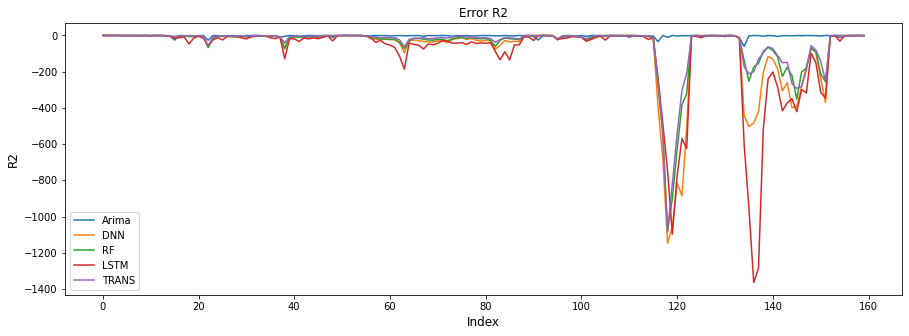

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 180

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
saltoEntreIndexs=22
ultimoIndex=testIndex + saltoEntreIndexs*180

In [ ]:
df = pandas.read_csv("./dataPreprocessed.csv")
dates_test = pandas.DataFrame(df['utc'].copy())
dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
df2=df.copy()
#
test_df2 = df2[int(lendf*testDFSlice):]
test_df2 = test_df2.reset_index(drop=True)

train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std
lendf = len(df)
test_df = df[int(lendf*testDFSlice):]
test_df = test_df.reset_index(drop=True)

dates_test = dates_test[int(lendf*testDFSlice):]
dates_test = dates_test.reset_index(drop=True)
with tf.device('/device:GPU:0'):
  for testIndex in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    print(testIndex)
    first = testIndex
    last=first+72
    nowTest = dates_test['utc'][testIndex-1]
    now = pandas.to_datetime(nowTest)
    now
    #
    rfPreds = []
    x = rfModel.predict(test_df2[first-1:first].values)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)
    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    #
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last]) ##buen indice 22->23
    #
    series = test_df[first-72:first]
    future = 72
    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    #
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    #
    df3 = test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first-24:first]
    df3['dsin']=timeEncode[['Day sin']][first-24:first]
    df3['ysin']=timeEncode[['Year sin']][first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

  0%|          | 0/180 [00:00<?, ?it/s]

72
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


  1%|          | 1/180 [00:26<1:19:28, 26.64s/it]

94
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


  1%|          | 2/180 [00:43<1:01:06, 20.60s/it]

116
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/180 [00:59<55:28, 18.81s/it]  

138
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  2%|▏         | 4/180 [01:15<51:26, 17.54s/it]

160
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  3%|▎         | 5/180 [01:30<48:29, 16.63s/it]

182
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  3%|▎         | 6/180 [01:45<47:15, 16.30s/it]

204
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  4%|▍         | 7/180 [02:01<46:41, 16.20s/it]

226
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 15ms/step


  4%|▍         | 8/180 [02:18<46:41, 16.29s/it]

248
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  5%|▌         | 9/180 [02:33<44:59, 15.79s/it]

270
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


  6%|▌         | 10/180 [02:48<44:39, 15.76s/it]

292
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 15ms/step


  6%|▌         | 11/180 [03:04<44:04, 15.65s/it]

314
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  7%|▋         | 12/180 [03:19<43:25, 15.51s/it]

336
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  7%|▋         | 13/180 [03:34<42:56, 15.43s/it]

358
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


  8%|▊         | 14/180 [03:49<42:30, 15.36s/it]

380
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  8%|▊         | 15/180 [04:05<42:53, 15.60s/it]

402
1/1 [==============================] - 0s 18ms/step


  9%|▉         | 16/180 [04:20<41:44, 15.27s/it]

424
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


  9%|▉         | 17/180 [04:36<41:59, 15.46s/it]

446
1/1 [==============================] - 0s 16ms/step


 10%|█         | 18/180 [04:50<40:27, 14.98s/it]

468
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 11%|█         | 19/180 [05:05<40:05, 14.94s/it]

490
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 11%|█         | 20/180 [05:17<38:11, 14.32s/it]

512
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 21/180 [05:33<38:53, 14.67s/it]

534
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 22/180 [05:49<39:56, 15.16s/it]

556
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 23/180 [06:05<39:51, 15.23s/it]

578
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 24/180 [06:20<39:42, 15.27s/it]

600
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 25/180 [06:35<39:26, 15.27s/it]

622
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 26/180 [06:52<39:56, 15.56s/it]

644
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 27/180 [07:07<39:32, 15.50s/it]

666
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 28/180 [07:22<39:11, 15.47s/it]

688
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 29/180 [07:38<38:47, 15.41s/it]

710
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 30/180 [07:53<38:42, 15.48s/it]

732
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 31/180 [08:09<38:36, 15.55s/it]

754
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 32/180 [08:24<38:00, 15.41s/it]

776
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 33/180 [08:40<37:50, 15.44s/it]

798
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 34/180 [08:55<37:36, 15.46s/it]

820
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 35/180 [09:11<37:22, 15.47s/it]

842
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 20%|██        | 36/180 [09:26<36:55, 15.38s/it]

864
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 21%|██        | 37/180 [09:42<37:40, 15.81s/it]

886
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 21%|██        | 38/180 [09:58<37:04, 15.67s/it]

908
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 39/180 [10:12<35:51, 15.26s/it]

930
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 40/180 [10:27<35:21, 15.16s/it]

952
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 41/180 [10:43<35:26, 15.30s/it]

974
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 42/180 [10:57<34:50, 15.14s/it]

996
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 43/180 [11:13<34:41, 15.19s/it]

1018
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 44/180 [11:30<35:31, 15.68s/it]

1040
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 45/180 [11:46<35:52, 15.94s/it]

1062
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 46/180 [12:03<35:54, 16.08s/it]

1084
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 47/180 [12:18<35:14, 15.90s/it]

1106
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 48/180 [12:35<35:34, 16.17s/it]

1128
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 49/180 [12:50<34:57, 16.01s/it]

1150
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 50/180 [13:06<34:32, 15.94s/it]

1172
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 51/180 [13:22<34:12, 15.91s/it]

1194
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 52/180 [13:38<33:39, 15.78s/it]

1216
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 53/180 [13:53<33:25, 15.79s/it]

1238
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 30%|███       | 54/180 [14:07<31:30, 15.00s/it]

1260
1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 31%|███       | 55/180 [14:20<30:32, 14.66s/it]

1282
1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 31%|███       | 56/180 [14:35<30:27, 14.74s/it]

1304
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 57/180 [14:51<30:49, 15.04s/it]

1326
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 58/180 [15:06<30:34, 15.04s/it]

1348
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 59/180 [15:21<30:32, 15.14s/it]

1370
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 60/180 [15:37<30:24, 15.20s/it]

1392
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 61/180 [15:53<30:57, 15.61s/it]

1414
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 62/180 [16:09<30:36, 15.56s/it]

1436
1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 63/180 [16:22<29:06, 14.93s/it]

1458
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 64/180 [16:39<29:38, 15.34s/it]

1480
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 65/180 [16:55<30:03, 15.69s/it]

1502
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 66/180 [17:24<37:32, 19.76s/it]

1524
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 67/180 [17:40<34:52, 18.52s/it]

1546
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 68/180 [17:56<33:10, 17.77s/it]

1568
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 69/180 [18:11<31:30, 17.03s/it]

1590
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 70/180 [18:27<30:25, 16.60s/it]

1612
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 71/180 [18:42<29:30, 16.25s/it]

1634
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 40%|████      | 72/180 [18:59<29:20, 16.30s/it]

1656
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 41%|████      | 73/180 [19:15<29:16, 16.42s/it]

1678
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 41%|████      | 74/180 [19:31<28:43, 16.26s/it]

1700
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 75/180 [19:47<28:04, 16.04s/it]

1722
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 76/180 [20:03<27:55, 16.11s/it]

1744
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 77/180 [20:19<27:27, 15.99s/it]

1766
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 78/180 [20:35<27:03, 15.92s/it]

1788
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 79/180 [20:51<26:58, 16.02s/it]

1810
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 80/180 [21:07<27:01, 16.22s/it]

1832
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 81/180 [21:24<26:39, 16.15s/it]

1854
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 82/180 [21:39<26:07, 15.99s/it]

1876
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 83/180 [21:55<25:43, 15.91s/it]

1898
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 84/180 [22:11<25:20, 15.84s/it]

1920
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 85/180 [22:27<25:29, 16.10s/it]

1942
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 86/180 [22:42<24:46, 15.82s/it]

1964
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 87/180 [22:58<24:15, 15.65s/it]

1986
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 88/180 [23:14<24:07, 15.74s/it]

2008
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 89/180 [23:30<24:15, 15.99s/it]

2030
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 50%|█████     | 90/180 [23:46<24:04, 16.05s/it]

2052
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 51%|█████     | 91/180 [24:02<23:49, 16.07s/it]

2074
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 51%|█████     | 92/180 [24:19<23:36, 16.10s/it]

2096
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 93/180 [24:35<23:19, 16.08s/it]

2118
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 94/180 [24:50<22:46, 15.89s/it]

2140
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 95/180 [25:07<22:47, 16.09s/it]

2162
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 96/180 [25:23<22:33, 16.12s/it]

2184
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 97/180 [25:39<22:12, 16.05s/it]

2206
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 98/180 [25:55<21:52, 16.00s/it]

2228
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 99/180 [26:11<21:48, 16.16s/it]

2250
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 100/180 [26:27<21:20, 16.00s/it]

2272
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 101/180 [26:43<21:06, 16.03s/it]

2294
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 102/180 [26:58<20:28, 15.75s/it]

2316
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 41ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 103/180 [27:14<20:08, 15.69s/it]

2338
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 104/180 [27:29<19:50, 15.67s/it]

2360
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 105/180 [27:45<19:37, 15.70s/it]

2382
1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 106/180 [28:00<18:58, 15.38s/it]

2404
1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 107/180 [28:14<18:15, 15.01s/it]

2426
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 60%|██████    | 108/180 [28:28<17:53, 14.91s/it]

2448
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 61%|██████    | 109/180 [28:44<17:53, 15.12s/it]

2470
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 61%|██████    | 110/180 [28:58<17:21, 14.88s/it]

2492
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 111/180 [29:14<17:31, 15.24s/it]

2514
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 112/180 [29:30<17:28, 15.41s/it]

2536
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 113/180 [29:46<17:29, 15.66s/it]

2558
1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 114/180 [29:59<16:08, 14.67s/it]

2580
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 115/180 [30:17<16:57, 15.66s/it]

2602
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 116/180 [30:34<17:14, 16.17s/it]

2624
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 117/180 [30:50<16:51, 16.06s/it]

2646
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 118/180 [31:06<16:41, 16.16s/it]

2668
1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 119/180 [31:18<15:10, 14.93s/it]

2690
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 120/180 [31:31<14:13, 14.23s/it]

2712
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 121/180 [31:48<14:48, 15.05s/it]

2734
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 122/180 [32:04<14:47, 15.31s/it]

2756
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 123/180 [32:19<14:31, 15.30s/it]

2778
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 124/180 [32:34<14:07, 15.14s/it]

2800
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 125/180 [32:49<13:55, 15.18s/it]

2822
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 15ms/step


 70%|███████   | 126/180 [33:05<13:42, 15.22s/it]

2844
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 71%|███████   | 127/180 [33:20<13:38, 15.44s/it]

2866
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 71%|███████   | 128/180 [33:36<13:31, 15.60s/it]

2888
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 129/180 [33:53<13:25, 15.79s/it]

2910
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 130/180 [34:09<13:20, 16.01s/it]

2932
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 131/180 [34:25<12:57, 15.87s/it]

2954
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 132/180 [34:41<12:44, 15.94s/it]

2976
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 133/180 [34:58<12:44, 16.27s/it]

2998
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 134/180 [35:14<12:27, 16.25s/it]

3020
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 135/180 [35:30<12:08, 16.20s/it]

3042
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 136/180 [35:47<12:00, 16.39s/it]

3064
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 137/180 [36:03<11:42, 16.35s/it]

3086
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 138/180 [36:20<11:25, 16.33s/it]

3108
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 139/180 [36:36<11:10, 16.35s/it]

3130
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 140/180 [36:52<10:55, 16.39s/it]

3152
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 141/180 [37:07<10:14, 15.76s/it]

3174
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 142/180 [37:19<09:15, 14.63s/it]

3196
1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 143/180 [37:34<09:09, 14.85s/it]

3218
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 80%|████████  | 144/180 [37:51<09:19, 15.54s/it]

3240
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 81%|████████  | 145/180 [38:08<09:13, 15.82s/it]

3262
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 81%|████████  | 146/180 [38:24<09:06, 16.06s/it]

3284
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 147/180 [38:40<08:50, 16.09s/it]

3306
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 148/180 [38:56<08:34, 16.08s/it]

3328
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 149/180 [39:12<08:10, 15.82s/it]

3350
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 150/180 [39:28<07:56, 15.89s/it]

3372
1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 151/180 [39:43<07:37, 15.76s/it]

3394
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 152/180 [39:59<07:18, 15.65s/it]

3416
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 153/180 [40:16<07:15, 16.12s/it]

3438
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 154/180 [40:33<07:07, 16.44s/it]

3460
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 155/180 [40:50<06:58, 16.75s/it]

3482
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 156/180 [41:06<06:36, 16.52s/it]

3504
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 157/180 [41:23<06:19, 16.52s/it]

3526
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 158/180 [41:39<06:03, 16.51s/it]

3548
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 159/180 [41:56<05:46, 16.49s/it]

3570
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 160/180 [42:12<05:25, 16.30s/it]

3592
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 161/180 [42:28<05:10, 16.36s/it]

3614
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 162/180 [42:44<04:51, 16.19s/it]

3636
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 163/180 [43:00<04:36, 16.26s/it]

3658
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 164/180 [43:17<04:21, 16.33s/it]

3680
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 165/180 [43:33<04:02, 16.14s/it]

3702
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 166/180 [43:49<03:48, 16.33s/it]

3724
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 167/180 [44:06<03:32, 16.36s/it]

3746
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 168/180 [44:22<03:14, 16.24s/it]

3768
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 169/180 [44:38<02:58, 16.22s/it]

3790
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 170/180 [44:55<02:43, 16.31s/it]

3812
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 171/180 [45:11<02:27, 16.42s/it]

3834
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 172/180 [45:28<02:12, 16.59s/it]

3856
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 173/180 [45:45<01:56, 16.62s/it]

3878
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 174/180 [46:01<01:38, 16.35s/it]

3900
1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 175/180 [46:15<01:18, 15.65s/it]

3922
1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 176/180 [46:30<01:01, 15.44s/it]

3944
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 177/180 [46:46<00:46, 15.64s/it]

3966
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 178/180 [47:03<00:32, 16.23s/it]

3988
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 179/180 [47:19<00:16, 16.16s/it]

4010
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


100%|██████████| 180/180 [47:36<00:00, 15.87s/it]


In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,180.000,180.000,180.000,180.000,180.000
mean,1.367,1.429,2.243,1.334,0.754
std,0.561,0.602,0.734,0.551,0.432
min,0.335,0.346,0.540,0.403,0.169
25%,0.876,0.936,1.703,0.818,0.442
50%,1.459,1.482,2.151,1.378,0.615
75%,1.806,1.899,2.718,1.749,0.980
max,2.465,2.722,3.880,2.491,2.040


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,180.000,180.000,180.000,180.000,180.000
mean,1.162,2.946,2.856,8.649,2.699
std,1.243,1.809,1.778,5.043,1.783
min,0.052,0.166,0.188,0.565,0.245
25%,0.326,1.430,1.304,4.861,1.041
50%,0.654,3.027,2.828,7.694,2.605
75%,1.481,4.339,4.087,11.893,3.945
max,6.759,7.960,7.768,22.931,7.766


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,180.000,180.000,180.000,180.000,180.000
mean,2.780,2.134,1.875,6.803,1.767
std,3.802,1.728,1.483,8.826,1.184
min,0.083,0.674,0.448,0.831,0.731
25%,0.355,1.244,1.068,1.842,1.084
50%,1.217,1.400,1.245,2.809,1.274
75%,3.410,2.087,2.088,7.611,1.918
max,21.732,10.424,11.096,57.401,7.087


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,180.000,180.000,180.000,180.000,180.000
mean,-2.866,-68.680,-50.816,-92.436,-58.637
std,10.004,165.411,120.208,175.635,150.581
min,-127.806,-1009.958,-797.266,-1024.965,-1141.034
25%,-2.463,-31.411,-21.727,-58.251,-20.053
50%,-1.174,-6.427,-6.184,-25.625,-4.777
75%,-0.546,-0.876,-0.887,-11.950,-1.407
max,0.393,0.200,0.188,-0.011,0.465


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

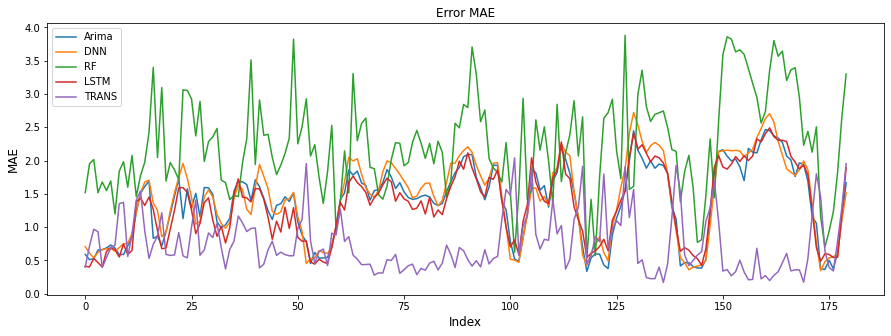

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

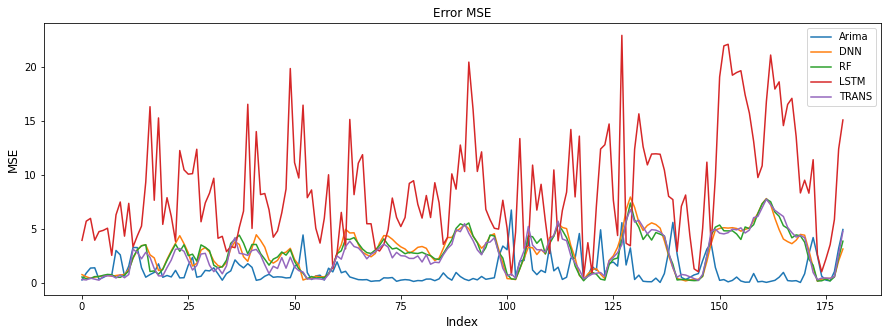

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

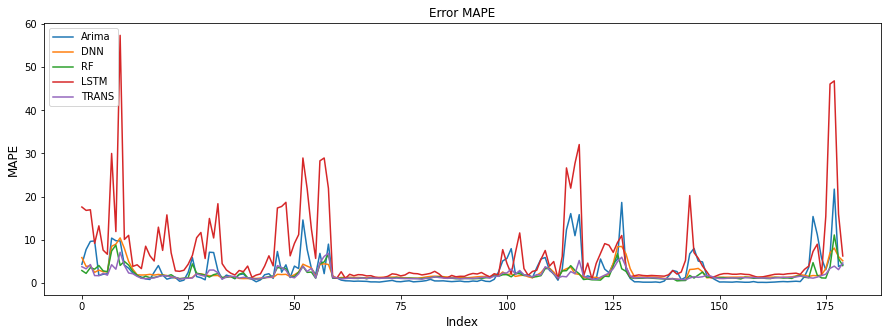

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

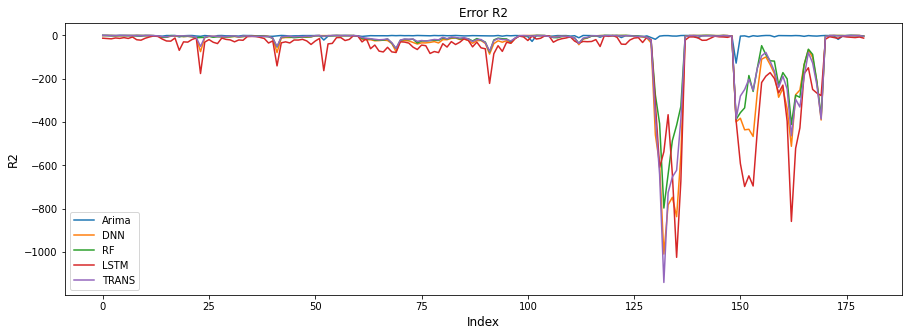

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 200

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
saltoEntreIndexs=20
ultimoIndex=testIndex + saltoEntreIndexs*200

In [ ]:
df = pandas.read_csv("./dataPreprocessed.csv")
dates_test = pandas.DataFrame(df['utc'].copy())
dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
df2=df.copy()
# 
test_df2 = df2[int(lendf*testDFSlice):]
test_df2 = test_df2.reset_index(drop=True)


train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std
lendf = len(df)
test_df = df[int(lendf*testDFSlice):]
test_df = test_df.reset_index(drop=True)

dates_test = dates_test[int(lendf*testDFSlice):]
dates_test = dates_test.reset_index(drop=True)
with tf.device('/device:GPU:0'):
  for testIndex in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    print(testIndex)
    first = testIndex
    last=first+72
    nowTest = dates_test['utc'][testIndex-1]
    now = pandas.to_datetime(nowTest)
    now
    #
    rfPreds = []
    x = rfModel.predict(test_df2[first-1:first].values)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)
    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    #
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last]) ##
    #
    series = test_df[first-72:first]
    future = 72
    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    #
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    #
    df3 = test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first-24:first]
    df3['dsin']=timeEncode[['Day sin']][first-24:first]
    df3['ysin']=timeEncode[['Year sin']][first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

  0%|          | 0/200 [00:00<?, ?it/s]

72
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  0%|          | 1/200 [00:26<1:26:44, 26.15s/it]

92
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  1%|          | 2/200 [00:41<1:05:23, 19.81s/it]

112
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


  2%|▏         | 3/200 [00:57<58:47, 17.91s/it]  

132
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


  2%|▏         | 4/200 [01:13<57:01, 17.45s/it]

152
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  2%|▎         | 5/200 [01:29<54:05, 16.64s/it]

172
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  3%|▎         | 6/200 [01:46<54:55, 16.99s/it]

192
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  4%|▎         | 7/200 [02:04<55:03, 17.12s/it]

212
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  4%|▍         | 8/200 [02:19<53:25, 16.69s/it]

232
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


  4%|▍         | 9/200 [02:36<52:31, 16.50s/it]

252
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


  5%|▌         | 10/200 [02:52<52:06, 16.45s/it]

272
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  6%|▌         | 11/200 [03:09<52:32, 16.68s/it]

292
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  6%|▌         | 12/200 [03:27<53:21, 17.03s/it]

312
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  6%|▋         | 13/200 [03:43<51:47, 16.62s/it]

332
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


  7%|▋         | 14/200 [03:58<50:35, 16.32s/it]

352
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  8%|▊         | 15/200 [04:15<50:46, 16.47s/it]

372
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  8%|▊         | 16/200 [04:31<50:08, 16.35s/it]

392
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


  8%|▊         | 17/200 [04:47<49:36, 16.27s/it]

412
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  9%|▉         | 18/200 [05:05<50:52, 16.77s/it]

432
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 10%|▉         | 19/200 [05:21<49:45, 16.50s/it]

452
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 10%|█         | 20/200 [05:34<46:19, 15.44s/it]

472
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 10%|█         | 21/200 [05:51<47:56, 16.07s/it]

492
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 11%|█         | 22/200 [06:07<47:34, 16.04s/it]

512
1/1 [==============================] - 0s 43ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 23/200 [06:23<46:42, 15.83s/it]

532
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 24/200 [06:40<47:45, 16.28s/it]

552
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 12%|█▎        | 25/200 [06:56<46:51, 16.07s/it]

572
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 26/200 [07:12<46:55, 16.18s/it]

592
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 27/200 [07:30<48:13, 16.72s/it]

612
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 28/200 [07:46<47:26, 16.55s/it]

632
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 29/200 [08:03<47:10, 16.55s/it]

652
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 30/200 [08:20<47:50, 16.88s/it]

672
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 31/200 [08:37<47:10, 16.75s/it]

692
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 32/200 [08:55<47:47, 17.07s/it]

712
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 33/200 [09:11<46:27, 16.69s/it]

732
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 34/200 [09:28<47:01, 16.99s/it]

752
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 35/200 [09:46<47:33, 17.29s/it]

772
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 36/200 [10:03<46:46, 17.11s/it]

792
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 37/200 [10:20<46:18, 17.05s/it]

812
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 38/200 [10:37<46:21, 17.17s/it]

832
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 39/200 [10:53<45:09, 16.83s/it]

852
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 20%|██        | 40/200 [11:09<44:05, 16.53s/it]

872
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


 20%|██        | 41/200 [11:27<44:46, 16.90s/it]

892
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 21%|██        | 42/200 [11:43<43:55, 16.68s/it]

912
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 43/200 [12:00<44:09, 16.87s/it]

932
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 44/200 [12:17<43:24, 16.70s/it]

952
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 22%|██▎       | 45/200 [12:33<42:36, 16.50s/it]

972
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 46/200 [12:49<42:08, 16.42s/it]

992
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 47/200 [13:05<41:17, 16.20s/it]

1012
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 48/200 [13:21<40:55, 16.16s/it]

1032
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 49/200 [13:37<40:54, 16.26s/it]

1052
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 50/200 [13:53<40:36, 16.25s/it]

1072
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 51/200 [14:11<41:13, 16.60s/it]

1092
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 52/200 [14:29<42:17, 17.15s/it]

1112
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 53/200 [14:46<42:03, 17.17s/it]

1132
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 54/200 [15:03<41:15, 16.95s/it]

1152
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 55/200 [15:22<42:10, 17.45s/it]

1172
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 56/200 [15:39<42:11, 17.58s/it]

1192
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 57/200 [15:56<41:26, 17.39s/it]

1212
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 58/200 [16:12<40:10, 16.98s/it]

1232
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 59/200 [16:29<39:38, 16.87s/it]

1252
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 30%|███       | 60/200 [16:44<38:00, 16.29s/it]

1272
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 30%|███       | 61/200 [17:00<37:55, 16.37s/it]

1292
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 31%|███       | 62/200 [17:15<36:02, 15.67s/it]

1312
1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 63/200 [17:29<34:41, 15.20s/it]

1332
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 64/200 [17:46<36:16, 16.00s/it]

1352
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 32%|███▎      | 65/200 [18:03<36:38, 16.28s/it]

1372
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 66/200 [18:19<35:48, 16.03s/it]

1392
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 67/200 [18:36<36:18, 16.38s/it]

1412
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 68/200 [18:53<36:12, 16.46s/it]

1432
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 69/200 [19:09<36:05, 16.53s/it]

1452
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 70/200 [19:26<36:04, 16.65s/it]

1472
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 71/200 [19:42<35:22, 16.45s/it]

1492
1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 72/200 [19:58<34:22, 16.11s/it]

1512
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 73/200 [20:15<34:49, 16.46s/it]

1532
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 74/200 [20:31<34:31, 16.44s/it]

1552
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 75/200 [20:49<35:10, 16.88s/it]

1572
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 76/200 [21:05<34:12, 16.55s/it]

1592
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 77/200 [21:23<34:57, 17.06s/it]

1612
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 78/200 [21:41<35:19, 17.37s/it]

1632
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 79/200 [21:57<34:08, 16.93s/it]

1652
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 40%|████      | 80/200 [22:14<33:35, 16.79s/it]

1672
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 40%|████      | 81/200 [22:32<34:06, 17.20s/it]

1692
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 41%|████      | 82/200 [22:48<33:21, 16.96s/it]

1712
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 83/200 [23:06<33:14, 17.04s/it]

1732
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 84/200 [23:22<32:51, 17.00s/it]

1752
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 42%|████▎     | 85/200 [23:39<32:26, 16.92s/it]

1772
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 86/200 [23:56<32:02, 16.86s/it]

1792
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 87/200 [24:13<31:41, 16.83s/it]

1812
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 88/200 [24:30<31:29, 16.87s/it]

1832
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 89/200 [24:48<32:04, 17.33s/it]

1852
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 90/200 [25:05<31:19, 17.08s/it]

1872
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 91/200 [25:22<31:01, 17.08s/it]

1892
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 92/200 [25:40<31:20, 17.41s/it]

1912
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 93/200 [25:56<30:29, 17.10s/it]

1932
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 94/200 [26:12<29:44, 16.83s/it]

1952
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 95/200 [26:30<30:06, 17.21s/it]

1972
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 96/200 [26:47<29:30, 17.03s/it]

1992
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 97/200 [27:03<28:51, 16.81s/it]

2012
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 98/200 [27:21<29:12, 17.18s/it]

2032
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 99/200 [27:38<28:39, 17.03s/it]

2052
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 50%|█████     | 100/200 [27:58<29:40, 17.81s/it]

2072
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 50%|█████     | 101/200 [28:14<28:37, 17.35s/it]

2092
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 51%|█████     | 102/200 [28:30<27:46, 17.01s/it]

2112
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 103/200 [28:49<28:09, 17.42s/it]

2132
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 104/200 [29:05<27:18, 17.07s/it]

2152
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 52%|█████▎    | 105/200 [29:21<26:42, 16.87s/it]

2172
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 106/200 [29:38<26:36, 16.98s/it]

2192
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 107/200 [29:55<26:01, 16.79s/it]

2212
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 108/200 [30:13<26:10, 17.07s/it]

2232
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 109/200 [30:29<25:32, 16.85s/it]

2252
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 110/200 [30:45<24:53, 16.59s/it]

2272
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 111/200 [31:04<25:40, 17.30s/it]

2292
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 112/200 [31:20<24:55, 16.99s/it]

2312
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 113/200 [31:37<24:30, 16.90s/it]

2332
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 114/200 [31:54<24:32, 17.13s/it]

2352
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 57%|█████▊    | 115/200 [32:10<23:47, 16.79s/it]

2372
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 116/200 [32:27<23:19, 16.66s/it]

2392
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 117/200 [32:44<23:24, 16.93s/it]

2412
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 118/200 [33:01<22:51, 16.72s/it]

2432
1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 119/200 [33:15<21:41, 16.07s/it]

2452
1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 60%|██████    | 120/200 [33:32<21:48, 16.36s/it]

2472
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 60%|██████    | 121/200 [33:48<21:26, 16.28s/it]

2492
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 61%|██████    | 122/200 [34:04<20:53, 16.08s/it]

2512
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 123/200 [34:23<21:47, 16.98s/it]

2532
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 124/200 [34:40<21:30, 16.98s/it]

2552
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 62%|██████▎   | 125/200 [34:58<21:29, 17.20s/it]

2572
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 126/200 [35:15<21:15, 17.24s/it]

2592
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 127/200 [35:31<20:29, 16.84s/it]

2612
1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 128/200 [35:45<19:22, 16.15s/it]

2632
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 129/200 [36:02<19:13, 16.24s/it]

2652
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 130/200 [36:20<19:40, 16.87s/it]

2672
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 131/200 [36:38<19:48, 17.22s/it]

2692
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 132/200 [36:55<19:23, 17.11s/it]

2712
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 133/200 [37:13<19:16, 17.26s/it]

2732
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 134/200 [37:29<18:38, 16.94s/it]

2752
1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 135/200 [37:45<17:55, 16.54s/it]

2772
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 136/200 [38:02<17:55, 16.81s/it]

2792
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 137/200 [38:18<17:23, 16.56s/it]

2812
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 138/200 [38:33<16:42, 16.16s/it]

2832
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 139/200 [38:49<16:13, 15.95s/it]

2852
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 70%|███████   | 140/200 [39:05<16:05, 16.10s/it]

2872
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 70%|███████   | 141/200 [39:21<15:47, 16.06s/it]

2892
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


 71%|███████   | 142/200 [39:38<15:45, 16.30s/it]

2912
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 143/200 [39:55<15:39, 16.48s/it]

2932
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 144/200 [40:12<15:27, 16.57s/it]

2952
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - ETA: 0s

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 72%|███████▎  | 145/200 [40:29<15:25, 16.83s/it]

2972
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 146/200 [40:47<15:21, 17.07s/it]

2992
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 147/200 [41:05<15:27, 17.50s/it]

3012
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 148/200 [41:22<14:57, 17.27s/it]

3032
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 149/200 [41:41<15:11, 17.88s/it]

3052
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 150/200 [41:58<14:43, 17.66s/it]

3072
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 151/200 [42:16<14:27, 17.70s/it]

3092
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 152/200 [42:33<14:04, 17.59s/it]

3112
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 153/200 [42:51<13:49, 17.65s/it]

3132
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 154/200 [43:10<13:41, 17.87s/it]

3152
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 155/200 [43:27<13:19, 17.76s/it]

3172
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 156/200 [43:46<13:22, 18.24s/it]

3192
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 157/200 [44:04<12:54, 18.01s/it]

3212
1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 158/200 [44:18<11:42, 16.72s/it]

3232
1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 159/200 [44:32<10:57, 16.04s/it]

3252
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 80%|████████  | 160/200 [44:47<10:29, 15.74s/it]

3272
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 80%|████████  | 161/200 [45:05<10:36, 16.33s/it]

3292
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 81%|████████  | 162/200 [45:23<10:44, 16.95s/it]

3312
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 163/200 [45:41<10:31, 17.06s/it]

3332
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 164/200 [45:58<10:13, 17.05s/it]

3352
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 82%|████████▎ | 165/200 [46:16<10:08, 17.39s/it]

3372
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 166/200 [46:31<09:33, 16.86s/it]

3392
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 167/200 [46:48<09:14, 16.82s/it]

3412
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 168/200 [47:04<08:53, 16.66s/it]

3432
1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 169/200 [47:17<07:59, 15.45s/it]

3452
1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 170/200 [47:35<08:01, 16.06s/it]

3472
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 171/200 [47:55<08:20, 17.26s/it]

3492
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 172/200 [48:12<08:07, 17.42s/it]

3512
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 173/200 [48:31<08:03, 17.90s/it]

3532
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 174/200 [48:48<07:38, 17.65s/it]

3552
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 175/200 [49:06<07:17, 17.51s/it]

3572
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 176/200 [49:24<07:09, 17.90s/it]

3592
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 177/200 [49:41<06:43, 17.56s/it]

3612
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 178/200 [49:59<06:26, 17.56s/it]

3632
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 179/200 [50:17<06:15, 17.87s/it]

3652
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 180/200 [50:35<05:53, 17.70s/it]

3672
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 181/200 [50:52<05:34, 17.62s/it]

3692
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 39ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 182/200 [51:11<05:25, 18.07s/it]

3712
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 183/200 [51:29<05:03, 17.85s/it]

3732
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 184/200 [51:47<04:47, 17.97s/it]

3752
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 92%|█████████▎| 185/200 [52:04<04:25, 17.72s/it]

3772
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 186/200 [52:21<04:05, 17.52s/it]

3792
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 187/200 [52:40<03:52, 17.88s/it]

3812
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 188/200 [52:57<03:31, 17.62s/it]

3832
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 189/200 [53:14<03:13, 17.58s/it]

3852
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 190/200 [53:33<02:58, 17.87s/it]

3872
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 191/200 [53:50<02:38, 17.63s/it]

3892
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 192/200 [54:08<02:23, 17.93s/it]

3912
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 193/200 [54:27<02:06, 18.06s/it]

3932
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 194/200 [54:43<01:45, 17.60s/it]

3952
1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 195/200 [54:59<01:25, 17.15s/it]

3972
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 196/200 [55:16<01:08, 17.11s/it]

3992
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 197/200 [55:34<00:51, 17.23s/it]

4012
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 198/200 [55:53<00:35, 17.81s/it]

4032
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 199/200 [56:10<00:17, 17.57s/it]

4052
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


100%|██████████| 200/200 [56:27<00:00, 16.94s/it]


In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,200.000,200.000,200.000,200.000,200.000
mean,1.343,1.407,1.374,1.169,0.769
std,0.572,0.613,0.555,0.433,0.464
min,0.349,0.292,0.306,0.414,0.171
25%,0.887,0.839,0.921,0.777,0.459
50%,1.408,1.498,1.464,1.202,0.631
75%,1.766,1.891,1.829,1.515,0.980
max,2.639,2.668,2.341,2.178,3.320


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,200.000,200.000,200.000,200.000,200.000
mean,1.279,2.895,2.819,3.172,2.116
std,2.264,1.791,1.798,1.945,1.235
min,0.049,0.119,0.167,0.135,0.259
25%,0.362,1.239,1.219,1.439,0.982
50%,0.666,2.912,2.954,3.303,2.030
75%,1.553,4.152,4.099,4.607,3.056
max,27.866,7.507,7.708,8.459,5.570


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,200.000,200.000,200.000,200.000,200.000
mean,2.619,2.126,1.885,2.755,1.772
std,3.369,1.517,1.399,2.862,1.569
min,0.083,0.601,0.467,0.513,0.639
25%,0.356,1.242,1.063,1.142,0.860
50%,1.325,1.433,1.272,1.561,1.163
75%,3.428,2.413,2.109,3.178,1.950
max,18.059,9.147,8.997,22.349,12.029


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,200.000,200.000,200.000,200.000,200.000
mean,-5.649,-70.592,-50.590,-67.609,-36.050
std,34.275,172.414,117.242,165.731,89.399
min,-456.989,-1108.052,-684.876,-1154.726,-630.893
25%,-2.457,-28.974,-20.728,-26.796,-13.567
50%,-1.123,-6.200,-5.760,-7.796,-4.158
75%,-0.534,-0.755,-0.795,-1.218,-1.068
max,0.321,0.314,0.448,0.351,0.208


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

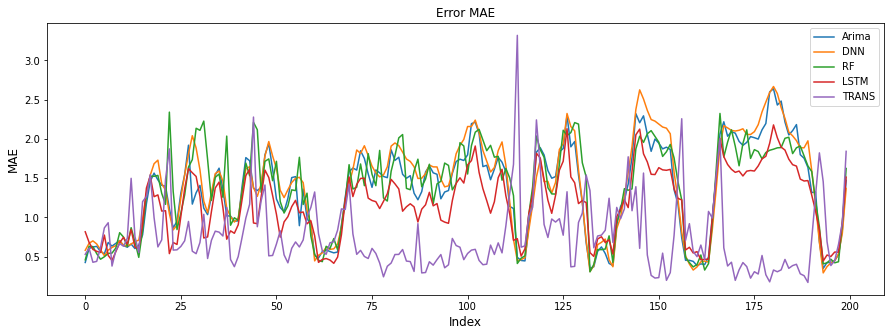

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

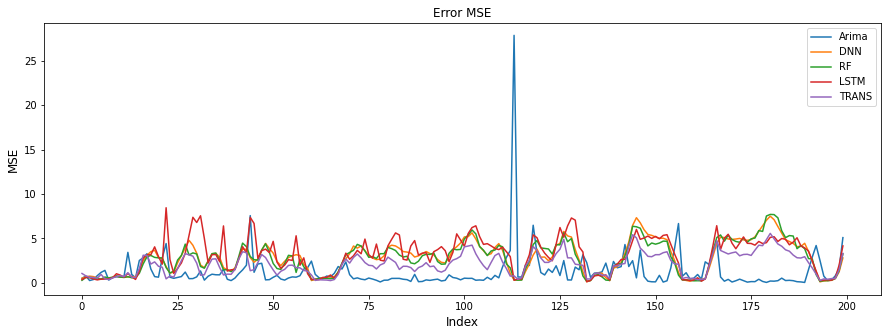

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

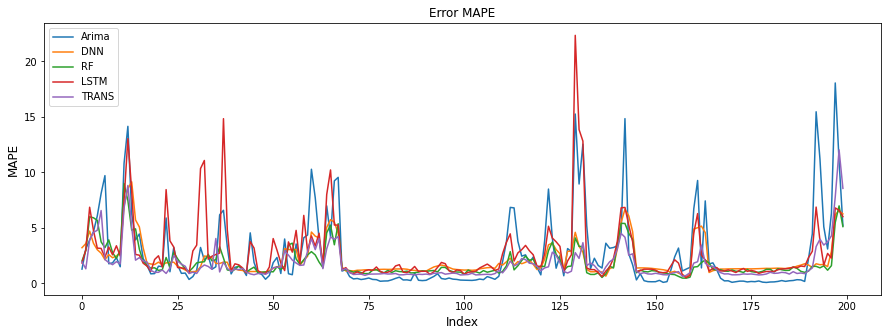

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

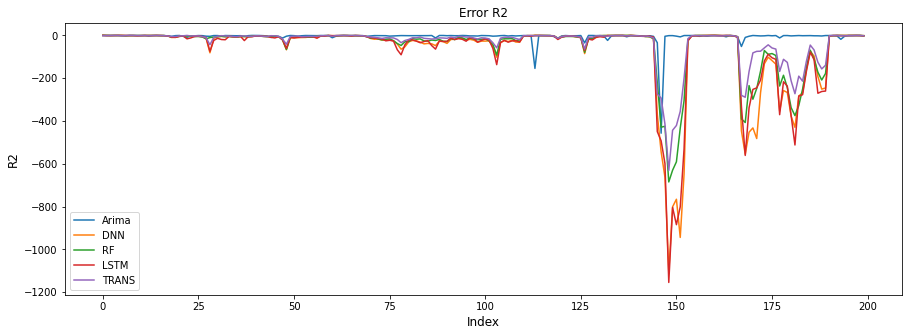

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 220

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
saltoEntreIndexs=18
ultimoIndex=testIndex + saltoEntreIndexs*220

In [ ]:
df = pandas.read_csv("./dataPreprocessed.csv")
dates_test = pandas.DataFrame(df['utc'].copy())
dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
df2=df.copy()
#
test_df2 = df2[int(lendf*testDFSlice):]
test_df2 = test_df2.reset_index(drop=True)


train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std
lendf = len(df)
test_df = df[int(lendf*testDFSlice):]
test_df = test_df.reset_index(drop=True)

dates_test = dates_test[int(lendf*testDFSlice):]
dates_test = dates_test.reset_index(drop=True)
with tf.device('/device:GPU:0'):
  for testIndex in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    print(testIndex)
    first = testIndex
    last=first+72
    nowTest = dates_test['utc'][testIndex-1]
    now = pandas.to_datetime(nowTest)
    now
    #
    rfPreds = []
    x = rfModel.predict(test_df2[first-1:first].values)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)
    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    #
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last]) ##
    #
    series = test_df[first-72:first]
    future = 72
    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    #
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    #
    df3 = test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first-24:first]
    df3['dsin']=timeEncode[['Day sin']][first-24:first]
    df3['ysin']=timeEncode[['Year sin']][first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

  0%|          | 0/220 [00:00<?, ?it/s]

72
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  0%|          | 1/220 [00:17<1:02:12, 17.05s/it]

90
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  1%|          | 2/220 [00:32<58:38, 16.14s/it]  

108
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  1%|▏         | 3/220 [00:47<56:28, 15.62s/it]

126
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


  2%|▏         | 4/220 [01:02<55:06, 15.31s/it]

144
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  2%|▏         | 5/220 [01:17<54:25, 15.19s/it]

162
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


  3%|▎         | 6/220 [01:32<54:29, 15.28s/it]

180
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


  3%|▎         | 7/220 [01:48<54:53, 15.46s/it]

198
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  4%|▎         | 8/220 [02:04<54:50, 15.52s/it]

216
1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  4%|▍         | 9/220 [02:18<52:48, 15.02s/it]

234
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  5%|▍         | 10/220 [02:32<51:50, 14.81s/it]

252
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  5%|▌         | 11/220 [02:48<52:17, 15.01s/it]

270
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  5%|▌         | 12/220 [03:06<55:23, 15.98s/it]

288
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  6%|▌         | 13/220 [03:22<55:21, 16.05s/it]

306
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  6%|▋         | 14/220 [03:36<53:17, 15.52s/it]

324
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  7%|▋         | 15/220 [03:51<52:30, 15.37s/it]

342
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


  7%|▋         | 16/220 [04:07<52:21, 15.40s/it]

360
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  8%|▊         | 17/220 [04:21<51:06, 15.11s/it]

378
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  8%|▊         | 18/220 [04:38<52:54, 15.71s/it]

396
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  9%|▊         | 19/220 [04:53<51:51, 15.48s/it]

414
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  9%|▉         | 20/220 [05:09<52:02, 15.61s/it]

432
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 10%|▉         | 21/220 [05:24<51:09, 15.43s/it]

450
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 10%|█         | 22/220 [05:38<49:06, 14.88s/it]

468
1/1 [==============================] - 0s 21ms/step


 10%|█         | 23/220 [05:52<47:53, 14.59s/it]

486
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 11%|█         | 24/220 [06:08<49:09, 15.05s/it]

504
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 25/220 [06:22<47:50, 14.72s/it]

522
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 26/220 [06:37<47:49, 14.79s/it]

540
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 27/220 [06:51<46:47, 14.55s/it]

558
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 28/220 [07:07<48:16, 15.09s/it]

576
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 29/220 [07:23<48:40, 15.29s/it]

594
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 30/220 [07:38<48:13, 15.23s/it]

612
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 31/220 [07:53<47:52, 15.20s/it]

630
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 32/220 [08:09<48:37, 15.52s/it]

648
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 33/220 [08:24<47:52, 15.36s/it]

666
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 34/220 [08:41<48:36, 15.68s/it]

684
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 35/220 [08:56<48:19, 15.67s/it]

702
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 36/220 [09:13<48:35, 15.84s/it]

720
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 37/220 [09:28<47:52, 15.70s/it]

738
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 38/220 [09:43<47:18, 15.60s/it]

756
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 39/220 [09:59<46:43, 15.49s/it]

774
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 40/220 [10:15<47:44, 15.91s/it]

792
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 41/220 [10:31<46:48, 15.69s/it]

810
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 42/220 [10:46<46:12, 15.57s/it]

828
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 43/220 [11:01<45:50, 15.54s/it]

846
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 20%|██        | 44/220 [11:17<46:05, 15.71s/it]

864
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 20%|██        | 45/220 [11:33<45:34, 15.63s/it]

882
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 21%|██        | 46/220 [11:48<44:49, 15.45s/it]

900
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 47/220 [12:02<43:17, 15.01s/it]

918
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 48/220 [12:19<44:56, 15.68s/it]

936
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 49/220 [12:36<45:21, 15.91s/it]

954
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 50/220 [12:50<44:07, 15.57s/it]

972
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 51/220 [13:05<43:12, 15.34s/it]

990
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 52/220 [13:22<43:53, 15.68s/it]

1008
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 53/220 [13:37<43:23, 15.59s/it]

1026
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 54/220 [13:52<42:19, 15.30s/it]

1044
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 55/220 [14:07<41:46, 15.19s/it]

1062
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 56/220 [14:23<42:51, 15.68s/it]

1080
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 57/220 [14:39<42:50, 15.77s/it]

1098
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 58/220 [14:55<42:42, 15.82s/it]

1116
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 59/220 [15:11<42:06, 15.69s/it]

1134
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 60/220 [15:28<43:01, 16.14s/it]

1152
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 61/220 [15:44<42:25, 16.01s/it]

1170
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 62/220 [16:00<42:04, 15.98s/it]

1188
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 63/220 [16:15<41:40, 15.93s/it]

1206
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 64/220 [16:33<42:31, 16.36s/it]

1224
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 65/220 [16:48<41:22, 16.02s/it]

1242
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 30%|███       | 66/220 [17:04<41:04, 16.00s/it]

1260
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 30%|███       | 67/220 [17:20<40:56, 16.06s/it]

1278
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 31%|███       | 68/220 [17:35<39:44, 15.69s/it]

1296
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 69/220 [17:49<38:12, 15.18s/it]

1314
1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 70/220 [18:02<36:27, 14.58s/it]

1332
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 71/220 [18:17<36:35, 14.73s/it]

1350
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 72/220 [18:35<38:23, 15.57s/it]

1368
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 73/220 [18:49<37:08, 15.16s/it]

1386
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 74/220 [19:04<37:12, 15.29s/it]

1404
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 75/220 [19:20<37:06, 15.35s/it]

1422
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 76/220 [19:36<37:40, 15.70s/it]

1440
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 77/220 [19:52<36:57, 15.51s/it]

1458
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 78/220 [20:07<36:37, 15.47s/it]

1476
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 79/220 [20:22<36:24, 15.49s/it]

1494
1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 80/220 [20:38<36:28, 15.64s/it]

1512
1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 81/220 [20:55<36:31, 15.77s/it]

1530
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 82/220 [21:10<35:48, 15.57s/it]

1548
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 83/220 [21:25<35:34, 15.58s/it]

1566
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 84/220 [21:42<36:18, 16.02s/it]

1584
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 85/220 [21:58<35:52, 15.94s/it]

1602
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 86/220 [22:14<35:23, 15.84s/it]

1620
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 87/220 [22:29<34:48, 15.70s/it]

1638
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 40%|████      | 88/220 [22:46<35:24, 16.09s/it]

1656
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 40%|████      | 89/220 [23:02<35:04, 16.07s/it]

1674
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 41%|████      | 90/220 [23:18<34:35, 15.97s/it]

1692
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 91/220 [23:34<34:20, 15.97s/it]

1710
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 92/220 [23:52<35:35, 16.68s/it]

1728
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 93/220 [24:08<34:46, 16.43s/it]

1746
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 94/220 [24:22<33:01, 15.72s/it]

1764
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 95/220 [24:37<32:34, 15.64s/it]

1782
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 96/220 [24:56<34:08, 16.52s/it]

1800
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 97/220 [25:12<33:29, 16.34s/it]

1818
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 98/220 [25:28<32:56, 16.20s/it]

1836
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 99/220 [25:44<32:36, 16.17s/it]

1854
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 100/220 [26:01<32:52, 16.44s/it]

1872
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 101/220 [26:17<32:22, 16.32s/it]

1890
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 102/220 [26:33<32:09, 16.35s/it]

1908
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 103/220 [26:49<31:34, 16.19s/it]

1926
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 104/220 [27:06<31:35, 16.34s/it]

1944
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 105/220 [27:21<30:39, 16.00s/it]

1962
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 106/220 [27:37<30:09, 15.87s/it]

1980
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 107/220 [27:53<30:19, 16.10s/it]

1998
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 108/220 [28:09<29:32, 15.83s/it]

2016
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 109/220 [28:24<29:13, 15.80s/it]

2034
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 50%|█████     | 110/220 [28:40<28:57, 15.79s/it]

2052
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 50%|█████     | 111/220 [28:57<29:03, 16.00s/it]

2070
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 51%|█████     | 112/220 [29:14<29:20, 16.31s/it]

2088
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 113/220 [29:30<29:03, 16.29s/it]

2106
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 114/220 [29:45<28:20, 16.04s/it]

2124
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 115/220 [30:01<28:02, 16.02s/it]

2142
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 116/220 [30:17<27:24, 15.81s/it]

2160
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 117/220 [30:32<27:10, 15.83s/it]

2178
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 118/220 [30:48<26:38, 15.67s/it]

2196
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 119/220 [31:04<26:39, 15.83s/it]

2214
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 120/220 [31:21<26:46, 16.06s/it]

2232
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 121/220 [31:36<26:13, 15.89s/it]

2250
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 122/220 [31:52<25:56, 15.89s/it]

2268
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 123/220 [32:09<26:01, 16.10s/it]

2286
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 124/220 [32:25<25:43, 16.07s/it]

2304
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 125/220 [32:40<25:04, 15.84s/it]

2322
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 126/220 [32:56<24:46, 15.82s/it]

2340
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 127/220 [33:12<24:41, 15.93s/it]

2358
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 128/220 [33:29<24:50, 16.20s/it]

2376
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 129/220 [33:44<24:08, 15.91s/it]

2394
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 130/220 [34:00<23:52, 15.91s/it]

2412
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 131/220 [34:16<23:35, 15.90s/it]

2430
1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 60%|██████    | 132/220 [34:30<22:42, 15.48s/it]

2448
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 60%|██████    | 133/220 [34:45<22:17, 15.37s/it]

2466
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 61%|██████    | 134/220 [35:01<22:08, 15.45s/it]

2484
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


 61%|██████▏   | 135/220 [35:17<21:59, 15.52s/it]

2502
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 136/220 [35:33<21:53, 15.64s/it]

2520
3/3 [==============================] - 0s 12ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 137/220 [35:48<21:38, 15.65s/it]

2538
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 138/220 [36:04<21:30, 15.74s/it]

2556
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 139/220 [36:21<21:50, 16.17s/it]

2574
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 140/220 [36:37<21:33, 16.17s/it]

2592
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 141/220 [36:53<21:01, 15.97s/it]

2610
1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 142/220 [37:06<19:25, 14.95s/it]

2628
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 143/220 [37:21<19:20, 15.07s/it]

2646
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 144/220 [37:40<20:37, 16.29s/it]

2664
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 145/220 [37:57<20:43, 16.58s/it]

2682
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 146/220 [38:13<20:06, 16.30s/it]

2700
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 147/220 [38:29<19:54, 16.36s/it]

2718
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 148/220 [38:47<20:04, 16.73s/it]

2736
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 149/220 [39:01<18:58, 16.03s/it]

2754
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 150/220 [39:16<18:10, 15.57s/it]

2772
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 151/220 [39:32<18:09, 15.78s/it]

2790
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 152/220 [39:49<18:23, 16.22s/it]

2808
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 153/220 [40:04<17:40, 15.83s/it]

2826
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 70%|███████   | 154/220 [40:20<17:27, 15.87s/it]

2844
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


 70%|███████   | 155/220 [40:36<17:02, 15.73s/it]

2862
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 71%|███████   | 156/220 [40:53<17:12, 16.13s/it]

2880
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 157/220 [41:09<16:55, 16.12s/it]

2898
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 158/220 [41:25<16:36, 16.08s/it]

2916
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 159/220 [41:41<16:19, 16.06s/it]

2934
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 160/220 [41:59<16:36, 16.61s/it]

2952
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 161/220 [42:16<16:29, 16.78s/it]

2970
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 162/220 [42:31<15:49, 16.37s/it]

2988
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 163/220 [42:48<15:39, 16.47s/it]

3006
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 164/220 [43:04<15:18, 16.40s/it]

3024
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 165/220 [43:21<15:08, 16.52s/it]

3042
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 166/220 [43:38<14:53, 16.54s/it]

3060
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 167/220 [43:55<14:47, 16.74s/it]

3078
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 168/220 [44:11<14:25, 16.65s/it]

3096
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 169/220 [44:28<14:05, 16.58s/it]

3114
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 170/220 [44:44<13:46, 16.52s/it]

3132
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 171/220 [45:02<13:45, 16.84s/it]

3150
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 172/220 [45:22<14:14, 17.81s/it]

3168
3/3 [==============================] - 0s 16ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 173/220 [45:48<15:50, 20.23s/it]

3186
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 174/220 [46:05<14:51, 19.38s/it]

3204
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 175/220 [46:20<13:36, 18.15s/it]

3222
1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 80%|████████  | 176/220 [46:33<12:03, 16.44s/it]

3240
1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 80%|████████  | 177/220 [46:48<11:29, 16.03s/it]

3258
1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 81%|████████  | 178/220 [47:05<11:27, 16.38s/it]

3276
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 179/220 [47:23<11:24, 16.69s/it]

3294
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 180/220 [47:39<11:06, 16.67s/it]

3312
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 181/220 [47:56<10:49, 16.64s/it]

3330
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 182/220 [48:12<10:28, 16.53s/it]

3348
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 183/220 [48:30<10:22, 16.83s/it]

3366
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 184/220 [48:46<10:06, 16.84s/it]

3384
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 185/220 [49:02<09:38, 16.54s/it]

3402
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 186/220 [49:19<09:26, 16.67s/it]

3420
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 187/220 [49:35<09:02, 16.45s/it]

3438
1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 188/220 [49:48<08:16, 15.50s/it]

3456
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 189/220 [50:06<08:17, 16.06s/it]

3474
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 190/220 [50:23<08:09, 16.33s/it]

3492
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 191/220 [50:41<08:12, 16.99s/it]

3510
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 192/220 [51:00<08:09, 17.49s/it]

3528
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 193/220 [51:16<07:43, 17.17s/it]

3546
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 194/220 [51:34<07:27, 17.20s/it]

3564
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 195/220 [51:49<06:59, 16.78s/it]

3582
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 196/220 [52:06<06:40, 16.68s/it]

3600
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 197/220 [52:22<06:17, 16.40s/it]

3618
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 198/220 [52:39<06:07, 16.71s/it]

3636
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 199/220 [52:55<05:47, 16.55s/it]

3654
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 200/220 [53:11<05:27, 16.39s/it]

3672
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 201/220 [53:28<05:12, 16.42s/it]

3690
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 202/220 [53:44<04:57, 16.53s/it]

3708
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 203/220 [54:02<04:45, 16.79s/it]

3726
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 204/220 [54:19<04:29, 16.85s/it]

3744
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 205/220 [54:36<04:11, 16.78s/it]

3762
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 206/220 [54:54<04:00, 17.14s/it]

3780
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 207/220 [55:10<03:39, 16.92s/it]

3798
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 208/220 [55:28<03:26, 17.20s/it]

3816
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 209/220 [55:45<03:07, 17.08s/it]

3834
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 210/220 [56:03<02:55, 17.50s/it]

3852
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 211/220 [56:19<02:34, 17.17s/it]

3870
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 212/220 [56:36<02:14, 16.84s/it]

3888
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 213/220 [56:52<01:57, 16.84s/it]

3906
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 214/220 [57:10<01:42, 17.11s/it]

3924
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 215/220 [57:26<01:23, 16.79s/it]

3942
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 216/220 [57:41<01:05, 16.35s/it]

3960
1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 217/220 [57:55<00:46, 15.60s/it]

3978
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 218/220 [58:14<00:33, 16.50s/it]

3996
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 219/220 [58:30<00:16, 16.48s/it]

4014
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


100%|██████████| 220/220 [58:47<00:00, 16.03s/it]


In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,220.000,220.000,220.000,220.000,220.000
mean,1.373,1.412,2.194,1.230,0.774
std,0.585,0.614,0.828,0.436,0.462
min,0.329,0.292,0.477,0.449,0.140
25%,0.868,0.845,1.602,0.845,0.450
50%,1.468,1.490,2.303,1.242,0.645
75%,1.799,1.948,2.856,1.551,1.006
max,2.582,2.654,3.720,2.271,2.379


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,220.000,220.000,220.000,220.000,220.000
mean,1.278,2.900,2.904,8.674,2.273
std,1.556,1.802,1.857,5.595,1.318
min,0.033,0.140,0.155,0.385,0.283
25%,0.343,1.233,1.236,4.081,1.078
50%,0.680,2.900,2.841,8.160,2.101
75%,1.546,4.319,4.223,13.020,3.187
max,11.186,7.518,8.162,22.308,6.294


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,220.000,220.000,220.000,220.000,220.000
mean,2.569,2.095,1.891,4.855,1.672
std,3.447,1.533,1.410,5.714,1.218
min,0.081,0.371,0.472,0.912,0.772
25%,0.383,1.266,1.084,1.600,0.949
50%,1.323,1.409,1.268,2.572,1.192
75%,3.174,2.237,2.217,5.565,1.742
max,19.721,10.268,10.338,43.072,7.996


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,220.000,220.000,220.000,220.000,220.000
mean,-4.692,-70.597,-56.204,-80.756,-42.414
std,21.224,169.724,138.690,169.791,110.128
min,-283.649,-1029.967,-944.030,-1311.525,-887.606
25%,-2.467,-30.828,-22.039,-54.541,-16.142
50%,-1.166,-6.228,-6.749,-22.023,-4.275
75%,-0.491,-0.733,-0.974,-8.242,-1.830
max,0.375,0.420,0.343,0.201,0.079


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

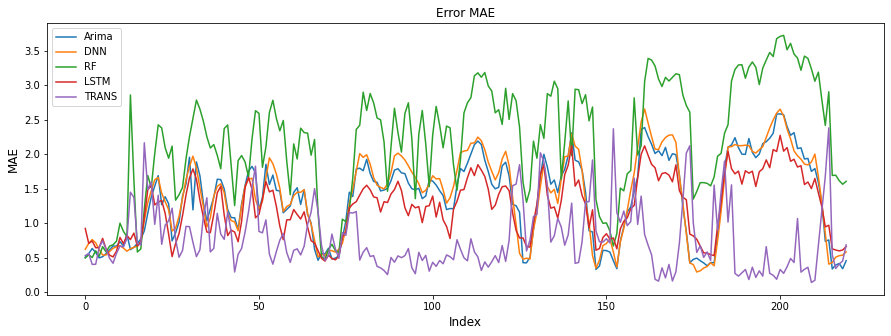

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

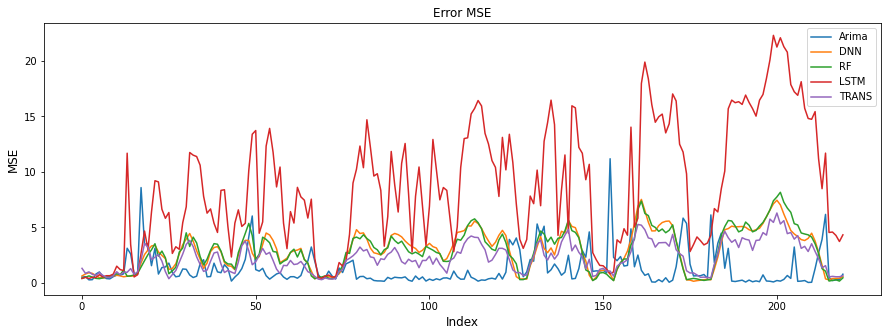

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

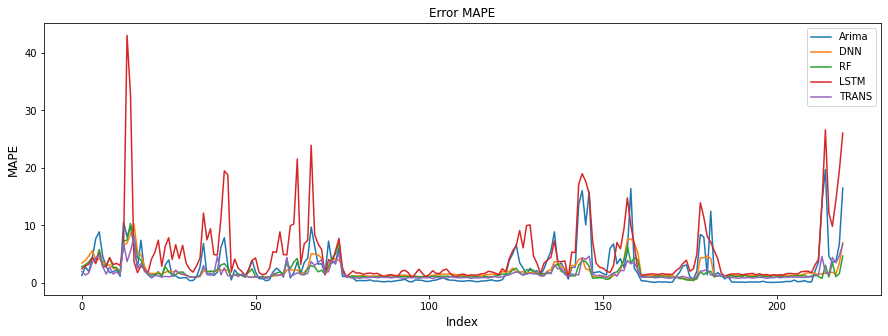

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

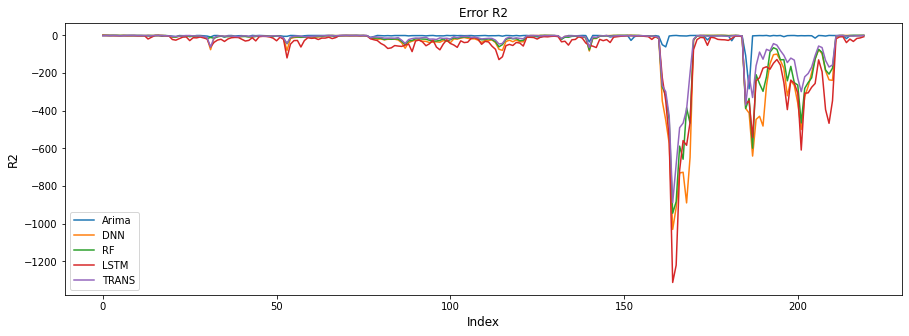

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')

## Horizonte 240

In [ ]:
mae = []
mse = []
mape = []
r2 = [] #
testIndex=72
saltoEntreIndexs=16
ultimoIndex=testIndex + saltoEntreIndexs*240

In [ ]:
df = pandas.read_csv("./dataPreprocessed.csv")
dates_test = pandas.DataFrame(df['utc'].copy())
dates_df = pandas.to_datetime(df['utc'], format='%Y-%m-%d %H:%M:%S')
timestamp_s = dates_df.map(pandas.Timestamp.timestamp)
timeEncode['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
timeEncode['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))

df = createTimeFeatures(df)
df = df[['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']]
df2=df.copy()
#
test_df2 = df2[int(lendf*testDFSlice):]
test_df2 = test_df2.reset_index(drop=True)


train_mean = df.mean()
train_std = df.std()
df = (df - train_mean) / train_std
lendf = len(df)
test_df = df[int(lendf*testDFSlice):]
test_df = test_df.reset_index(drop=True)

dates_test = dates_test[int(lendf*testDFSlice):]
dates_test = dates_test.reset_index(drop=True)
with tf.device('/device:GPU:0'):
  for testIndex in tqdm(range(72,ultimoIndex,saltoEntreIndexs)):
    print(testIndex)
    first = testIndex
    last=first+72
    nowTest = dates_test['utc'][testIndex-1]
    now = pandas.to_datetime(nowTest)
    now
    #
    rfPreds = []
    x = rfModel.predict(test_df2[first-1:first].values)
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],delta.hour,delta.day,delta.month],dtype="float32")
        rfPreds.append(temp)
        temp_RE = np.reshape(temp,(-1,6))
        x = rfModel.predict(temp_RE)
    rfPreds2 = pandas.DataFrame(rfPreds)
    rfPreds2.columns = ['Ts_Valor','HR_Valor','QFE_Valor','hour','day','month']
    rfPreds2 = (rfPreds2 - train_mean)/train_std
    #
    dnnPreds = dnnModel.predict(test_df[['hour','day','month']][first:last]) ##buen indice 22->23
    #
    series = test_df[first-72:first]
    future = 72
    arimaPreds = pandas.DataFrame()
    model = ARIMA(series['Ts_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['Ts_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['HR_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['HR_Valor'] = model_fit.forecast(future)
    model = ARIMA(series['QFE_Valor'], order=(24,1,1))
    model_fit = model.fit()
    arimaPreds['QFE_Valor'] = model_fit.forecast(future)
    #
    df3 = test_df[first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((1,winSize,6))
    x = lstmModel.predict(df3)
    lstmPreds = []
    for i in range(0,72):
        delta = now + datetime.timedelta(0,i*3600)
        temp = np.array([x[0,0],x[0,1],x[0,2],norm(delta.hour,3),norm(delta.day,4),norm(delta.month,5)],dtype="float32")
        lstmPreds.append(temp)
        cde = np.reshape(df3,(24,6))
        df3 = np.vstack((cde,temp))
        df3 = np.delete(df3, (0), axis=0)
        df3 = np.reshape(df3,(-1,24,6))
        x = lstmModel.predict(df3)
    lstmPreds = np.array(lstmPreds)
    #
    df3 = test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first-24:first]
    df3['dsin']=timeEncode[['Day sin']][first-24:first]
    df3['ysin']=timeEncode[['Year sin']][first-24:first]
    df3 = df3.to_numpy()
    df3 = df3.reshape((-1,winSize,5))

    transPreds = transModel.predict(df3)
    a = transModel.predict(transPreds)
    b = transModel.predict(a)
    transPreds = np.hstack((transPreds,a))
    transPreds = np.hstack((transPreds,b))
    transPreds = transPreds.reshape(72,5)
    maeList = []
    mseList = []
    mapeList = []
    r2List = []
    #
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    maeList.append(mean_absolute_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    #
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mseList.append(mean_squared_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    mapeList.append(mean_absolute_percentage_error(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], arimaPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], dnnPreds))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], rfPreds2[['Ts_Valor','HR_Valor','QFE_Valor']]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], lstmPreds[0:,0:3]))
    r2List.append(r2_score(test_df[['Ts_Valor','HR_Valor','QFE_Valor']][first:last], transPreds[0:,0:3]))
    #
    mae.append(maeList)
    mse.append(mseList)
    mape.append(mapeList)
    r2.append(r2List)

  0%|          | 0/240 [00:00<?, ?it/s]

72
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  0%|          | 1/240 [00:17<1:11:12, 17.88s/it]

88
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  1%|          | 2/240 [00:32<1:03:27, 16.00s/it]

104
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  1%|▏         | 3/240 [00:47<1:01:22, 15.54s/it]

120
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  2%|▏         | 4/240 [01:02<59:26, 15.11s/it]  

136
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  2%|▏         | 5/240 [01:17<59:30, 15.19s/it]

152
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


  2%|▎         | 6/240 [01:33<1:00:20, 15.47s/it]

168
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  3%|▎         | 7/240 [01:48<59:56, 15.43s/it]  

184
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  3%|▎         | 8/240 [02:03<59:16, 15.33s/it]

200
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


  4%|▍         | 9/240 [02:18<58:29, 15.19s/it]

216
1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


  4%|▍         | 10/240 [02:34<58:29, 15.26s/it]

232
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  5%|▍         | 11/240 [02:48<57:08, 14.97s/it]

248
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  5%|▌         | 12/240 [03:03<57:01, 15.01s/it]

264
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  5%|▌         | 13/240 [03:20<58:30, 15.47s/it]

280
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  6%|▌         | 14/240 [03:37<1:00:44, 16.13s/it]

296
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  6%|▋         | 15/240 [03:52<59:07, 15.77s/it]  

312
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  7%|▋         | 16/240 [04:08<58:28, 15.66s/it]

328
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  7%|▋         | 17/240 [04:22<56:38, 15.24s/it]

344
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  8%|▊         | 18/240 [04:37<55:53, 15.11s/it]

360
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


  8%|▊         | 19/240 [04:51<54:51, 14.89s/it]

376
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


  8%|▊         | 20/240 [05:06<54:46, 14.94s/it]

392
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  9%|▉         | 21/240 [05:21<54:44, 15.00s/it]

408
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


  9%|▉         | 22/240 [05:36<54:14, 14.93s/it]

424
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 10%|▉         | 23/240 [05:50<53:29, 14.79s/it]

440
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 10%|█         | 24/240 [06:04<52:26, 14.57s/it]

456
1/1 [==============================] - 0s 17ms/step


 10%|█         | 25/240 [06:17<50:19, 14.04s/it]

472
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 11%|█         | 26/240 [06:32<50:46, 14.23s/it]

488
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 27/240 [06:48<52:08, 14.69s/it]

504
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 28/240 [07:02<51:06, 14.47s/it]

520
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 29/240 [07:16<50:20, 14.32s/it]

536
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 12%|█▎        | 30/240 [07:29<48:55, 13.98s/it]

552
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 31/240 [07:43<49:12, 14.13s/it]

568
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 32/240 [08:00<51:45, 14.93s/it]

584
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 33/240 [08:16<52:25, 15.20s/it]

600
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 34/240 [08:31<52:11, 15.20s/it]

616
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 35/240 [08:46<51:35, 15.10s/it]

632
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 36/240 [09:02<51:49, 15.24s/it]

648
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 37/240 [09:16<51:12, 15.14s/it]

664
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 38/240 [09:32<51:26, 15.28s/it]

680
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 39/240 [09:48<51:56, 15.51s/it]

696
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 40/240 [10:04<51:48, 15.54s/it]

712
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 41/240 [10:20<51:59, 15.67s/it]

728
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 42/240 [10:35<51:09, 15.50s/it]

744
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 43/240 [10:52<52:08, 15.88s/it]

760
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 44/240 [11:07<51:18, 15.71s/it]

776
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 45/240 [11:24<52:02, 16.01s/it]

792
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 46/240 [11:39<51:11, 15.83s/it]

808
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 47/240 [11:55<50:56, 15.84s/it]

824
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 20%|██        | 48/240 [12:11<50:33, 15.80s/it]

840
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 20%|██        | 49/240 [12:27<51:03, 16.04s/it]

856
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 21%|██        | 50/240 [12:42<49:31, 15.64s/it]

872
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 51/240 [12:59<50:21, 15.98s/it]

888
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 52/240 [13:14<49:05, 15.67s/it]

904
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 53/240 [13:29<48:27, 15.55s/it]

920
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 22%|██▎       | 54/240 [13:46<49:14, 15.89s/it]

936
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 55/240 [14:01<48:40, 15.78s/it]

952
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 56/240 [14:17<48:04, 15.68s/it]

968
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 57/240 [14:32<47:32, 15.59s/it]

984
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 58/240 [14:47<46:35, 15.36s/it]

1000
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 59/240 [15:02<45:50, 15.20s/it]

1016
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 60/240 [15:16<45:10, 15.06s/it]

1032
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 61/240 [15:31<45:01, 15.09s/it]

1048
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 62/240 [15:48<45:51, 15.46s/it]

1064
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 63/240 [16:04<46:36, 15.80s/it]

1080
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 64/240 [16:21<46:43, 15.93s/it]

1096
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 65/240 [16:36<46:25, 15.92s/it]

1112
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 66/240 [16:54<47:45, 16.47s/it]

1128
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 67/240 [17:10<46:48, 16.23s/it]

1144
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 68/240 [17:28<47:49, 16.68s/it]

1160
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 69/240 [17:44<47:25, 16.64s/it]

1176
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 70/240 [18:02<48:10, 17.00s/it]

1192
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 71/240 [18:17<46:25, 16.48s/it]

1208
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 30%|███       | 72/240 [18:33<45:38, 16.30s/it]

1224
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 30%|███       | 73/240 [18:49<44:53, 16.13s/it]

1240
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 31%|███       | 74/240 [19:06<45:48, 16.56s/it]

1256
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 75/240 [19:22<44:32, 16.20s/it]

1272
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 76/240 [19:38<44:36, 16.32s/it]

1288
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 77/240 [19:53<42:41, 15.71s/it]

1304
1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 32%|███▎      | 78/240 [20:08<42:23, 15.70s/it]

1320
1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 79/240 [20:24<41:48, 15.58s/it]

1336
1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 80/240 [20:39<41:00, 15.38s/it]

1352
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 81/240 [20:55<41:13, 15.56s/it]

1368
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 82/240 [21:10<40:51, 15.52s/it]

1384
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 83/240 [21:26<40:53, 15.63s/it]

1400
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 84/240 [21:42<40:49, 15.70s/it]

1416
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 85/240 [21:59<41:37, 16.11s/it]

1432
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 86/240 [22:15<41:01, 15.98s/it]

1448
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 87/240 [22:31<40:59, 16.08s/it]

1464
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 88/240 [22:46<40:18, 15.91s/it]

1480
1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 89/240 [23:01<39:08, 15.55s/it]

1496
1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 90/240 [23:15<37:28, 14.99s/it]

1512
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 91/240 [23:33<39:38, 15.96s/it]

1528
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 92/240 [23:51<40:44, 16.52s/it]

1544
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 93/240 [24:07<39:54, 16.29s/it]

1560
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 94/240 [24:23<39:29, 16.23s/it]

1576
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 95/240 [24:40<39:47, 16.47s/it]

1592
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 40%|████      | 96/240 [24:55<38:58, 16.24s/it]

1608
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 40%|████      | 97/240 [25:11<38:22, 16.10s/it]

1624
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 41%|████      | 98/240 [25:27<37:48, 15.98s/it]

1640
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 99/240 [25:44<38:21, 16.33s/it]

1656
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 100/240 [26:00<37:57, 16.27s/it]

1672
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 101/240 [26:16<37:14, 16.08s/it]

1688
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 42%|████▎     | 102/240 [26:33<38:06, 16.57s/it]

1704
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 103/240 [26:50<38:05, 16.68s/it]

1720
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 104/240 [27:06<37:03, 16.35s/it]

1736
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 105/240 [27:21<36:07, 16.05s/it]

1752
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 106/240 [27:37<35:50, 16.05s/it]

1768
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 107/240 [27:53<35:23, 15.97s/it]

1784
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 108/240 [28:10<35:46, 16.26s/it]

1800
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 109/240 [28:26<35:27, 16.24s/it]

1816
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 110/240 [28:42<35:00, 16.16s/it]

1832
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 111/240 [28:58<34:21, 15.98s/it]

1848
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 112/240 [29:15<35:00, 16.41s/it]

1864
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 113/240 [29:31<34:38, 16.36s/it]

1880
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 114/240 [29:49<34:55, 16.63s/it]

1896
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 115/240 [30:05<34:19, 16.48s/it]

1912
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 116/240 [30:22<34:25, 16.66s/it]

1928
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 117/240 [30:38<33:32, 16.36s/it]

1944
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 118/240 [30:53<32:41, 16.07s/it]

1960
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 119/240 [31:09<32:33, 16.14s/it]

1976
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 34ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 50%|█████     | 120/240 [31:26<32:52, 16.44s/it]

1992
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 50%|█████     | 121/240 [31:42<32:12, 16.24s/it]

2008
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 51%|█████     | 122/240 [31:58<31:41, 16.12s/it]

2024
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 123/240 [32:14<31:19, 16.06s/it]

2040
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 124/240 [32:31<31:25, 16.26s/it]

2056
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 125/240 [32:47<30:54, 16.12s/it]

2072
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 52%|█████▎    | 126/240 [33:03<30:35, 16.10s/it]

2088
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 127/240 [33:20<30:48, 16.35s/it]

2104
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 128/240 [33:36<30:25, 16.30s/it]

2120
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 129/240 [33:53<30:40, 16.58s/it]

2136
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 130/240 [34:08<29:46, 16.24s/it]

2152
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 131/240 [34:24<29:20, 16.15s/it]

2168
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 132/240 [34:40<28:44, 15.96s/it]

2184
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 133/240 [34:56<28:42, 16.10s/it]

2200
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 134/240 [35:12<28:06, 15.91s/it]

2216
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 135/240 [35:28<27:54, 15.95s/it]

2232
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 136/240 [35:43<27:28, 15.85s/it]

2248
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 137/240 [36:01<28:08, 16.39s/it]

2264
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


 57%|█████▊    | 138/240 [36:17<27:52, 16.40s/it]

2280
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 139/240 [36:34<27:28, 16.32s/it]

2296
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 140/240 [36:49<26:52, 16.12s/it]

2312
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 141/240 [37:06<26:42, 16.18s/it]

2328
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 142/240 [37:22<26:27, 16.20s/it]

2344
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 143/240 [37:37<25:56, 16.05s/it]

2360
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 60%|██████    | 144/240 [37:54<25:41, 16.06s/it]

2376
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 60%|██████    | 145/240 [38:09<25:13, 15.93s/it]

2392
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 61%|██████    | 146/240 [38:27<25:36, 16.35s/it]

2408
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 147/240 [38:42<24:46, 15.98s/it]

2424
1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 148/240 [38:56<23:46, 15.51s/it]

2440
1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 149/240 [39:11<23:12, 15.30s/it]

2456
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 62%|██████▎   | 150/240 [39:27<23:08, 15.42s/it]

2472
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 151/240 [39:42<22:58, 15.49s/it]

2488
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 152/240 [39:58<22:46, 15.52s/it]

2504
1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 153/240 [40:13<22:19, 15.39s/it]

2520
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 154/240 [40:29<22:34, 15.75s/it]

2536
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 155/240 [40:46<22:42, 16.03s/it]

2552
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 156/240 [41:04<23:07, 16.52s/it]

2568
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 157/240 [41:20<22:40, 16.39s/it]

2584
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 158/240 [41:34<21:28, 15.72s/it]

2600
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 159/240 [41:50<21:18, 15.78s/it]

2616
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 160/240 [42:05<20:51, 15.65s/it]

2632
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 161/240 [42:21<20:33, 15.61s/it]

2648
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 162/240 [42:38<20:54, 16.08s/it]

2664
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 163/240 [42:57<21:40, 16.89s/it]

2680
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 164/240 [43:13<20:57, 16.55s/it]

2696
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 36ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 165/240 [43:29<20:41, 16.56s/it]

2712
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 166/240 [43:47<20:46, 16.84s/it]

2728
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 167/240 [44:01<19:30, 16.03s/it]

2744
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 70%|███████   | 168/240 [44:13<17:58, 14.97s/it]

2760
1/1 [==============================] - 0s 18ms/step


 70%|███████   | 169/240 [44:29<17:56, 15.16s/it]

2776
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 71%|███████   | 170/240 [44:46<18:24, 15.79s/it]

2792
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 171/240 [45:01<17:57, 15.62s/it]

2808
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 172/240 [45:18<17:54, 15.80s/it]

2824
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 173/240 [45:32<17:16, 15.47s/it]

2840
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 72%|███████▎  | 174/240 [45:48<16:58, 15.44s/it]

2856
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 175/240 [46:03<16:37, 15.35s/it]

2872
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 176/240 [46:19<16:37, 15.58s/it]

2888
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 177/240 [46:33<16:01, 15.26s/it]

2904
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 178/240 [46:49<15:55, 15.41s/it]

2920
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 179/240 [47:05<15:54, 15.65s/it]

2936
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 180/240 [47:21<15:39, 15.66s/it]

2952
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 181/240 [47:39<16:03, 16.33s/it]

2968
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 182/240 [47:56<15:58, 16.52s/it]

2984
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 183/240 [48:12<15:34, 16.39s/it]

3000
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 184/240 [48:26<14:43, 15.78s/it]

3016
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 185/240 [48:44<15:00, 16.37s/it]

3032
3/3 [==============================] - 0s 5ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 37ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 186/240 [49:02<15:03, 16.74s/it]

3048
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 187/240 [49:18<14:38, 16.57s/it]

3064
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 188/240 [49:34<14:08, 16.32s/it]

3080
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 189/240 [49:49<13:39, 16.06s/it]

3096
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 39ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 190/240 [50:07<13:47, 16.55s/it]

3112
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 191/240 [50:23<13:29, 16.52s/it]

3128
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 80%|████████  | 192/240 [50:40<13:15, 16.58s/it]

3144
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


 80%|████████  | 193/240 [50:57<13:08, 16.78s/it]

3160
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


 81%|████████  | 194/240 [51:15<13:01, 17.00s/it]

3176
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 195/240 [51:31<12:38, 16.86s/it]

3192
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 196/240 [51:48<12:14, 16.70s/it]

3208
1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 197/240 [52:01<11:13, 15.66s/it]

3224
1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 82%|████████▎ | 198/240 [52:12<10:04, 14.39s/it]

3240
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 199/240 [52:28<10:08, 14.85s/it]

3256
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 200/240 [52:45<10:20, 15.51s/it]

3272
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 201/240 [53:03<10:27, 16.09s/it]

3288
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 202/240 [53:18<10:07, 15.98s/it]

3304
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 203/240 [53:35<10:03, 16.30s/it]

3320
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 204/240 [53:53<09:57, 16.60s/it]

3336
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 205/240 [54:10<09:44, 16.70s/it]

3352
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 206/240 [54:26<09:20, 16.48s/it]

3368
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 29ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 207/240 [54:41<08:49, 16.05s/it]

3384
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 208/240 [54:58<08:42, 16.33s/it]

3400
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 209/240 [55:14<08:21, 16.19s/it]

3416
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 210/240 [55:28<07:49, 15.66s/it]

3432
1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 211/240 [55:40<07:03, 14.59s/it]

3448
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 212/240 [55:54<06:46, 14.52s/it]

3464
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 213/240 [56:14<07:10, 15.96s/it]

3480
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 214/240 [56:41<08:22, 19.33s/it]

3496
3/3 [==============================] - 0s 11ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 35ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 215/240 [57:02<08:13, 19.73s/it]

3512
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 216/240 [57:20<07:46, 19.43s/it]

3528
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 38ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 217/240 [57:37<07:07, 18.59s/it]

3544
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 218/240 [57:53<06:34, 17.92s/it]

3560
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 219/240 [58:10<06:06, 17.45s/it]

3576
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 220/240 [58:27<05:49, 17.49s/it]

3592
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 221/240 [58:44<05:27, 17.21s/it]

3608
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 92%|█████████▎| 222/240 [59:00<05:03, 16.87s/it]

3624
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 223/240 [59:15<04:40, 16.48s/it]

3640
3/3 [==============================] - 0s 8ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 224/240 [59:32<04:25, 16.57s/it]

3656
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 225/240 [59:50<04:11, 16.79s/it]

3672
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 226/240 [1:00:06<03:54, 16.76s/it]

3688
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 227/240 [1:00:23<03:38, 16.78s/it]

3704
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 228/240 [1:00:40<03:20, 16.73s/it]

3720
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 229/240 [1:00:57<03:06, 16.92s/it]

3736
3/3 [==============================] - 0s 3ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 230/240 [1:01:14<02:49, 16.92s/it]

3752
3/3 [==============================] - 0s 7ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 231/240 [1:01:34<02:40, 17.87s/it]

3768
3/3 [==============================] - 0s 14ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 232/240 [1:02:01<02:44, 20.54s/it]

3784
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 28ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 233/240 [1:02:17<02:15, 19.39s/it]

3800
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 234/240 [1:02:34<01:51, 18.55s/it]

3816
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 235/240 [1:02:51<01:30, 18.09s/it]

3832
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 236/240 [1:03:08<01:11, 17.87s/it]

3848
3/3 [==============================] - 0s 4ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 237/240 [1:03:26<00:53, 17.75s/it]

3864
3/3 [==============================] - 0s 9ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 26ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 238/240 [1:03:42<00:34, 17.21s/it]

3880
3/3 [==============================] - 0s 10ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 239/240 [1:03:59<00:17, 17.18s/it]

3896
3/3 [==============================] - 0s 6ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 24ms/step


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


1/1 [==============================] - 0s 25ms/step


100%|██████████| 240/240 [1:04:15<00:00, 16.07s/it]


In [ ]:
maeDF = pandas.DataFrame(mae)
maeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAE')
maeDF.describe().round(3)

MAE


,arima,dnn,rf,lstm,trans
count,240.000,240.000,240.000,240.000,240.000
mean,1.396,1.439,2.170,1.240,0.772
std,0.571,0.601,0.830,0.423,0.467
min,0.311,0.292,0.424,0.430,0.132
25%,0.910,0.950,1.549,0.864,0.442
50%,1.477,1.509,2.249,1.238,0.616
75%,1.848,1.935,2.865,1.570,0.989
max,2.582,2.662,3.705,2.312,2.367


In [ ]:
mseDF = pandas.DataFrame(mse)
mseDF.columns = ['arima','dnn','rf','lstm','trans']
print('MSE')
mseDF.describe().round(3)

MSE


,arima,dnn,rf,lstm,trans
count,240.000,240.000,240.000,240.000,240.000
mean,1.262,2.974,2.959,8.602,2.286
std,1.526,1.770,1.821,5.618,1.277
min,0.030,0.140,0.150,0.311,0.280
25%,0.340,1.473,1.395,3.629,1.195
50%,0.640,3.046,2.968,7.909,2.085
75%,1.575,4.341,4.280,13.461,3.197
max,11.186,7.570,8.105,21.970,6.294


In [ ]:
mapeDF = pandas.DataFrame(mape)
mapeDF.columns = ['arima','dnn','rf','lstm','trans']
print('MAPE')
mapeDF.describe().round(3)

MAPE


,arima,dnn,rf,lstm,trans
count,240.000,240.000,240.000,240.000,240.000
mean,2.435,2.078,1.882,4.220,1.562
std,3.174,1.510,1.470,4.125,1.091
min,0.090,0.371,0.419,0.888,0.744
25%,0.355,1.263,1.092,1.566,0.932
50%,1.324,1.391,1.270,2.466,1.128
75%,3.056,2.259,2.051,5.284,1.707
max,18.636,9.450,10.079,22.214,8.189


In [ ]:
r2DF = pandas.DataFrame(r2)
r2DF.columns = ['arima','dnn','rf','lstm','trans']
print('R2')
r2DF.describe().round(3)

R2


,arima,dnn,rf,lstm,trans
count,240.000,240.000,240.000,240.000,240.000
mean,-3.555,-72.525,-55.775,-83.910,-43.249
std,11.309,173.018,133.170,177.359,111.851
min,-147.382,-987.791,-822.644,-1295.663,-786.323
25%,-2.392,-32.831,-22.190,-54.421,-16.570
50%,-1.184,-7.177,-6.735,-22.419,-4.635
75%,-0.514,-0.886,-0.973,-7.453,-1.787
max,0.277,0.420,0.343,0.201,0.216


In [ ]:
maes_mean = maeDF.mean()
mses_mean = mseDF.mean()
mapes_mean = mapeDF.mean()
r2s_mean = r2DF.mean()

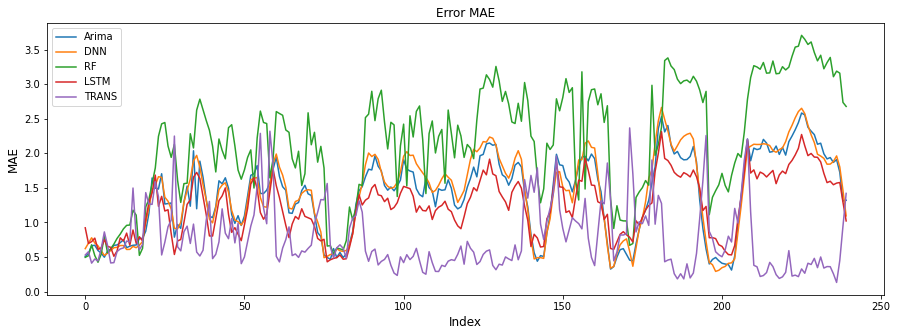

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAE")
plt.plot(maeDF['arima'], label='Arima')
plt.plot(maeDF['dnn'], label='DNN')
plt.plot(maeDF['rf'], label='RF')
plt.plot(maeDF['lstm'], label='LSTM')
plt.plot(maeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAE', fontsize=12)
plt.legend(loc='best')

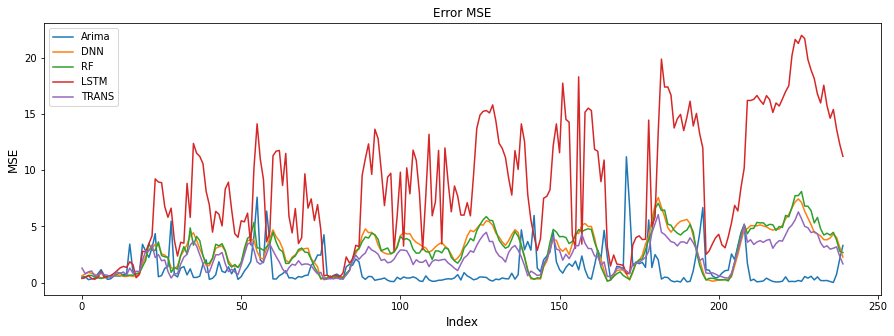

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MSE")
plt.plot(mseDF['arima'], label='Arima')
plt.plot(mseDF['dnn'], label='DNN')
plt.plot(mseDF['rf'], label='RF')
plt.plot(mseDF['lstm'], label='LSTM')
plt.plot(mseDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.legend(loc='best')

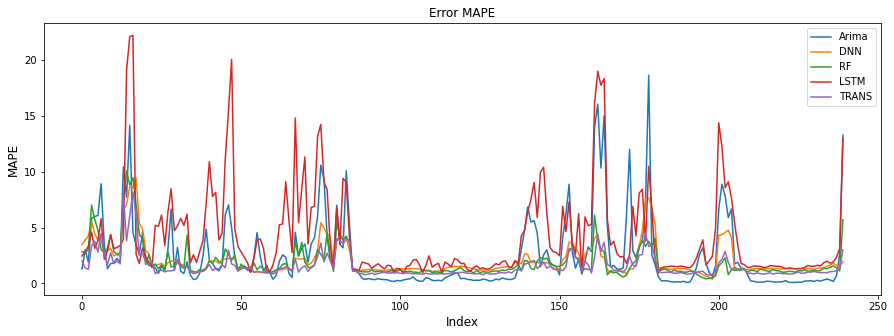

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error MAPE")
plt.plot(mapeDF['arima'], label='Arima')
plt.plot(mapeDF['dnn'], label='DNN')
plt.plot(mapeDF['rf'], label='RF')
plt.plot(mapeDF['lstm'], label='LSTM')
plt.plot(mapeDF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('MAPE', fontsize=12)
plt.legend(loc='best')

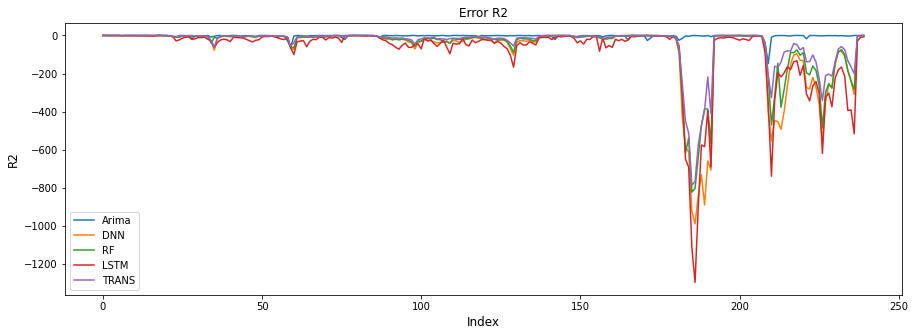

In [ ]:
fig = plt.figure(figsize=(15,5))
plt.title("Error R2")
plt.plot(r2DF['arima'], label='Arima')
plt.plot(r2DF['dnn'], label='DNN')
plt.plot(r2DF['rf'], label='RF')
plt.plot(r2DF['lstm'], label='LSTM')
plt.plot(r2DF['trans'], label='TRANS')
plt.xlabel('Index', fontsize=12)
plt.ylabel('R2', fontsize=12)
plt.legend(loc='best')